In [1]:
import os
import glob

basedir = 'vehicles/'

img_types = os.listdir(basedir)
cars = []
for img_type in img_types:
    cars.extend(glob.glob(basedir+img_type+'/*'))
    
print('Number of Vehicle Images Found:', len(cars))

with open('cars.txt', 'w') as f:
    for fn in cars:
        f.write(fn+'/n')
        
basedir = 'non-vehicles/'

img_types = os.listdir(basedir)
notcars = []
for img_type in img_types:
    notcars.extend(glob.glob(basedir+img_type+'/*'))

print('Number if Non-Vehicle Images Found:', len(notcars))

with open('notcars.txt', 'w') as f:
    for fn in notcars:
        f.write(fn+'/n')

Number of Vehicle Images Found: 8792
Number if Non-Vehicle Images Found: 8968


In [15]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import cv2
import time
from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from scipy.ndimage.measurements import label
from moviepy.editor import VideoFileClip

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=True, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=True, 
                       visualise=vis, feature_vector=feature_vec)
        return features
    
def bin_spatial(img, color_space='RGB', size=(64, 64)):
    # Convert image to new color space (if specified)
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)             
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(feature_image, size).ravel() 
    # Return the feature vector
    return features

# Define a function to compute color histogram features  
def color_hist(img, nbins=32):
    # Compute the histogram of the RGB channels separately
    rhist = np.histogram(img[:,:,0], bins=nbins)
    ghist = np.histogram(img[:,:,1], bins=nbins)
    bhist = np.histogram(img[:,:,2], bins=nbins)
    # Generating bin centers
    bin_edges = rhist[1]
    bin_centers = (bin_edges[1:]  + bin_edges[0:len(bin_edges)-1])/2
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((rhist[0], ghist[0], bhist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, 
                        viz=False, viz_only=False, hog_viz_name="", viz_title="HOG Viz"):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if viz == True:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature, hog_image = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=True, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
                # Plot HOG visualisation
                
                if viz_only == True:
                    fig = plt.figure()
                    plt.imshow(hog_image)
                    plt.title(viz_title)
                    plt.savefig(hog_viz_name, bbox_inches='tight')
                    
                else:
                    fig = plt.figure()
                    plt.subplot(121)
                    plt.imshow(image)
                    plt.title('Example Image')
                    plt.subplot(122)
                    plt.imshow(hog_image)
                    plt.title('Example HOG viz')
                    plt.savefig(hog_viz_name + "_double", bbox_inches='tight')
                
            else:
                if hog_channel == 'ALL':
                    hog_features = []
                    for channel in range(feature_image.shape[2]):
                        hog_feature = get_hog_features(feature_image[:,:,channel], 
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=False, feature_vec=True)
                        hog_features.append(hog_feature)
                    hog_features = np.ravel(hog_features)        
                else:
                    hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    random_color = False
    # Iterate through the bounding boxes
    for bbox in bboxes:
        if color == 'random' or random_color:
            color = (np.random.randint(0,255), np.random.randint(0,255), np.random.randint(0,255))
            random_color = True
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy

def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient,
                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        img_features.append(hog_features)
    if vis == True:
        return np.concatenate(img_features), hog_image 
    else:
        return np.concatenate(img_features)

def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows

def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3:
            plt.imshow(img, cmap='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])
        

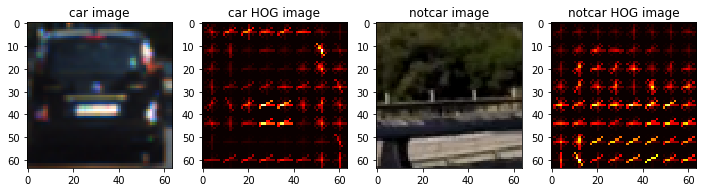

In [4]:
%matplotlib inline

car_ind = np.random.randint(0, len(cars))
notcar_ind = np.random.randint(0, len(notcars))

car_image = mpimg.imread(cars[car_ind])
notcar_image = mpimg.imread(notcars[notcar_ind])

color_space = 'RGB'
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 
spatial_size = (16,16)
hist_bins = 16
spatial_feat = True
hist_feat = True 
hog_feat = True

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)
notcar_features, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat, vis=True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', 'car HOG image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))
visualize(fig, 1, 4, images, titles)

In [5]:
color_space = 'YCrCb'
orient = 9
pix_per_cell = 8
cell_per_block = 2
hog_channel = 'ALL'
spatial_size = (64, 64)
hist_bins = 32
spatial_feat = True
hist_feat = True
hog_feat = True

t = time.time()
n_samples = 1000
random_idxs = np.random.randint(0, len(cars), n_samples)
test_cars = cars #np.array(cars)[random_idxs]
test_notcars = notcars #np.array(notcars)[random_idxs]

car_features = extract_features(test_cars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)
notcar_features = extract_features(test_notcars, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient,
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat)

print(time.time()-t, 'Seconds to compute features...')

X = np.vstack((car_features, notcar_features)).astype(np.float64)
X_scaler = StandardScaler().fit(X)
scaled_X = X_scaler.transform(X)

y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))

rand_state = np.random.randint(0, 100)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.1, random_state=rand_state)

print('Using:',orient,'orientations,',pix_per_cell,
     'pixels per cell, ', cell_per_block, 'cells per block, ',
     hist_bins, 'histogram bins, and', spatial_size, 'spatial sampling')
print('Feature vector length:', len(X_train[0]))

svc = LinearSVC()

t=time.time()
svc.fit(X_train, y_train)
print(round(time.time()-t, 2), 'Seconds to train SVC...')
print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))


109.78463196754456 Seconds to compute features...
Using: 9 orientations, 8 pixels per cell,  2 cells per block,  32 histogram bins, and (64, 64) spatial sampling
Feature vector length: 17676
55.43 Seconds to train SVC...
Test Accuracy of SVC =  0.9882


0.0 1.0
0.7437160015106201 seconds to process one image searching 100 windows
0.0 1.0
0.5869519710540771 seconds to process one image searching 100 windows
0.0 1.0
0.5457708835601807 seconds to process one image searching 100 windows
0.0 1.0
0.5594749450683594 seconds to process one image searching 100 windows
0.0 1.0
0.5167140960693359 seconds to process one image searching 100 windows
0.0 1.0
0.5364420413970947 seconds to process one image searching 100 windows


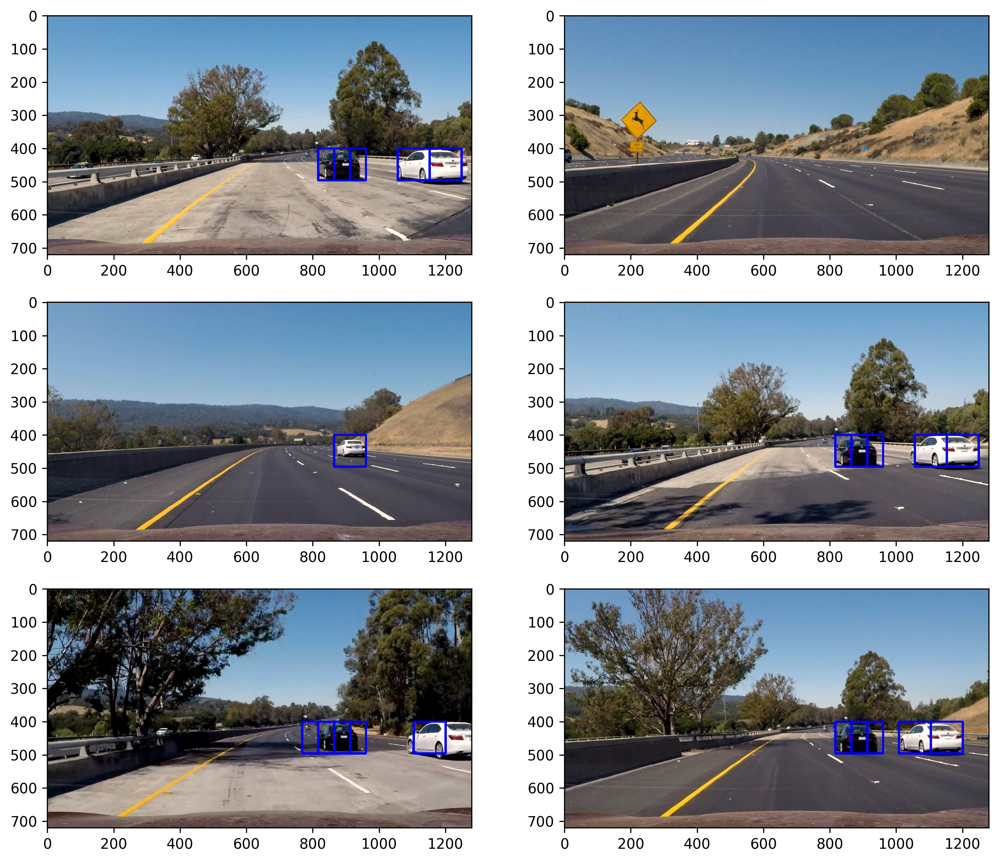

In [6]:
searchpath = 'test_images/*'
example_images = glob.glob(searchpath)
images = []
titles = []
y_start_stop = [400, 656]
overlap = 0.5
for img_src in example_images:
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    print(np.min(img), np.max(img))

    windows = slide_window(img, x_start_stop=[None, None], y_start_stop=y_start_stop,
                        xy_window=(96, 96), xy_overlap=(overlap, overlap))

    hot_windows = search_windows(img, windows, svc, X_scaler, color_space=color_space,
                            spatial_size=spatial_size, hist_bins=hist_bins,
                            orient=orient, pix_per_cell=pix_per_cell,
                            cell_per_block=cell_per_block,
                            hog_channel=hog_channel, spatial_feat=spatial_feat,
                            hist_feat=hist_feat, hog_feat=hog_feat)

    window_img = draw_boxes(draw_img, hot_windows, color=(0,0,255), thick=6)
    images.append(window_img)
    titles.append('')
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')

fig = plt.figure(figsize=(12,18), dpi=300)
visualize(fig, 5, 2, images, titles)

In [7]:
def convert_color(img, conv='RGB2YCrCb'):
    if conv == 'RGB2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    if conv == 'BGR2YCrCb':
        return cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    if conv == 'RGB2LUV':
        return cv2.cvtColor(img, cv2.COLOR_RGB2LUV)

0.6098191738128662 seconds to run, total windows =  294
0.5405759811401367 seconds to run, total windows =  294
0.7567529678344727 seconds to run, total windows =  294
0.6248600482940674 seconds to run, total windows =  294
0.8083698749542236 seconds to run, total windows =  294
1.201287031173706 seconds to run, total windows =  294


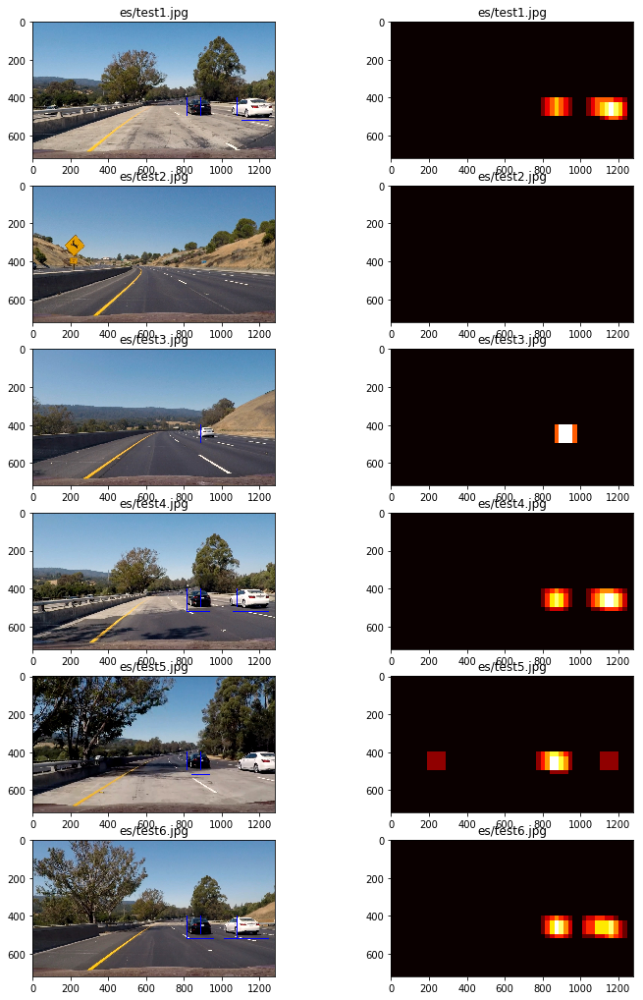

In [8]:
out_images = []
out_maps = []
out_titles = []
out_boxes = []

ystart = 400
ystop = 656
scale = 1.5
    
for img_src in example_images:
    img_boxes = []
    t = time.time()
    count = 0
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    heatmap = np.zeros_like(img[:,:,0])
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv='RGB2YCrCb')
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    window = 64
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                heatmap[ytop_draw+ystart:ytop_draw+win_draw+ystart, xbox_left:xbox_left+win_draw] += 1
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    
    out_images.append(draw_img)
    out_titles.append(img_src[-12:])
    out_titles.append(img_src[-12:])
    out_images.append(heatmap)
    out_maps.append(heatmap)
    out_boxes.append(img_boxes)
    
fig = plt.figure(figsize=(12,24))
visualize(fig, 8, 2, out_images, out_titles)

1.012948989868164 seconds to run, total windows =  304
0.4671211242675781 seconds to run, total windows =  196
0.33629798889160156 seconds to run, total windows =  144


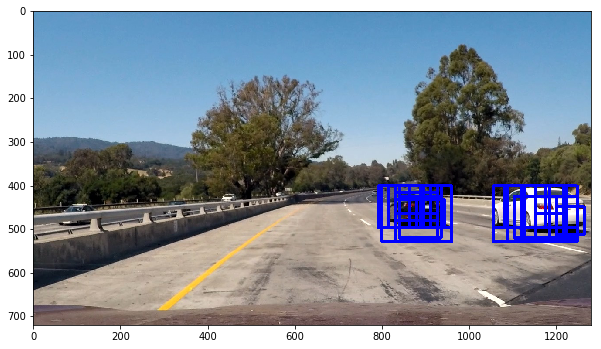

In [9]:
def find_cars (img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale):
    img_boxes = []
    t = time.time()
    count = 0
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    img_tosearch = img[ystart:ystop,:, :]
    ctrans_tosearch = convert_color(img_tosearch, conv=conv)
    if scale != 1:
        imshape= ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell) - 1
    nyblocks = (ch1.shape[0] // pix_per_cell) - 1
    nfeat_per_block = orient*cell_per_block**2
    nblocks_per_window = (window // pix_per_cell) - 1
    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            count += 1
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)
            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            test_prediction = svc.predict(test_features)
            
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                cv2.rectangle(draw_img,(xbox_left, ytop_draw+ystart), (xbox_left+win_draw, ytop_draw+win_draw+ystart), (0,0,255))
                img_boxes.append(((xbox_left, ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
                
    print(time.time()-t, 'seconds to run, total windows = ', count)
    return(img_boxes)

car_rectangles = None
out_images = []
out_titles = []
all_rectangles = []
window = 64
orient = 9
pix_per_cell = 8
cell_per_block = 2
conv = 'RGB2YCrCb'
test_img = mpimg.imread('./test_images/test1.jpg')

ystart = 400
ystop = 528
scale = 1.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

ystart = 400
ystop = 592
scale = 1.5
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

scale = 2.0
ystart = 400
ystop = 656
scale = 2.0
car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
all_rectangles.append(car_rectangles)

rectangles = [item for sublist in all_rectangles for item in sublist]

img_final = draw_boxes(test_img, rectangles, color=(0,0,255), thick=6)
plt.figure(figsize=(10,10))
plt.imshow(img_final)


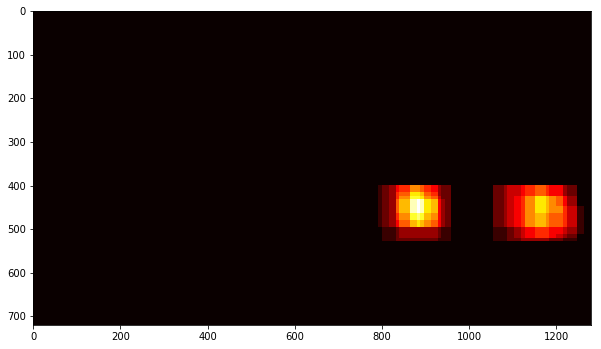

In [10]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img, rectangles)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

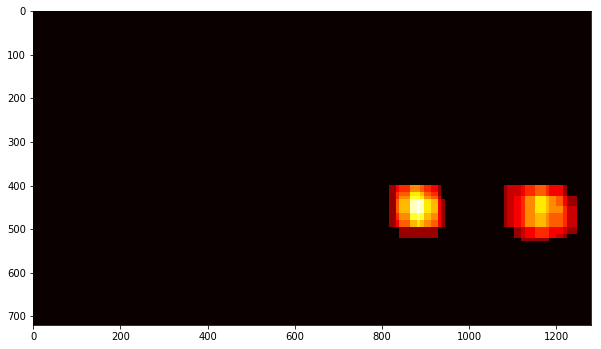

In [11]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

heatmap_img = apply_threshold(heatmap_img, 2)
plt.figure(figsize=(10,10))
plt.imshow(heatmap_img, cmap='hot')

2 cars found


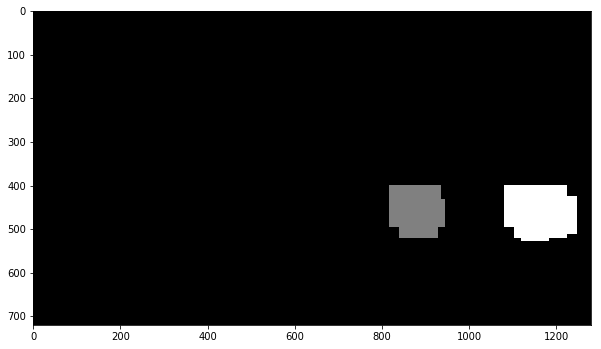

In [12]:
labels = label(heatmap_img)
plt.figure(figsize=(10,10))
plt.imshow(labels[0], cmap='gray')
print(labels[1], 'cars found')

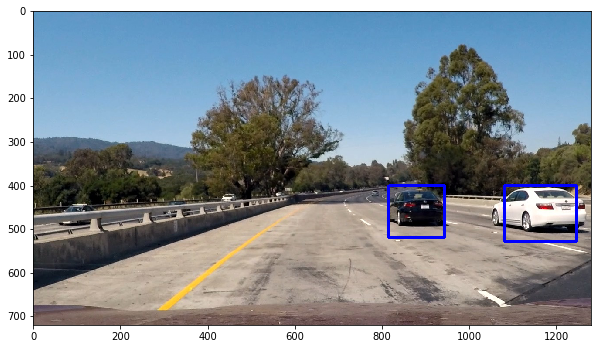

In [13]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    rects = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        rects.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image and final rectangles
    return img, rects

# Draw bounding boxes on a copy of the image
draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
# Display the image
plt.figure(figsize=(10,10))
plt.imshow(draw_img)

In [20]:
def process_img_pipeline(img): 
    car_rectangles = None
    out_images = []
    out_titles = []
    all_rectangles = []
    window = 64
    orient = 9
    pix_per_cell = 8
    cell_per_block = 2
    conv = 'RGB2YCrCb'
    test_img = img

    ystart = 400
    ystop = 528
    scale = 1.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    ystart = 400
    ystop = 592
    scale = 1.5
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    scale = 2.0
    ystart = 400
    ystop = 656
    scale = 2.0
    car_rectangles = find_cars(test_img, ystart, ystop, window, conv, orient, pix_per_cell, cell_per_block, scale)
    all_rectangles.append(car_rectangles)

    rectangles = [item for sublist in all_rectangles for item in sublist]
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img, rectangles)
    
    heatmap_img = apply_threshold(heatmap_img, 2)
    
    labels = label(heatmap_img)
    
    draw_img, rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    return draw_img

In [21]:
clip_out_file = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.35710716247558594 seconds to run, total windows =  304
0.21884393692016602 seconds to run, total windows =  196
0.17417287826538086 seconds to run, total windows =  144
[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4


  0%|          | 0/39 [00:00<?, ?it/s]

0.3612680435180664 seconds to run, total windows =  304


  3%|▎         | 1/39 [00:00<00:29,  1.30it/s]

0.2150568962097168 seconds to run, total windows =  196
0.16783905029296875 seconds to run, total windows =  144
0.3559858798980713 seconds to run, total windows =  304


  5%|▌         | 2/39 [00:01<00:28,  1.29it/s]

0.2286520004272461 seconds to run, total windows =  196
0.1749420166015625 seconds to run, total windows =  144
0.34619998931884766 seconds to run, total windows =  304


  8%|▊         | 3/39 [00:02<00:27,  1.30it/s]

0.2180321216583252 seconds to run, total windows =  196
0.16565704345703125 seconds to run, total windows =  144
0.33249497413635254 seconds to run, total windows =  304
0.22496795654296875 seconds to run, total windows =  196
0.20040392875671387

 10%|█         | 4/39 [00:03<00:27,  1.29it/s]

 seconds to run, total windows =  144
0.3859710693359375 seconds to run, total windows =  304
0.27933382987976074 seconds to run, total windows =  196
0.20000505447387695

 13%|█▎        | 5/39 [00:04<00:27,  1.23it/s]

 seconds to run, total windows =  144
0.3752610683441162 seconds to run, total windows =  304


 15%|█▌        | 6/39 [00:04<00:26,  1.24it/s]

0.22670698165893555 seconds to run, total windows =  196
0.1710491180419922 seconds to run, total windows =  144
0.4106109142303467 seconds to run, total windows =  304
0.2353360652923584 seconds to run, total windows =  196


 18%|█▊        | 7/39 [00:05<00:26,  1.20it/s]

0.22066998481750488 seconds to run, total windows =  144
0.33785295486450195 seconds to run, total windows =  304


 21%|██        | 8/39 [00:06<00:25,  1.22it/s]

0.25208401679992676 seconds to run, total windows =  196
0.16910409927368164 seconds to run, total windows =  144
0.3376789093017578 seconds to run, total windows =  304


 23%|██▎       | 9/39 [00:07<00:23,  1.25it/s]

0.2199079990386963 seconds to run, total windows =  196
0.16711902618408203 seconds to run, total windows =  144
0.3386650085449219 seconds to run, total windows =  304


 26%|██▌       | 10/39 [00:07<00:22,  1.28it/s]

0.21451497077941895 seconds to run, total windows =  196
0.16966009140014648 seconds to run, total windows =  144
0.33942198753356934 seconds to run, total windows =  304


 28%|██▊       | 11/39 [00:08<00:21,  1.29it/s]

0.22461199760437012 seconds to run, total windows =  196
0.1752469539642334 seconds to run, total windows =  144
0.3406028747558594 seconds to run, total windows =  304


 31%|███       | 12/39 [00:09<00:20,  1.30it/s]

0.21330881118774414 seconds to run, total windows =  196
0.17544984817504883 seconds to run, total windows =  144
0.33335113525390625 seconds to run, total windows =  304


 33%|███▎      | 13/39 [00:10<00:19,  1.32it/s]

0.21234393119812012 seconds to run, total windows =  196
0.16669487953186035 seconds to run, total windows =  144
0.34659814834594727 seconds to run, total windows =  304
0.22393202781677246 seconds to run, total windows =  196
0.18757891654968262 seconds to run, total windows =  144


 36%|███▌      | 14/39 [00:11<00:19,  1.30it/s]

0.4370138645172119 seconds to run, total windows =  304
0.3062140941619873 seconds to run, total windows =  196


 38%|███▊      | 15/39 [00:12<00:20,  1.20it/s]

0.2233569622039795 seconds to run, total windows =  144
0.46578001976013184 seconds to run, total windows =  304
0.29378318786621094 seconds to run, total windows =  196


 41%|████      | 16/39 [00:13<00:20,  1.12it/s]

0.2393360137939453 seconds to run, total windows =  144
0.46229982376098633 seconds to run, total windows =  304


 44%|████▎     | 17/39 [00:13<00:19,  1.11it/s]

0.25804901123046875 seconds to run, total windows =  196
0.17488789558410645 seconds to run, total windows =  144
0.4236140251159668 seconds to run, total windows =  304
0.22034883499145508 seconds to run, total windows =  196
0.19472503662109375 seconds to run, total windows =  144


 46%|████▌     | 18/39 [00:14<00:18,  1.12it/s]

0.3628079891204834 seconds to run, total windows =  304
0.3720510005950928 seconds to run, total windows =  196
0.18990397453308105 seconds to run, total windows =  144


 49%|████▊     | 19/39 [00:15<00:18,  1.09it/s]

0.4228329658508301 seconds to run, total windows =  304


 51%|█████▏    | 20/39 [00:16<00:17,  1.11it/s]

0.24509310722351074 seconds to run, total windows =  196
0.1722579002380371 seconds to run, total windows =  144
0.3916130065917969 seconds to run, total windows =  304
0.22133803367614746 seconds to run, total windows =  196


 54%|█████▍    | 21/39 [00:17<00:15,  1.13it/s]

0.21028590202331543 seconds to run, total windows =  144
0.3444490432739258 seconds to run, total windows =  304


 56%|█████▋    | 22/39 [00:18<00:14,  1.16it/s]

0.25373387336730957 seconds to run, total windows =  196
0.17231988906860352 seconds to run, total windows =  144
0.3398110866546631 seconds to run, total windows =  304


 59%|█████▉    | 23/39 [00:19<00:13,  1.21it/s]

0.21770596504211426 seconds to run, total windows =  196
0.16792511940002441 seconds to run, total windows =  144
0.4630448818206787 seconds to run, total windows =  304
0.2434990406036377 seconds to run, total windows =  196


 62%|██████▏   | 24/39 [00:20<00:13,  1.15it/s]

0.22929000854492188 seconds to run, total windows =  144
0.34923601150512695 seconds to run, total windows =  304
0.2356119155883789 seconds to run, total windows =  196
0.19429588317871094 seconds to run, total windows =  144


 64%|██████▍   | 25/39 [00:20<00:11,  1.17it/s]

0.34300899505615234 seconds to run, total windows =  304
0.217911958694458 seconds to run, total windows =  196


 67%|██████▋   | 26/39 [00:21<00:10,  1.19it/s]

0.21377205848693848 seconds to run, total windows =  144
0.44755101203918457 seconds to run, total windows =  304
0.238739013671875 seconds to run, total windows =  196


 69%|██████▉   | 27/39 [00:22<00:10,  1.15it/s]

0.21795296669006348 seconds to run, total windows =  144
0.36636900901794434 seconds to run, total windows =  304
0.26473402976989746 seconds to run, total windows =  196
0.18472599983215332 seconds to run, total windows =  144


 72%|███████▏  | 28/39 [00:23<00:09,  1.16it/s]

0.3515901565551758 seconds to run, total windows =  304


 74%|███████▍  | 29/39 [00:24<00:08,  1.20it/s]

0.21558618545532227 seconds to run, total windows =  196
0.16535687446594238 seconds to run, total windows =  144
0.3322148323059082 seconds to run, total windows =  304


 77%|███████▋  | 30/39 [00:24<00:07,  1.24it/s]

0.2156541347503662 seconds to run, total windows =  196
0.16531705856323242 seconds to run, total windows =  144
0.32902097702026367 seconds to run, total windows =  304


 79%|███████▉  | 31/39 [00:25<00:06,  1.26it/s]

0.2497539520263672 seconds to run, total windows =  196
0.15743494033813477 seconds to run, total windows =  144
0.32885289192199707 seconds to run, total windows =  304


 82%|████████▏ | 32/39 [00:26<00:05,  1.29it/s]

0.21610593795776367 seconds to run, total windows =  196
0.15830302238464355 seconds to run, total windows =  144
0.3504800796508789 seconds to run, total windows =  304


 85%|████████▍ | 33/39 [00:27<00:04,  1.30it/s]

0.2087230682373047 seconds to run, total windows =  196
0.17177796363830566 seconds to run, total windows =  144
0.33107805252075195 seconds to run, total windows =  304


 87%|████████▋ | 34/39 [00:27<00:03,  1.32it/s]

0.21377897262573242 seconds to run, total windows =  196
0.15729093551635742 seconds to run, total windows =  144
0.3321800231933594 seconds to run, total windows =  304


 90%|████████▉ | 35/39 [00:28<00:03,  1.33it/s]

0.2189028263092041 seconds to run, total windows =  196
0.1594069004058838 seconds to run, total windows =  144
0.394895076751709 seconds to run, total windows =  304


 92%|█████████▏| 36/39 [00:29<00:02,  1.27it/s]

0.2765321731567383 seconds to run, total windows =  196
0.17243599891662598 seconds to run, total windows =  144
0.39623093605041504 seconds to run, total windows =  304


 95%|█████████▍| 37/39 [00:30<00:01,  1.26it/s]

0.2257528305053711 seconds to run, total windows =  196
0.17388391494750977 seconds to run, total windows =  144
0.375446081161499 seconds to run, total windows =  304


 97%|█████████▋| 38/39 [00:31<00:00,  1.25it/s]

0.2338390350341797 seconds to run, total windows =  196
0.17360997200012207 seconds to run, total windows =  144


[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 29.3 s, sys: 1.84 s, total: 31.1 s
Wall time: 32.6 s


In [17]:
clip_out_file = 'project_video_out.mp4'
clip_test = VideoFileClip('project_video.mp4')
clip_test_out = clip_test.fl_image(process_img_pipeline)
%time clip_test_out.write_videofile(clip_out_file, audio=False)

0.40433716773986816 seconds to run, total windows =  304
0.30094289779663086 seconds to run, total windows =  196
0.2012779712677002 seconds to run, total windows =  144
[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


  0%|          | 0/1261 [00:00<?, ?it/s]

0.5785298347473145 seconds to run, total windows =  304
0.31505703926086426 seconds to run, total windows =  196


  0%|          | 1/1261 [00:01<24:02,  1.14s/it]

0.21998000144958496 seconds to run, total windows =  144
0.5868639945983887 seconds to run, total windows =  304
0.3158688545227051 seconds to run, total windows =  196
0.1959381103515625 seconds to run, total windows =  144


  0%|          | 2/1261 [00:02<24:05,  1.15s/it]

0.4870929718017578 seconds to run, total windows =  304
0.6348919868469238 seconds to run, total windows =  196


  0%|          | 3/1261 [00:03<26:28,  1.26s/it]

0.37154603004455566 seconds to run, total windows =  144
0.9502661228179932 seconds to run, total windows =  304
0.4097437858581543 seconds to run, total windows =  196
0.2026689052581787

  0%|          | 4/1261 [00:05<28:30,  1.36s/it]

 seconds to run, total windows =  144
0.6019501686096191 seconds to run, total windows =  304
0.32247304916381836 seconds to run, total windows =  196


  0%|          | 5/1261 [00:06<27:19,  1.31s/it]

0.21943998336791992 seconds to run, total windows =  144
0.5385138988494873 seconds to run, total windows =  304
0.307279109954834 seconds to run, total windows =  196


  0%|          | 6/1261 [00:07<26:00,  1.24s/it]

0.21680712699890137 seconds to run, total windows =  144
0.8147759437561035 seconds to run, total windows =  304
0.31082892417907715 seconds to run, total windows =  196
0.20377016067504883

  1%|          | 7/1261 [00:09<26:42,  1.28s/it]

 seconds to run, total windows =  144
0.4599931240081787 seconds to run, total windows =  304
0.28697991371154785 seconds to run, total windows =  196
0.20119404792785645

  1%|          | 8/1261 [00:10<24:47,  1.19s/it]

 seconds to run, total windows =  144
0.8136930465698242 seconds to run, total windows =  304
0.45456910133361816 seconds to run, total windows =  196


  1%|          | 9/1261 [00:11<27:35,  1.32s/it]

0.33296799659729004 seconds to run, total windows =  144
0.548043966293335 seconds to run, total windows =  304
0.28211402893066406 seconds to run, total windows =  196
0.20412397384643555

  1%|          | 10/1261 [00:12<25:56,  1.24s/it]

 seconds to run, total windows =  144
0.47234392166137695 seconds to run, total windows =  304
0.3074030876159668 seconds to run, total windows =  196
0.19688701629638672 seconds to run, total windows =  144


  1%|          | 11/1261 [00:13<24:23,  1.17s/it]

0.534923791885376 seconds to run, total windows =  304
0.2546980381011963 seconds to run, total windows =  196


  1%|          | 12/1261 [00:14<23:39,  1.14s/it]

0.2203660011291504 seconds to run, total windows =  144
0.7529571056365967 seconds to run, total windows =  304
0.4093458652496338 seconds to run, total windows =  196
0.2040421962738037

  1%|          | 13/1261 [00:16<25:25,  1.22s/it]

 seconds to run, total windows =  144
0.5058081150054932 seconds to run, total windows =  304
0.3403198719024658 seconds to run, total windows =  196


  1%|          | 14/1261 [00:17<24:54,  1.20s/it]

0.25600695610046387 seconds to run, total windows =  144
0.6888620853424072 seconds to run, total windows =  304
0.45801591873168945 seconds to run, total windows =  196


  1%|          | 15/1261 [00:19<28:06,  1.35s/it]

0.5222930908203125 seconds to run, total windows =  144
0.9324550628662109 seconds to run, total windows =  304
0.5793027877807617 seconds to run, total windows =  196


  1%|▏         | 16/1261 [00:21<33:46,  1.63s/it]

0.7226150035858154 seconds to run, total windows =  144
0.630622148513794 seconds to run, total windows =  304
0.3327810764312744 seconds to run, total windows =  196


  1%|▏         | 17/1261 [00:22<31:16,  1.51s/it]

0.22829794883728027 seconds to run, total windows =  144
0.6508970260620117 seconds to run, total windows =  304
0.2924988269805908 seconds to run, total windows =  196


  1%|▏         | 18/1261 [00:23<29:51,  1.44s/it]

0.300900936126709 seconds to run, total windows =  144
0.5617070198059082 seconds to run, total windows =  304
0.32486605644226074 seconds to run, total windows =  196
0.19241094589233398 seconds to run, total windows =  144


  2%|▏         | 19/1261 [00:24<27:45,  1.34s/it]

0.8684990406036377 seconds to run, total windows =  304
0.4062678813934326 seconds to run, total windows =  196


  2%|▏         | 20/1261 [00:26<29:27,  1.42s/it]

0.3074920177459717 seconds to run, total windows =  144
0.5166549682617188 seconds to run, total windows =  304
0.30122995376586914 seconds to run, total windows =  196


  2%|▏         | 21/1261 [00:27<27:17,  1.32s/it]

0.2327408790588379 seconds to run, total windows =  144
0.5451021194458008 seconds to run, total windows =  304
0.4407799243927002 seconds to run, total windows =  196


  2%|▏         | 22/1261 [00:28<26:49,  1.30s/it]

0.2332630157470703 seconds to run, total windows =  144
0.5374388694763184 seconds to run, total windows =  304
0.29732799530029297 seconds to run, total windows =  196


  2%|▏         | 23/1261 [00:29<25:31,  1.24s/it]

0.2278430461883545 seconds to run, total windows =  144
0.4372239112854004 seconds to run, total windows =  304
0.33563995361328125 seconds to run, total windows =  196


  2%|▏         | 24/1261 [00:31<24:14,  1.18s/it]

0.23617315292358398 seconds to run, total windows =  144
0.4441649913787842 seconds to run, total windows =  304
0.566025972366333 seconds to run, total windows =  196


  2%|▏         | 25/1261 [00:32<25:24,  1.23s/it]

0.3115818500518799 seconds to run, total windows =  144
0.47373104095458984 seconds to run, total windows =  304
0.29809093475341797 seconds to run, total windows =  196


  2%|▏         | 26/1261 [00:33<24:22,  1.18s/it]

0.27343106269836426 seconds to run, total windows =  144
0.48207592964172363 seconds to run, total windows =  304
0.25928306579589844 seconds to run, total windows =  196


  2%|▏         | 27/1261 [00:34<23:24,  1.14s/it]

0.26668596267700195 seconds to run, total windows =  144
0.7307698726654053 seconds to run, total windows =  304
0.3675880432128906 seconds to run, total windows =  196


  2%|▏         | 28/1261 [00:35<24:52,  1.21s/it]

0.2495100498199463 seconds to run, total windows =  144
0.5426599979400635 seconds to run, total windows =  304
0.5573761463165283 seconds to run, total windows =  196
0.1916489601135254 seconds to run, total windows =  144


  2%|▏         | 29/1261 [00:37<25:31,  1.24s/it]

0.4178938865661621 seconds to run, total windows =  304
0.2790517807006836 seconds to run, total windows =  196


  2%|▏         | 30/1261 [00:38<23:50,  1.16s/it]

0.2374401092529297 seconds to run, total windows =  144
0.4094200134277344 seconds to run, total windows =  304
0.38969993591308594 seconds to run, total windows =  196


  2%|▏         | 31/1261 [00:39<25:06,  1.22s/it]

0.5466899871826172 seconds to run, total windows =  144
0.3898179531097412 seconds to run, total windows =  304
0.2586069107055664 seconds to run, total windows =  196
0.19486093521118164 seconds to run, total windows =  144


  3%|▎         | 32/1261 [00:40<22:52,  1.12s/it]

0.376323938369751 seconds to run, total windows =  304
0.3263731002807617 seconds to run, total windows =  196


  3%|▎         | 33/1261 [00:41<21:59,  1.07s/it]

0.25269079208374023 seconds to run, total windows =  144
0.4135010242462158 seconds to run, total windows =  304
0.4145379066467285 seconds to run, total windows =  196


  3%|▎         | 34/1261 [00:42<22:25,  1.10s/it]

0.2950131893157959 seconds to run, total windows =  144
0.4308459758758545 seconds to run, total windows =  304
0.35044407844543457 seconds to run, total windows =  196
0.19648385047912598 seconds to run, total windows =  

  3%|▎         | 35/1261 [00:43<21:50,  1.07s/it]

144
0.7293651103973389 seconds to run, total windows =  304
0.3504488468170166 seconds to run, total windows =  196


  3%|▎         | 36/1261 [00:44<23:55,  1.17s/it]

0.295259952545166 seconds to run, total windows =  144
0.5759201049804688 seconds to run, total windows =  304
0.3760061264038086 seconds to run, total windows =  196


  3%|▎         | 37/1261 [00:46<24:29,  1.20s/it]

0.28764891624450684 seconds to run, total windows =  144
0.46988511085510254 seconds to run, total windows =  304
0.25764989852905273 seconds to run, total windows =  196
0.1904451847076416 seconds to run, total windows =  144


  3%|▎         | 38/1261 [00:47<22:54,  1.12s/it]

0.3626899719238281 seconds to run, total windows =  304
0.24142813682556152 seconds to run, total windows =  196
0.19111108779907227 seconds to run, total windows =  144


  3%|▎         | 39/1261 [00:47<21:02,  1.03s/it]

0.37608909606933594 seconds to run, total windows =  304
0.27851295471191406 seconds to run, total windows =  196


  3%|▎         | 40/1261 [00:48<20:47,  1.02s/it]

0.3158090114593506 seconds to run, total windows =  144
0.5178210735321045 seconds to run, total windows =  304
0.3344120979309082 seconds to run, total windows =  196


  3%|▎         | 41/1261 [00:50<21:20,  1.05s/it]

0.23442506790161133 seconds to run, total windows =  144
0.4953470230102539 seconds to run, total windows =  304
0.4412038326263428 seconds to run, total windows =  196


  3%|▎         | 42/1261 [00:51<23:28,  1.16s/it]

0.4219949245452881 seconds to run, total windows =  144
0.8926510810852051 seconds to run, total windows =  304
0.6506819725036621 seconds to run, total windows =  196


  3%|▎         | 43/1261 [00:53<29:01,  1.43s/it]

0.48131585121154785 seconds to run, total windows =  144
0.5895140171051025 seconds to run, total windows =  304
0.5064640045166016 seconds to run, total windows =  196


  3%|▎         | 44/1261 [00:55<32:13,  1.59s/it]

0.8142268657684326 seconds to run, total windows =  144
0.9981868267059326 seconds to run, total windows =  304
0.8030581474304199 seconds to run, total windows =  196


  4%|▎         | 45/1261 [00:57<35:56,  1.77s/it]

0.35852503776550293 seconds to run, total windows =  144
0.4428279399871826 seconds to run, total windows =  304
0.2720029354095459 seconds to run, total windows =  196


  4%|▎         | 46/1261 [00:58<30:55,  1.53s/it]

0.21152806282043457 seconds to run, total windows =  144
0.4474759101867676 seconds to run, total windows =  304
0.3886580467224121 seconds to run, total windows =  196


  4%|▎         | 47/1261 [00:59<29:06,  1.44s/it]

0.3617689609527588 seconds to run, total windows =  144
0.6476800441741943 seconds to run, total windows =  304
0.4519641399383545 seconds to run, total windows =  196


  4%|▍         | 48/1261 [01:01<29:18,  1.45s/it]

0.32770705223083496 seconds to run, total windows =  144
0.5183629989624023 seconds to run, total windows =  304
0.2985830307006836 seconds to run, total windows =  196


  4%|▍         | 49/1261 [01:02<27:03,  1.34s/it]

0.22071409225463867 seconds to run, total windows =  144
0.6298959255218506 seconds to run, total windows =  304
0.3990960121154785 seconds to run, total windows =  196


  4%|▍         | 50/1261 [01:03<26:54,  1.33s/it]

0.24674415588378906 seconds to run, total windows =  144
1.0022609233856201 seconds to run, total windows =  304
0.2721099853515625 seconds to run, total windows =  196


  4%|▍         | 51/1261 [01:05<28:06,  1.39s/it]

0.20819592475891113 seconds to run, total windows =  144
0.40782904624938965 seconds to run, total windows =  304


  4%|▍         | 52/1261 [01:06<24:56,  1.24s/it]

0.25789690017700195 seconds to run, total windows =  196
0.18559598922729492 seconds to run, total windows =  144
0.4634361267089844 seconds to run, total windows =  304


  4%|▍         | 53/1261 [01:07<23:31,  1.17s/it]

0.3099370002746582 seconds to run, total windows =  196
0.18457388877868652 seconds to run, total windows =  144
0.5895609855651855 seconds to run, total windows =  304
0.25995302200317383 seconds to run, total windows =  196


  4%|▍         | 54/1261 [01:08<23:22,  1.16s/it]

0.2524588108062744 seconds to run, total windows =  144
0.6746530532836914 seconds to run, total windows =  304
0.42957592010498047 seconds to run, total windows =  196


  4%|▍         | 55/1261 [01:09<24:35,  1.22s/it]

0.22883391380310059 seconds to run, total windows =  144
0.4095749855041504 seconds to run, total windows =  304
0.2732570171356201 seconds to run, total windows =  196
0.19495105743408203 seconds to run, total windows =  144


  4%|▍         | 56/1261 [01:10<22:37,  1.13s/it]

0.4269561767578125 seconds to run, total windows =  304
0.24354195594787598 seconds to run, total windows =  196
0.1971590518951416

  5%|▍         | 57/1261 [01:11<21:11,  1.06s/it]

 seconds to run, total windows =  144
0.38971495628356934 seconds to run, total windows =  304


  5%|▍         | 58/1261 [01:12<20:00,  1.00it/s]

0.27098703384399414 seconds to run, total windows =  196
0.1820359230041504 seconds to run, total windows =  144
0.38399696350097656 seconds to run, total windows =  304


  5%|▍         | 59/1261 [01:13<19:05,  1.05it/s]

0.2549891471862793 seconds to run, total windows =  196
0.18639516830444336 seconds to run, total windows =  144
0.37547779083251953 seconds to run, total windows =  304
0.23604106903076172 seconds to run, total windows =  196


  5%|▍         | 60/1261 [01:14<18:36,  1.08it/s]

0.23652386665344238 seconds to run, total windows =  144
0.4276890754699707 seconds to run, total windows =  304


  5%|▍         | 61/1261 [01:14<18:24,  1.09it/s]

0.2597160339355469 seconds to run, total windows =  196
0.18132400512695312 seconds to run, total windows =  144
0.3630959987640381 seconds to run, total windows =  304


  5%|▍         | 62/1261 [01:15<17:41,  1.13it/s]

0.23654603958129883 seconds to run, total windows =  196
0.184553861618042 seconds to run, total windows =  144
0.35878801345825195 seconds to run, total windows =  304


  5%|▍         | 63/1261 [01:16<17:09,  1.16it/s]

0.23540782928466797 seconds to run, total windows =  196
0.18526506423950195 seconds to run, total windows =  144
0.38309693336486816 seconds to run, total windows =  304


  5%|▌         | 64/1261 [01:17<16:59,  1.17it/s]

0.23851585388183594 seconds to run, total windows =  196
0.19083404541015625 seconds to run, total windows =  144
0.49285197257995605 seconds to run, total windows =  304
0.32025885581970215 seconds to run, total windows =  196


  5%|▌         | 65/1261 [01:18<18:12,  1.09it/s]

0.21261096000671387 seconds to run, total windows =  144
0.46155309677124023 seconds to run, total windows =  304
0.35536980628967285 seconds to run, total windows =  196


  5%|▌         | 66/1261 [01:19<19:16,  1.03it/s]

0.2547628879547119 seconds to run, total windows =  144
0.3992171287536621 seconds to run, total windows =  304
0.23402690887451172 seconds to run, total windows =  196
0.1937580108642578 seconds to run, total windows =  144


  5%|▌         | 67/1261 [01:20<18:34,  1.07it/s]

0.38484978675842285 seconds to run, total windows =  304


  5%|▌         | 68/1261 [01:21<18:06,  1.10it/s]

0.25665903091430664 seconds to run, total windows =  196
0.1882929801940918 seconds to run, total windows =  144
0.3659169673919678 seconds to run, total windows =  304


  5%|▌         | 69/1261 [01:22<18:21,  1.08it/s]

0.38343310356140137 seconds to run, total windows =  196
0.18474912643432617 seconds to run, total windows =  144
0.37594008445739746 seconds to run, total windows =  304


  6%|▌         | 70/1261 [01:23<17:47,  1.12it/s]

0.2413949966430664 seconds to run, total windows =  196
0.18816304206848145 seconds to run, total windows =  144
0.36850690841674805 seconds to run, total windows =  304


  6%|▌         | 71/1261 [01:23<17:14,  1.15it/s]

0.2306680679321289 seconds to run, total windows =  196
0.17957806587219238 seconds to run, total windows =  144
0.36851000785827637 seconds to run, total windows =  304


  6%|▌         | 72/1261 [01:24<16:53,  1.17it/s]

0.24010086059570312 seconds to run, total windows =  196
0.1842341423034668 seconds to run, total windows =  144
0.3671422004699707 seconds to run, total windows =  304


  6%|▌         | 73/1261 [01:25<16:34,  1.19it/s]

0.23426580429077148 seconds to run, total windows =  196
0.1774449348449707 seconds to run, total windows =  144
0.36342906951904297 seconds to run, total windows =  304


  6%|▌         | 74/1261 [01:26<16:21,  1.21it/s]

0.23666906356811523 seconds to run, total windows =  196
0.18317699432373047 seconds to run, total windows =  144
0.36834096908569336 seconds to run, total windows =  304


  6%|▌         | 75/1261 [01:27<16:13,  1.22it/s]

0.23726892471313477 seconds to run, total windows =  196
0.18039202690124512 seconds to run, total windows =  144
0.40958499908447266 seconds to run, total windows =  304


  6%|▌         | 76/1261 [01:27<16:20,  1.21it/s]

0.2330460548400879 seconds to run, total windows =  196
0.18131709098815918 seconds to run, total windows =  144
0.37211108207702637 seconds to run, total windows =  304


  6%|▌         | 77/1261 [01:28<16:20,  1.21it/s]

0.2547590732574463 seconds to run, total windows =  196
0.17839908599853516 seconds to run, total windows =  144
0.3781299591064453 seconds to run, total windows =  304
0.3226509094238281 seconds to run, total windows =  196


  6%|▌         | 78/1261 [01:29<17:14,  1.14it/s]

0.25758790969848633 seconds to run, total windows =  144
0.4999101161956787 seconds to run, total windows =  304


  6%|▋         | 79/1261 [01:30<18:06,  1.09it/s]

0.3076300621032715 seconds to run, total windows =  196
0.18398118019104004 seconds to run, total windows =  144
0.36148691177368164 seconds to run, total windows =  304
0.25289082527160645 seconds to run, total windows =  196


  6%|▋         | 80/1261 [01:31<17:59,  1.09it/s]

0.2568471431732178 seconds to run, total windows =  144
0.5354688167572021 seconds to run, total windows =  304
0.2460799217224121 seconds to run, total windows =  196
0.19815707206726074 seconds to run, total windows = 

  6%|▋         | 81/1261 [01:32<18:34,  1.06it/s]

 144
0.5048539638519287 seconds to run, total windows =  304
0.33139801025390625 seconds to run, total windows =  196
0.1944899559020996 seconds to run, total windows =  144


  7%|▋         | 82/1261 [01:33<19:11,  1.02it/s]

0.3589770793914795 seconds to run, total windows =  304
0.2769150733947754 seconds to run, total windows =  196
0.19270610809326172 seconds to run, total windows =  144


  7%|▋         | 83/1261 [01:34<18:28,  1.06it/s]

0.3778269290924072 seconds to run, total windows =  304


  7%|▋         | 84/1261 [01:35<17:49,  1.10it/s]

0.24494385719299316 seconds to run, total windows =  196
0.18760204315185547 seconds to run, total windows =  144
0.36501193046569824 seconds to run, total windows =  304


  7%|▋         | 85/1261 [01:36<17:05,  1.15it/s]

0.22834992408752441 seconds to run, total windows =  196
0.17425799369812012 seconds to run, total windows =  144
0.36232805252075195 seconds to run, total windows =  304


  7%|▋         | 86/1261 [01:37<16:43,  1.17it/s]

0.24142694473266602 seconds to run, total windows =  196
0.18664193153381348 seconds to run, total windows =  144
0.449246883392334 seconds to run, total windows =  304
0.27335619926452637 seconds to run, total windows =  196
0.20071792602539062

  7%|▋         | 87/1261 [01:37<17:14,  1.14it/s]

 seconds to run, total windows =  144
0.37084197998046875 seconds to run, total windows =  304
0.2597630023956299 seconds to run, total windows =  196
0.19353103637695312 seconds to run, total windows =  144


  7%|▋         | 88/1261 [01:38<17:01,  1.15it/s]

0.3590991497039795 seconds to run, total windows =  304
0.24256110191345215 seconds to run, total windows =  196
0.20179414749145508

  7%|▋         | 89/1261 [01:39<16:44,  1.17it/s]

 seconds to run, total windows =  144
0.4308931827545166 seconds to run, total windows =  304


  7%|▋         | 90/1261 [01:40<16:49,  1.16it/s]

0.24344205856323242 seconds to run, total windows =  196
0.17933893203735352 seconds to run, total windows =  144
0.3826770782470703 seconds to run, total windows =  304


  7%|▋         | 91/1261 [01:41<16:36,  1.17it/s]

0.24192500114440918 seconds to run, total windows =  196
0.1813211441040039 seconds to run, total windows =  144
0.3647279739379883 seconds to run, total windows =  304
0.2367410659790039 seconds to run, total windows =  196


  7%|▋         | 92/1261 [01:42<16:28,  1.18it/s]

0.20835399627685547 seconds to run, total windows =  144
0.3659708499908447 seconds to run, total windows =  304


  7%|▋         | 93/1261 [01:42<16:12,  1.20it/s]

0.23574209213256836 seconds to run, total windows =  196
0.17865395545959473 seconds to run, total windows =  144
0.38088297843933105 seconds to run, total windows =  304


  7%|▋         | 94/1261 [01:43<16:06,  1.21it/s]

0.23988008499145508 seconds to run, total windows =  196
0.17844796180725098 seconds to run, total windows =  144
0.3811509609222412 seconds to run, total windows =  304


  8%|▊         | 95/1261 [01:44<16:00,  1.21it/s]

0.23000001907348633 seconds to run, total windows =  196
0.18313002586364746 seconds to run, total windows =  144
0.3595120906829834 seconds to run, total windows =  304
0.23849797248840332 seconds to run, total windows =  196


  8%|▊         | 96/1261 [01:45<16:07,  1.20it/s]

0.219451904296875 seconds to run, total windows =  144
0.5105879306793213 seconds to run, total windows =  304
0.3234119415283203 seconds to run, total windows =  196
0.1966559886932373 seconds to run, total windows =  144


  8%|▊         | 97/1261 [01:46<17:24,  1.11it/s]

0.3774700164794922 seconds to run, total windows =  304


  8%|▊         | 98/1261 [01:47<17:06,  1.13it/s]

0.2604250907897949 seconds to run, total windows =  196
0.18891596794128418 seconds to run, total windows =  144
0.4281179904937744 seconds to run, total windows =  304
0.2694661617279053 seconds to run, total windows =  196


  8%|▊         | 99/1261 [01:48<17:22,  1.11it/s]

0.2073380947113037 seconds to run, total windows =  144
0.43105316162109375 seconds to run, total windows =  304


  8%|▊         | 100/1261 [01:49<17:24,  1.11it/s]

0.26872801780700684 seconds to run, total windows =  196
0.17994999885559082 seconds to run, total windows =  144
0.4350399971008301 seconds to run, total windows =  304


  8%|▊         | 101/1261 [01:50<17:24,  1.11it/s]

0.25679492950439453 seconds to run, total windows =  196
0.18603301048278809 seconds to run, total windows =  144
0.3607289791107178 seconds to run, total windows =  304


  8%|▊         | 102/1261 [01:50<16:53,  1.14it/s]

0.23830413818359375 seconds to run, total windows =  196
0.1825859546661377 seconds to run, total windows =  144
0.3700101375579834 seconds to run, total windows =  304
0.24624204635620117 seconds to run, total windows =  196
0.1999659538269043

  8%|▊         | 103/1261 [01:51<16:40,  1.16it/s]

 seconds to run, total windows =  144
0.3762679100036621 seconds to run, total windows =  304


  8%|▊         | 104/1261 [01:52<16:31,  1.17it/s]

0.25231099128723145 seconds to run, total windows =  196
0.18718695640563965 seconds to run, total windows =  144
0.37780189514160156 seconds to run, total windows =  304
0.25515198707580566 seconds to run, total windows =  196


  8%|▊         | 105/1261 [01:53<16:51,  1.14it/s]

0.24553298950195312 seconds to run, total windows =  144
0.43464207649230957 seconds to run, total windows =  304
0.26259493827819824 seconds to run, total windows =  196
0.19885611534118652

  8%|▊         | 106/1261 [01:54<17:07,  1.12it/s]

 seconds to run, total windows =  144
0.38635897636413574 seconds to run, total windows =  304
0.3333010673522949 seconds to run, total windows =  196


  8%|▊         | 107/1261 [01:55<17:42,  1.09it/s]

0.24573302268981934 seconds to run, total windows =  144
0.5089230537414551 seconds to run, total windows =  304
0.3283069133758545 seconds to run, total windows =  196


  9%|▊         | 108/1261 [01:56<18:37,  1.03it/s]

0.22051191329956055 seconds to run, total windows =  144
0.41489696502685547 seconds to run, total windows =  304
0.32559895515441895 seconds to run, total windows =  196


  9%|▊         | 109/1261 [01:57<18:52,  1.02it/s]

0.24744892120361328 seconds to run, total windows =  144
0.5013251304626465 seconds to run, total windows =  304
0.33174681663513184 seconds to run, total windows =  196


  9%|▊         | 110/1261 [01:58<19:35,  1.02s/it]

0.24925518035888672 seconds to run, total windows =  144
0.3956139087677002 seconds to run, total windows =  304
0.25934910774230957 seconds to run, total windows =  196
0.19321393966674805 seconds to run, total windows =  144


  9%|▉         | 111/1261 [01:59<18:42,  1.02it/s]

0.4143400192260742 seconds to run, total windows =  304
0.26089906692504883 seconds to run, total windows =  196
0.20372700691223145

  9%|▉         | 112/1261 [02:00<18:16,  1.05it/s]

 seconds to run, total windows =  144
0.5433080196380615 seconds to run, total windows =  304
0.27477097511291504 seconds to run, total windows =  196


  9%|▉         | 113/1261 [02:01<18:47,  1.02it/s]

0.20717716217041016 seconds to run, total windows =  144
0.4120340347290039 seconds to run, total windows =  304
0.25652194023132324 seconds to run, total windows =  196
0.1996297836303711

  9%|▉         | 114/1261 [02:02<18:16,  1.05it/s]

 seconds to run, total windows =  144
0.4043729305267334 seconds to run, total windows =  304
0.27907609939575195 seconds to run, total windows =  196


  9%|▉         | 115/1261 [02:03<18:04,  1.06it/s]

0.2164628505706787 seconds to run, total windows =  144
0.40912294387817383 seconds to run, total windows =  304
0.2654080390930176 seconds to run, total windows =  196


  9%|▉         | 116/1261 [02:04<17:50,  1.07it/s]

0.20669293403625488 seconds to run, total windows =  144
0.4475979804992676 seconds to run, total windows =  304
0.5274221897125244 seconds to run, total windows =  196
0.20058083534240723

  9%|▉         | 117/1261 [02:05<19:26,  1.02s/it]

 seconds to run, total windows =  144
0.4473450183868408 seconds to run, total windows =  304
0.4548020362854004 seconds to run, total windows =  196


  9%|▉         | 118/1261 [02:06<20:59,  1.10s/it]

0.33882904052734375 seconds to run, total windows =  144
0.6818830966949463 seconds to run, total windows =  304


  9%|▉         | 119/1261 [02:08<22:09,  1.16s/it]

0.40301513671875 seconds to run, total windows =  196
0.18776297569274902 seconds to run, total windows =  144
0.6487870216369629 seconds to run, total windows =  304
0.4233241081237793 seconds to run, total windows =  196


 10%|▉         | 120/1261 [02:09<23:42,  1.25s/it]

0.33642005920410156 seconds to run, total windows =  144
0.6200261116027832 seconds to run, total windows =  304
0.3260161876678467 seconds to run, total windows =  196


 10%|▉         | 121/1261 [02:10<23:27,  1.23s/it]

0.215378999710083 seconds to run, total windows =  144
0.5406370162963867 seconds to run, total windows =  304
0.32716798782348633 seconds to run, total windows =  196


 10%|▉         | 122/1261 [02:11<23:23,  1.23s/it]

0.3051600456237793 seconds to run, total windows =  144
0.6225740909576416 seconds to run, total windows =  304
0.3626699447631836 seconds to run, total windows =  196


 10%|▉         | 123/1261 [02:13<23:43,  1.25s/it]

0.27954983711242676 seconds to run, total windows =  144
0.5213360786437988 seconds to run, total windows =  304
0.30082178115844727 seconds to run, total windows =  196


 10%|▉         | 124/1261 [02:14<22:46,  1.20s/it]

0.23086905479431152 seconds to run, total windows =  144
0.45560598373413086 seconds to run, total windows =  304


 10%|▉         | 125/1261 [02:15<21:18,  1.13s/it]

0.27023887634277344 seconds to run, total windows =  196
0.18664288520812988 seconds to run, total windows =  144
0.4382021427154541 seconds to run, total windows =  304
0.2727179527282715 seconds to run, total windows =  196
0.2031841278076172

 10%|▉         | 126/1261 [02:16<20:13,  1.07s/it]

 seconds to run, total windows =  144
0.43168091773986816 seconds to run, total windows =  304
0.27173495292663574 seconds to run, total windows =  196
0.1971111297607422 

 10%|█         | 127/1261 [02:17<19:24,  1.03s/it]

seconds to run, total windows =  144
0.42949604988098145 seconds to run, total windows =  304
0.3241128921508789 seconds to run, total windows =  196


 10%|█         | 128/1261 [02:18<19:15,  1.02s/it]

0.21849298477172852 seconds to run, total windows =  144
0.4599111080169678 seconds to run, total windows =  304
0.2859621047973633 seconds to run, total windows =  196
0.19432401657104492 seconds to run, total windows =  144


 10%|█         | 129/1261 [02:19<19:01,  1.01s/it]

0.4850270748138428 seconds to run, total windows =  304
0.29981493949890137 seconds to run, total windows =  196


 10%|█         | 130/1261 [02:20<19:06,  1.01s/it]

0.20354104042053223 seconds to run, total windows =  144
0.4597020149230957 seconds to run, total windows =  304
0.2879300117492676 seconds to run, total windows =  196


 10%|█         | 131/1261 [02:21<18:58,  1.01s/it]

0.20723485946655273 seconds to run, total windows =  144
0.46472692489624023 seconds to run, total windows =  304
0.29979395866394043 seconds to run, total windows =  196


 10%|█         | 132/1261 [02:22<19:54,  1.06s/it]

0.35744690895080566 seconds to run, total windows =  144
0.4745969772338867 seconds to run, total windows =  304
0.2773778438568115 seconds to run, total windows =  196


 11%|█         | 133/1261 [02:23<19:53,  1.06s/it]

0.2691071033477783 seconds to run, total windows =  144
0.5386190414428711 seconds to run, total windows =  304
0.31545281410217285 seconds to run, total windows =  196


 11%|█         | 134/1261 [02:24<20:38,  1.10s/it]

0.2726900577545166 seconds to run, total windows =  144
0.48745298385620117 seconds to run, total windows =  304
0.2736339569091797 seconds to run, total windows =  196
0.19904112815856934

 11%|█         | 135/1261 [02:25<20:02,  1.07s/it]

 seconds to run, total windows =  144
0.43802690505981445 seconds to run, total windows =  304
0.28354406356811523 seconds to run, total windows =  196


 11%|█         | 136/1261 [02:26<19:28,  1.04s/it]

0.20795798301696777 seconds to run, total windows =  144
0.5533089637756348 seconds to run, total windows =  304
0.3453958034515381 seconds to run, total windows =  196


 11%|█         | 137/1261 [02:27<20:23,  1.09s/it]

0.26790881156921387 seconds to run, total windows =  144
0.5415880680084229 seconds to run, total windows =  304
0.2760918140411377 seconds to run, total windows =  196


 11%|█         | 138/1261 [02:28<20:15,  1.08s/it]

0.20601797103881836 seconds to run, total windows =  144
0.5333209037780762 seconds to run, total windows =  304
0.37229394912719727 seconds to run, total windows =  196


 11%|█         | 139/1261 [02:29<21:01,  1.12s/it]

0.26462602615356445 seconds to run, total windows =  144
0.579355001449585 seconds to run, total windows =  304
0.2762432098388672 seconds to run, total windows =  196
0.19846200942993164

 11%|█         | 140/1261 [02:31<20:49,  1.11s/it]

 seconds to run, total windows =  144
0.49102115631103516 seconds to run, total windows =  304
0.35243797302246094 seconds to run, total windows =  196


 11%|█         | 141/1261 [02:32<20:57,  1.12s/it]

0.2669978141784668 seconds to run, total windows =  144
0.5595560073852539 seconds to run, total windows =  304
0.33853983879089355 seconds to run, total windows =  196


 11%|█▏        | 142/1261 [02:33<21:16,  1.14s/it]

0.24840021133422852 seconds to run, total windows =  144
0.47250795364379883 seconds to run, total windows =  304
0.3217489719390869 seconds to run, total windows =  196


 11%|█▏        | 143/1261 [02:34<21:09,  1.14s/it]

0.29264187812805176 seconds to run, total windows =  144
0.4479501247406006 seconds to run, total windows =  304
0.27082109451293945 seconds to run, total windows =  196
0.1911928653717041 seconds to run, total windows =  144


 11%|█▏        | 144/1261 [02:35<20:07,  1.08s/it]

0.49275708198547363 seconds to run, total windows =  304
0.3266332149505615 seconds to run, total windows =  196
0.20461392402648926

 11%|█▏        | 145/1261 [02:36<19:59,  1.08s/it]

 seconds to run, total windows =  144
0.4316389560699463 seconds to run, total windows =  304
0.3073770999908447 seconds to run, total windows =  196


 12%|█▏        | 146/1261 [02:37<19:32,  1.05s/it]

0.21355390548706055 seconds to run, total windows =  144
0.4396779537200928 seconds to run, total windows =  304
0.2720019817352295 seconds to run, total windows =  196
0.19506287574768066 seconds to run, total windows =  144


 12%|█▏        | 147/1261 [02:38<18:53,  1.02s/it]

0.4180910587310791 seconds to run, total windows =  304
0.2793698310852051 seconds to run, total windows =  196
0.2007889747619629

 12%|█▏        | 148/1261 [02:39<18:24,  1.01it/s]

 seconds to run, total windows =  144
0.42266201972961426 seconds to run, total windows =  304
0.2683408260345459 seconds to run, total windows =  196
0.19790101051330566

 12%|█▏        | 149/1261 [02:40<17:58,  1.03it/s]

 seconds to run, total windows =  144
0.4288759231567383 seconds to run, total windows =  304
0.2742891311645508 seconds to run, total windows =  196
0.18979597091674805 seconds to run, total windows =  144


 12%|█▏        | 150/1261 [02:41<17:42,  1.05it/s]

0.4142489433288574 seconds to run, total windows =  304
0.26661205291748047 seconds to run, total windows =  196


 12%|█▏        | 151/1261 [02:42<17:32,  1.05it/s]

0.21437501907348633 seconds to run, total windows =  144
0.4260859489440918 seconds to run, total windows =  304
0.2596268653869629 seconds to run, total windows =  196
0.19476914405822754 seconds to run, total windows =  144


 12%|█▏        | 152/1261 [02:43<17:19,  1.07it/s]

0.4257819652557373 seconds to run, total windows =  304
0.2676661014556885 seconds to run, total windows =  196
0.19013285636901855 seconds to run, total windows =  144


 12%|█▏        | 153/1261 [02:44<17:10,  1.08it/s]

0.4130082130432129 seconds to run, total windows =  304
0.262221097946167 seconds to run, total windows =  196
0.19121909141540527 seconds to run, total windows =  144


 12%|█▏        | 154/1261 [02:44<16:59,  1.09it/s]

0.40561699867248535 seconds to run, total windows =  304
0.2703089714050293 seconds to run, total windows =  196
0.19291996955871582 seconds to run, total windows =  144


 12%|█▏        | 155/1261 [02:45<16:50,  1.09it/s]

0.41083598136901855 seconds to run, total windows =  304
0.2725989818572998 seconds to run, total windows =  196
0.19044208526611328 seconds to run, total windows =  144


 12%|█▏        | 156/1261 [02:46<16:45,  1.10it/s]

0.4546341896057129 seconds to run, total windows =  304
0.2779409885406494 seconds to run, total windows =  196


 12%|█▏        | 157/1261 [02:47<17:23,  1.06it/s]

0.27089810371398926 seconds to run, total windows =  144
0.6280481815338135 seconds to run, total windows =  304
0.37552309036254883 seconds to run, total windows =  196


 13%|█▎        | 158/1261 [02:49<19:30,  1.06s/it]

0.2853200435638428 seconds to run, total windows =  144
0.6421639919281006 seconds to run, total windows =  304
0.34291601181030273 seconds to run, total windows =  196
0.2042369842529297

 13%|█▎        | 159/1261 [02:50<20:23,  1.11s/it]

 seconds to run, total windows =  144
0.45661115646362305 seconds to run, total windows =  304
0.7200160026550293 seconds to run, total windows =  196


 13%|█▎        | 160/1261 [02:52<23:54,  1.30s/it]

0.5334620475769043 seconds to run, total windows =  144
0.6162149906158447 seconds to run, total windows =  304
0.6433207988739014 seconds to run, total windows =  196


 13%|█▎        | 161/1261 [02:53<25:11,  1.37s/it]

0.22092008590698242 seconds to run, total windows =  144
0.5297839641571045 seconds to run, total windows =  304
0.28513288497924805 seconds to run, total windows =  196
0.20567703247070312

 13%|█▎        | 162/1261 [02:54<23:25,  1.28s/it]

 seconds to run, total windows =  144
0.5156769752502441 seconds to run, total windows =  304


 13%|█▎        | 163/1261 [02:55<21:50,  1.19s/it]

0.270967960357666 seconds to run, total windows =  196
0.18410706520080566 seconds to run, total windows =  144
0.4282829761505127 seconds to run, total windows =  304
0.2940859794616699 seconds to run, total windows =  196
0.19200515747070312 seconds to run, total windows =  144


 13%|█▎        | 164/1261 [02:56<20:24,  1.12s/it]

0.41208505630493164 seconds to run, total windows =  304
0.2707691192626953 seconds to run, total windows =  196
0.20026087760925293

 13%|█▎        | 165/1261 [02:57<19:14,  1.05s/it]

 seconds to run, total windows =  144
0.38812899589538574 seconds to run, total windows =  304
0.27648401260375977 seconds to run, total windows =  196
0.19574594497680664 seconds to run, total windows =  144


 13%|█▎        | 166/1261 [02:58<18:19,  1.00s/it]

0.42217206954956055 seconds to run, total windows =  304
0.30091094970703125 seconds to run, total windows =  196
0.18898892402648926 seconds to run, total windows =  144


 13%|█▎        | 167/1261 [02:59<17:56,  1.02it/s]

0.4207038879394531 seconds to run, total windows =  304
0.264786958694458 seconds to run, total windows =  196
0.19655489921569824 seconds to run, total windows =  144


 13%|█▎        | 168/1261 [03:00<17:33,  1.04it/s]

0.4342660903930664 seconds to run, total windows =  304
0.26695990562438965 seconds to run, total windows =  196


 13%|█▎        | 169/1261 [03:01<17:23,  1.05it/s]

0.20680809020996094 seconds to run, total windows =  144
0.4249739646911621 seconds to run, total windows =  304
0.2953789234161377 seconds to run, total windows =  196
0.1955089569091797 seconds to run, total windows =  144


 13%|█▎        | 170/1261 [03:02<17:21,  1.05it/s]

0.3932068347930908 seconds to run, total windows =  304
0.2926168441772461 seconds to run, total windows =  196
0.1911020278930664 seconds to run, total windows =  144


 14%|█▎        | 171/1261 [03:03<17:09,  1.06it/s]

0.41905903816223145 seconds to run, total windows =  304
0.24647903442382812 seconds to run, total windows =  196
0.19440793991088867 seconds to run, total windows =  144


 14%|█▎        | 172/1261 [03:03<16:51,  1.08it/s]

0.44382309913635254 seconds to run, total windows =  304
0.26665806770324707 seconds to run, total windows =  196
0.19132494926452637 seconds to run, total windows =  144


 14%|█▎        | 173/1261 [03:04<16:53,  1.07it/s]

0.4100348949432373 seconds to run, total windows =  304


 14%|█▍        | 174/1261 [03:05<16:37,  1.09it/s]

0.2698099613189697 seconds to run, total windows =  196
0.18116307258605957 seconds to run, total windows =  144
0.4316389560699463 seconds to run, total windows =  304
0.26388001441955566 seconds to run, total windows =  196
0.1908550262451172 seconds to run, total windows =  144


 14%|█▍        | 175/1261 [03:06<16:36,  1.09it/s]

0.41190505027770996 seconds to run, total windows =  304


 14%|█▍        | 176/1261 [03:07<16:26,  1.10it/s]

0.26236581802368164 seconds to run, total windows =  196
0.18592405319213867 seconds to run, total windows =  144
0.37833213806152344 seconds to run, total windows =  304


 14%|█▍        | 177/1261 [03:08<16:02,  1.13it/s]

0.2545051574707031 seconds to run, total windows =  196
0.17794084548950195 seconds to run, total windows =  144
0.4479959011077881 seconds to run, total windows =  304


 14%|█▍        | 178/1261 [03:09<16:11,  1.12it/s]

0.26021504402160645 seconds to run, total windows =  196
0.1791520118713379 seconds to run, total windows =  144
0.4311850070953369 seconds to run, total windows =  304
0.2505640983581543 seconds to run, total windows =  196


 14%|█▍        | 179/1261 [03:10<16:16,  1.11it/s]

0.20812606811523438 seconds to run, total windows =  144
0.4092679023742676 seconds to run, total windows =  304


 14%|█▍        | 180/1261 [03:11<16:00,  1.12it/s]

0.24117612838745117 seconds to run, total windows =  196
0.1736600399017334 seconds to run, total windows =  144
0.42255401611328125 seconds to run, total windows =  304
0.2771141529083252 seconds to run, total windows =  196
0.18247485160827637 seconds to run, total windows =  144


 14%|█▍        | 181/1261 [03:11<16:07,  1.12it/s]

0.4007549285888672 seconds to run, total windows =  304


 14%|█▍        | 182/1261 [03:12<16:05,  1.12it/s]

0.2642669677734375 seconds to run, total windows =  196
0.1852719783782959 seconds to run, total windows =  144
0.4043900966644287 seconds to run, total windows =  304


 15%|█▍        | 183/1261 [03:13<15:52,  1.13it/s]

0.24395990371704102 seconds to run, total windows =  196
0.18483614921569824 seconds to run, total windows =  144
0.42969799041748047 seconds to run, total windows =  304
0.25687313079833984 seconds to run, total windows =  196
0.18838000297546387 seconds to run, total windows =  144


 15%|█▍        | 184/1261 [03:14<16:00,  1.12it/s]

0.38216495513916016 seconds to run, total windows =  304
0.240861177444458 seconds to run, total windows =  196
0.18904709815979004 seconds to run, total windows =  144


 15%|█▍        | 185/1261 [03:15<15:42,  1.14it/s]

0.38621091842651367 seconds to run, total windows =  304


 15%|█▍        | 186/1261 [03:16<15:41,  1.14it/s]

0.2762470245361328 seconds to run, total windows =  196
0.18606114387512207 seconds to run, total windows =  144
0.4335920810699463 seconds to run, total windows =  304
0.27368593215942383 seconds to run, total windows =  196
0.1895899772644043 seconds to run, total windows =  144


 15%|█▍        | 187/1261 [03:17<16:00,  1.12it/s]

0.43396592140197754 seconds to run, total windows =  304
0.253371000289917 seconds to run, total windows =  196
0.20319008827209473

 15%|█▍        | 188/1261 [03:18<16:10,  1.11it/s]

 seconds to run, total windows =  144
0.4102768898010254 seconds to run, total windows =  304
0.2606019973754883 seconds to run, total windows =  196
0.1924440860748291 seconds to run, total windows =  144


 15%|█▍        | 189/1261 [03:19<16:09,  1.11it/s]

0.41622018814086914 seconds to run, total windows =  304


 15%|█▌        | 190/1261 [03:20<16:13,  1.10it/s]

0.27721691131591797 seconds to run, total windows =  196
0.18497109413146973 seconds to run, total windows =  144
0.40482497215270996 seconds to run, total windows =  304
0.2704799175262451 seconds to run, total windows =  196
0.1813359260559082 seconds to run, total windows =  144


 15%|█▌        | 191/1261 [03:20<16:08,  1.11it/s]

0.4039740562438965 seconds to run, total windows =  304
0.2602272033691406 seconds to run, total windows =  196
0.20328402519226074

 15%|█▌        | 192/1261 [03:21<16:03,  1.11it/s]

 seconds to run, total windows =  144
0.4040350914001465 seconds to run, total windows =  304


 15%|█▌        | 193/1261 [03:22<15:58,  1.11it/s]

0.25468993186950684 seconds to run, total windows =  196
0.18428897857666016 seconds to run, total windows =  144
0.4489741325378418 seconds to run, total windows =  304
0.2753310203552246 seconds to run, total windows =  196
0.1896228790283203 seconds to run, total windows =  144


 15%|█▌        | 194/1261 [03:23<16:11,  1.10it/s]

0.4147651195526123 seconds to run, total windows =  304
0.26434803009033203 seconds to run, total windows =  196
0.19362497329711914 seconds to run, total windows =  144


 15%|█▌        | 195/1261 [03:24<16:10,  1.10it/s]

0.41271209716796875 seconds to run, total windows =  304
0.26639294624328613 seconds to run, total windows =  196
0.19041109085083008 seconds to run, total windows =  144


 16%|█▌        | 196/1261 [03:25<16:08,  1.10it/s]

0.39859509468078613 seconds to run, total windows =  304


 16%|█▌        | 197/1261 [03:26<16:01,  1.11it/s]

0.27649998664855957 seconds to run, total windows =  196
0.18471407890319824 seconds to run, total windows =  144
0.4180901050567627 seconds to run, total windows =  304
0.2688870429992676 seconds to run, total windows =  196
0.1906740665435791 seconds to run, total windows =  144


 16%|█▌        | 198/1261 [03:27<16:03,  1.10it/s]

0.4131481647491455 seconds to run, total windows =  304
0.23931503295898438 seconds to run, total windows =  196
0.20040202140808105

 16%|█▌        | 199/1261 [03:28<15:56,  1.11it/s]

 seconds to run, total windows =  144
0.3841240406036377 seconds to run, total windows =  304


 16%|█▌        | 200/1261 [03:29<15:49,  1.12it/s]

0.2870810031890869 seconds to run, total windows =  196
0.17809009552001953 seconds to run, total windows =  144
0.42301487922668457 seconds to run, total windows =  304


 16%|█▌        | 201/1261 [03:29<15:50,  1.11it/s]

0.2725241184234619 seconds to run, total windows =  196
0.18224096298217773 seconds to run, total windows =  144
0.44472813606262207 seconds to run, total windows =  304
0.2568700313568115 seconds to run, total windows =  196
0.19483089447021484 seconds to run, total windows =  144


 16%|█▌        | 202/1261 [03:30<15:58,  1.10it/s]

0.41876983642578125 seconds to run, total windows =  304
0.26120615005493164 seconds to run, total windows =  196
0.19372200965881348 seconds to run, total windows =  144


 16%|█▌        | 203/1261 [03:31<15:57,  1.11it/s]

0.38558197021484375 seconds to run, total windows =  304


 16%|█▌        | 204/1261 [03:32<15:50,  1.11it/s]

0.2785658836364746 seconds to run, total windows =  196
0.1845228672027588 seconds to run, total windows =  144
0.3982999324798584 seconds to run, total windows =  304
0.2532370090484619 seconds to run, total windows =  196
0.19577813148498535 seconds to run, total windows =  144

 16%|█▋        | 205/1261 [03:33<15:46,  1.12it/s]


0.4051070213317871 seconds to run, total windows =  304
0.2588520050048828 seconds to run, total windows =  196
0.19181585311889648 seconds to run, total windows =  144


 16%|█▋        | 206/1261 [03:34<15:42,  1.12it/s]

0.40633702278137207 seconds to run, total windows =  304


 16%|█▋        | 207/1261 [03:35<15:37,  1.12it/s]

0.2675189971923828 seconds to run, total windows =  196
0.1804499626159668 seconds to run, total windows =  144
0.4219238758087158 seconds to run, total windows =  304
0.24289298057556152 seconds to run, total windows =  196
0.2030940055847168

 16%|█▋        | 208/1261 [03:36<15:38,  1.12it/s]

 seconds to run, total windows =  144
0.4103398323059082 seconds to run, total windows =  304


 17%|█▋        | 209/1261 [03:37<15:33,  1.13it/s]

0.2476179599761963 seconds to run, total windows =  196
0.18505311012268066 seconds to run, total windows =  144
0.39636898040771484 seconds to run, total windows =  304


 17%|█▋        | 210/1261 [03:37<15:33,  1.13it/s]

0.2695469856262207 seconds to run, total windows =  196
0.1859419345855713 seconds to run, total windows =  144
0.42132997512817383 seconds to run, total windows =  304
0.2459859848022461 seconds to run, total windows =  196
0.1948080062866211 seconds to run, total windows =  144


 17%|█▋        | 211/1261 [03:38<15:34,  1.12it/s]

0.41734814643859863 seconds to run, total windows =  304
0.25916504859924316 seconds to run, total windows =  196
0.20137810707092285

 17%|█▋        | 212/1261 [03:39<15:39,  1.12it/s]

 seconds to run, total windows =  144
0.409588098526001 seconds to run, total windows =  304


 17%|█▋        | 213/1261 [03:40<15:38,  1.12it/s]

0.26993489265441895 seconds to run, total windows =  196
0.1855449676513672 seconds to run, total windows =  144
0.40238094329833984 seconds to run, total windows =  304
0.24753618240356445 seconds to run, total windows =  196
0.18904590606689453 seconds to run, total windows =  144


 17%|█▋        | 214/1261 [03:41<15:30,  1.13it/s]

0.39890193939208984 seconds to run, total windows =  304
0.2720010280609131 seconds to run, total windows =  196
0.19327688217163086 seconds to run, total windows =  144


 17%|█▋        | 215/1261 [03:42<15:31,  1.12it/s]

0.39803600311279297 seconds to run, total windows =  304


 17%|█▋        | 216/1261 [03:43<15:29,  1.12it/s]

0.25595521926879883 seconds to run, total windows =  196
0.18253588676452637 seconds to run, total windows =  144
0.3964390754699707 seconds to run, total windows =  304
0.24493002891540527 seconds to run, total windows =  196
0.1865699291229248 seconds to run, total windows =  144


 17%|█▋        | 217/1261 [03:44<15:17,  1.14it/s]

0.3971860408782959 seconds to run, total windows =  304


 17%|█▋        | 218/1261 [03:45<15:13,  1.14it/s]

0.2621941566467285 seconds to run, total windows =  196
0.180649995803833 seconds to run, total windows =  144
0.4034249782562256 seconds to run, total windows =  304


 17%|█▋        | 219/1261 [03:45<15:18,  1.13it/s]

0.26752209663391113 seconds to run, total windows =  196
0.17940521240234375 seconds to run, total windows =  144
0.42751312255859375 seconds to run, total windows =  304
0.2695140838623047 seconds to run, total windows =  196
0.192518949508667 seconds to run, total windows =  144


 17%|█▋        | 220/1261 [03:46<15:34,  1.11it/s]

0.4322669506072998 seconds to run, total windows =  304
0.26229214668273926 seconds to run, total windows =  196


 18%|█▊        | 221/1261 [03:47<15:47,  1.10it/s]

0.2198629379272461 seconds to run, total windows =  144
0.4332749843597412 seconds to run, total windows =  304
0.26501989364624023 seconds to run, total windows =  196


 18%|█▊        | 222/1261 [03:48<16:14,  1.07it/s]

0.25710082054138184 seconds to run, total windows =  144
0.4737589359283447 seconds to run, total windows =  304
0.3927469253540039 seconds to run, total windows =  196


 18%|█▊        | 223/1261 [03:50<17:47,  1.03s/it]

0.32416486740112305 seconds to run, total windows =  144
0.6587879657745361 seconds to run, total windows =  304
0.3929119110107422 seconds to run, total windows =  196


 18%|█▊        | 224/1261 [03:51<19:43,  1.14s/it]

0.30115795135498047 seconds to run, total windows =  144
0.5390770435333252 seconds to run, total windows =  304
0.3266479969024658 seconds to run, total windows =  196


 18%|█▊        | 225/1261 [03:52<19:37,  1.14s/it]

0.21750593185424805 seconds to run, total windows =  144
0.5637009143829346 seconds to run, total windows =  304
0.25636720657348633 seconds to run, total windows =  196


 18%|█▊        | 226/1261 [03:53<19:26,  1.13s/it]

0.23728585243225098 seconds to run, total windows =  144
0.44846606254577637 seconds to run, total windows =  304
0.24871611595153809 seconds to run, total windows =  196
0.19263601303100586 seconds to run, total windows =  144


 18%|█▊        | 227/1261 [03:54<18:21,  1.07s/it]

0.406156063079834 seconds to run, total windows =  304
0.27478790283203125 seconds to run, total windows =  196
0.1836228370666504 seconds to run, total windows =  144


 18%|█▊        | 228/1261 [03:55<17:30,  1.02s/it]

0.41385912895202637 seconds to run, total windows =  304


 18%|█▊        | 229/1261 [03:56<16:52,  1.02it/s]

0.2563490867614746 seconds to run, total windows =  196
0.1863231658935547 seconds to run, total windows =  144
0.39572691917419434 seconds to run, total windows =  304
0.2544379234313965 seconds to run, total windows =  196
0.19329309463500977 seconds to run, total windows =  144


 18%|█▊        | 230/1261 [03:57<16:18,  1.05it/s]

0.40335798263549805 seconds to run, total windows =  304
0.27278900146484375 seconds to run, total windows =  196
0.18994498252868652 seconds to run, total windows =  144


 18%|█▊        | 231/1261 [03:58<15:59,  1.07it/s]

0.41830897331237793 seconds to run, total windows =  304


 18%|█▊        | 232/1261 [03:59<15:56,  1.08it/s]

0.29254698753356934 seconds to run, total windows =  196
0.18301606178283691 seconds to run, total windows =  144
0.4556701183319092 seconds to run, total windows =  304
0.24838900566101074 seconds to run, total windows =  196
0.19741511344909668

 18%|█▊        | 233/1261 [04:00<15:55,  1.08it/s]

 seconds to run, total windows =  144
0.4063849449157715 seconds to run, total windows =  304
0.28072094917297363 seconds to run, total windows =  196
0.1970531940460205

 19%|█▊        | 234/1261 [04:00<15:55,  1.07it/s]

 seconds to run, total windows =  144
0.40287208557128906 seconds to run, total windows =  304
0.2782130241394043 seconds to run, total windows =  196
0.1871631145477295 seconds to run, total windows =  144


 19%|█▊        | 235/1261 [04:01<15:44,  1.09it/s]

0.4134979248046875 seconds to run, total windows =  304
0.2734968662261963 seconds to run, total windows =  196
0.18947911262512207 seconds to run, total windows =  144


 19%|█▊        | 236/1261 [04:02<15:40,  1.09it/s]

0.4309530258178711 seconds to run, total windows =  304
0.2607738971710205 seconds to run, total windows =  196
0.20043611526489258

 19%|█▉        | 237/1261 [04:03<15:41,  1.09it/s]

 seconds to run, total windows =  144
0.42227888107299805 seconds to run, total windows =  304
0.307797908782959 seconds to run, total windows =  196


 19%|█▉        | 238/1261 [04:04<16:05,  1.06it/s]

0.21889305114746094 seconds to run, total windows =  144
0.41713404655456543 seconds to run, total windows =  304
0.25780487060546875 seconds to run, total windows =  196
0.19437098503112793 seconds to run, total windows =  144


 19%|█▉        | 239/1261 [04:05<15:52,  1.07it/s]

0.40753912925720215 seconds to run, total windows =  304


 19%|█▉        | 240/1261 [04:06<15:43,  1.08it/s]

0.2830650806427002 seconds to run, total windows =  196
0.17905092239379883 seconds to run, total windows =  144
0.4172680377960205 seconds to run, total windows =  304
0.2546718120574951 seconds to run, total windows =  196
0.19875407218933105

 19%|█▉        | 241/1261 [04:07<15:35,  1.09it/s]

 seconds to run, total windows =  144
0.39246106147766113 seconds to run, total windows =  304
0.269758939743042 seconds to run, total windows =  196
0.18609309196472168 seconds to run, total windows =  144


 19%|█▉        | 242/1261 [04:08<15:25,  1.10it/s]

0.41638898849487305 seconds to run, total windows =  304


 19%|█▉        | 243/1261 [04:09<15:25,  1.10it/s]

0.2767908573150635 seconds to run, total windows =  196
0.18386387825012207 seconds to run, total windows =  144
0.4335160255432129 seconds to run, total windows =  304
0.251680850982666 seconds to run, total windows =  196


 19%|█▉        | 244/1261 [04:10<15:32,  1.09it/s]

0.2081301212310791 seconds to run, total windows =  144
0.4364140033721924 seconds to run, total windows =  304
0.24787616729736328 seconds to run, total windows =  196
0.1929340362548828 seconds to run, total windows =  144


 19%|█▉        | 245/1261 [04:11<15:32,  1.09it/s]

0.377453088760376 seconds to run, total windows =  304


 20%|█▉        | 246/1261 [04:11<15:09,  1.12it/s]

0.2611830234527588 seconds to run, total windows =  196
0.1764059066772461 seconds to run, total windows =  144
0.447098970413208 seconds to run, total windows =  304


 20%|█▉        | 247/1261 [04:12<15:16,  1.11it/s]

0.2616000175476074 seconds to run, total windows =  196
0.184952974319458 seconds to run, total windows =  144
0.39783310890197754 seconds to run, total windows =  304
0.24698090553283691 seconds to run, total windows =  196
0.1921830177307129 seconds to run, total windows =  144


 20%|█▉        | 248/1261 [04:13<15:04,  1.12it/s]

0.41632914543151855 seconds to run, total windows =  304
0.27054595947265625 seconds to run, total windows =  196
0.19069290161132812 seconds to run, total windows =  144


 20%|█▉        | 249/1261 [04:14<15:07,  1.12it/s]

0.42600107192993164 seconds to run, total windows =  304
0.2828710079193115 seconds to run, total windows =  196
0.19081807136535645 seconds to run, total windows =  144


 20%|█▉        | 250/1261 [04:15<15:19,  1.10it/s]

0.4287850856781006 seconds to run, total windows =  304
0.2611219882965088 seconds to run, total windows =  196
0.19461894035339355 seconds to run, total windows =  144


 20%|█▉        | 251/1261 [04:16<15:22,  1.10it/s]

0.4130117893218994 seconds to run, total windows =  304
0.28008198738098145 seconds to run, total windows =  196


 20%|█▉        | 252/1261 [04:17<15:31,  1.08it/s]

0.20964908599853516 seconds to run, total windows =  144
0.43452882766723633 seconds to run, total windows =  304
0.2859821319580078 seconds to run, total windows =  196


 20%|██        | 253/1261 [04:18<16:25,  1.02it/s]

0.34273290634155273 seconds to run, total windows =  144
0.4338250160217285 seconds to run, total windows =  304
0.2597157955169678 seconds to run, total windows =  196


 20%|██        | 254/1261 [04:19<16:14,  1.03it/s]

0.2062849998474121 seconds to run, total windows =  144
0.591062068939209 seconds to run, total windows =  304
0.28476405143737793 seconds to run, total windows =  196
0.2000889778137207

 20%|██        | 255/1261 [04:20<16:55,  1.01s/it]

 seconds to run, total windows =  144
0.44918298721313477 seconds to run, total windows =  304
0.3474459648132324 seconds to run, total windows =  196


 20%|██        | 256/1261 [04:21<17:21,  1.04s/it]

0.2684011459350586 seconds to run, total windows =  144
0.5667119026184082 seconds to run, total windows =  304
0.3171558380126953 seconds to run, total windows =  196
0.19502687454223633 seconds to run, total windows =  144


 20%|██        | 257/1261 [04:22<17:42,  1.06s/it]

0.46931910514831543 seconds to run, total windows =  304
0.3177371025085449 seconds to run, total windows =  196


 20%|██        | 258/1261 [04:23<17:33,  1.05s/it]

0.21083402633666992 seconds to run, total windows =  144
0.4980199337005615 seconds to run, total windows =  304
0.2826399803161621 seconds to run, total windows =  196


 21%|██        | 259/1261 [04:24<17:44,  1.06s/it]

0.25965094566345215 seconds to run, total windows =  144
0.5047569274902344 seconds to run, total windows =  304
0.2732279300689697 seconds to run, total windows =  196


 21%|██        | 260/1261 [04:25<17:37,  1.06s/it]

0.21480512619018555 seconds to run, total windows =  144
0.5553569793701172 seconds to run, total windows =  304
0.34479498863220215 seconds to run, total windows =  196


 21%|██        | 261/1261 [04:27<18:26,  1.11s/it]

0.282459020614624 seconds to run, total windows =  144
0.49255800247192383 seconds to run, total windows =  304
0.28057003021240234 seconds to run, total windows =  196
0.20273900032043457

 21%|██        | 262/1261 [04:28<18:00,  1.08s/it]

 seconds to run, total windows =  144
0.4500408172607422 seconds to run, total windows =  304
0.307830810546875 seconds to run, total windows =  196


 21%|██        | 263/1261 [04:29<17:33,  1.06s/it]

0.2043170928955078 seconds to run, total windows =  144
0.478503942489624 seconds to run, total windows =  304
0.2956209182739258 seconds to run, total windows =  196


 21%|██        | 264/1261 [04:30<17:22,  1.05s/it]

0.2103290557861328 seconds to run, total windows =  144
0.5548429489135742 seconds to run, total windows =  304
0.2632579803466797 seconds to run, total windows =  196
0.1856098175048828 seconds to run, total windows =  144


 21%|██        | 265/1261 [04:31<17:22,  1.05s/it]

0.5440399646759033 seconds to run, total windows =  304
0.38038206100463867 seconds to run, total windows =  196


 21%|██        | 266/1261 [04:32<18:38,  1.12s/it]

0.3311300277709961 seconds to run, total windows =  144
0.6723229885101318 seconds to run, total windows =  304
0.38092923164367676 seconds to run, total windows =  196


 21%|██        | 267/1261 [04:33<19:45,  1.19s/it]

0.2536168098449707 seconds to run, total windows =  144
0.5045270919799805 seconds to run, total windows =  304
0.31500792503356934 seconds to run, total windows =  196


 21%|██▏       | 268/1261 [04:35<19:14,  1.16s/it]

0.22077488899230957 seconds to run, total windows =  144
0.5835869312286377 seconds to run, total windows =  304
0.3465421199798584 seconds to run, total windows =  196


 21%|██▏       | 269/1261 [04:36<19:14,  1.16s/it]

0.2038710117340088 seconds to run, total windows =  144
0.585040807723999 seconds to run, total windows =  304
0.25835490226745605 seconds to run, total windows =  196


 21%|██▏       | 270/1261 [04:37<19:02,  1.15s/it]

0.23270392417907715 seconds to run, total windows =  144
0.4320089817047119 seconds to run, total windows =  304


 21%|██▏       | 271/1261 [04:38<17:49,  1.08s/it]

0.24669885635375977 seconds to run, total windows =  196
0.18436098098754883 seconds to run, total windows =  144
0.40144896507263184 seconds to run, total windows =  304


 22%|██▏       | 272/1261 [04:39<16:44,  1.02s/it]

0.2448139190673828 seconds to run, total windows =  196
0.18584203720092773 seconds to run, total windows =  144
0.3874051570892334 seconds to run, total windows =  304


 22%|██▏       | 273/1261 [04:39<15:52,  1.04it/s]

0.25099897384643555 seconds to run, total windows =  196
0.17585206031799316 seconds to run, total windows =  144
0.39856600761413574 seconds to run, total windows =  304
0.24581408500671387 seconds to run, total windows =  196
0.18895483016967773 seconds to run, total windows =  144


 22%|██▏       | 274/1261 [04:40<15:24,  1.07it/s]

0.39667296409606934 seconds to run, total windows =  304


 22%|██▏       | 275/1261 [04:41<14:55,  1.10it/s]

0.2370281219482422 seconds to run, total windows =  196
0.18291997909545898 seconds to run, total windows =  144
0.4188239574432373 seconds to run, total windows =  304


 22%|██▏       | 276/1261 [04:42<14:45,  1.11it/s]

0.2502009868621826 seconds to run, total windows =  196
0.1850440502166748 seconds to run, total windows =  144
0.3821079730987549 seconds to run, total windows =  304


 22%|██▏       | 277/1261 [04:43<14:33,  1.13it/s]

0.2623019218444824 seconds to run, total windows =  196
0.18276095390319824 seconds to run, total windows =  144
0.3855769634246826 seconds to run, total windows =  304
0.254457950592041 seconds to run, total windows =  196
0.18608880043029785 seconds to run, total windows =  144


 22%|██▏       | 278/1261 [04:44<14:24,  1.14it/s]

0.38181400299072266 seconds to run, total windows =  304


 22%|██▏       | 279/1261 [04:45<14:11,  1.15it/s]

0.24752116203308105 seconds to run, total windows =  196
0.17825102806091309 seconds to run, total windows =  144
0.39707207679748535 seconds to run, total windows =  304
0.2452409267425537 seconds to run, total windows =  196
0.1838991641998291 seconds to run, total windows =  144


 22%|██▏       | 280/1261 [04:45<14:12,  1.15it/s]

0.3866770267486572 seconds to run, total windows =  304
0.25722193717956543 seconds to run, total windows =  196
0.18974804878234863 seconds to run, total windows =  144


 22%|██▏       | 281/1261 [04:46<14:11,  1.15it/s]

0.40283703804016113 seconds to run, total windows =  304
0.2573699951171875 seconds to run, total windows =  196
0.18694519996643066 seconds to run, total windows =  144


 22%|██▏       | 282/1261 [04:47<14:15,  1.14it/s]

0.382688045501709 seconds to run, total windows =  304


 22%|██▏       | 283/1261 [04:48<14:08,  1.15it/s]

0.25945496559143066 seconds to run, total windows =  196
0.1766338348388672 seconds to run, total windows =  144
0.4101881980895996 seconds to run, total windows =  304
0.26195788383483887 seconds to run, total windows =  196


 23%|██▎       | 284/1261 [04:49<14:59,  1.09it/s]

0.33467793464660645 seconds to run, total windows =  144
0.4609558582305908 seconds to run, total windows =  304
0.2999269962310791 seconds to run, total windows =  196
0.19861316680908203

 23%|██▎       | 285/1261 [04:50<15:21,  1.06it/s]

 seconds to run, total windows =  144
0.5636191368103027 seconds to run, total windows =  304
0.25957393646240234 seconds to run, total windows =  196


 23%|██▎       | 286/1261 [04:51<16:15,  1.00s/it]

0.2656519412994385 seconds to run, total windows =  144
0.6593310832977295 seconds to run, total windows =  304
0.4496629238128662 seconds to run, total windows =  196


 23%|██▎       | 287/1261 [04:53<18:36,  1.15s/it]

0.3416438102722168 seconds to run, total windows =  144
0.5828619003295898 seconds to run, total windows =  304
0.3950788974761963 seconds to run, total windows =  196


 23%|██▎       | 288/1261 [04:54<19:47,  1.22s/it]

0.3415040969848633 seconds to run, total windows =  144
0.48827195167541504 seconds to run, total windows =  304
0.28110218048095703 seconds to run, total windows =  196
0.18635892868041992 seconds to run, total windows =  144


 23%|██▎       | 289/1261 [04:55<18:42,  1.15s/it]

0.4317049980163574 seconds to run, total windows =  304
0.2659599781036377 seconds to run, total windows =  196
0.18564486503601074 seconds to run, total windows =  144


 23%|██▎       | 290/1261 [04:56<17:31,  1.08s/it]

0.38654589653015137 seconds to run, total windows =  304


 23%|██▎       | 291/1261 [04:57<16:24,  1.01s/it]

0.26389598846435547 seconds to run, total windows =  196
0.17873287200927734 seconds to run, total windows =  144
0.40317511558532715 seconds to run, total windows =  304
0.25318002700805664 seconds to run, total windows =  196
0.18572306632995605 seconds to run, total windows =  144


 23%|██▎       | 292/1261 [04:58<15:41,  1.03it/s]

0.37353086471557617 seconds to run, total windows =  304
0.3636009693145752 seconds to run, total windows =  196


 23%|██▎       | 293/1261 [04:59<16:02,  1.01it/s]

0.28384900093078613 seconds to run, total windows =  144
0.44819092750549316 seconds to run, total windows =  304
0.28818202018737793 seconds to run, total windows =  196
0.18765807151794434 seconds to run, total windows =  144


 23%|██▎       | 294/1261 [05:00<15:51,  1.02it/s]

0.3887150287628174 seconds to run, total windows =  304
0.2569260597229004 seconds to run, total windows =  196
0.18666696548461914 seconds to run, total windows =  144


 23%|██▎       | 295/1261 [05:01<15:16,  1.05it/s]

0.37280988693237305 seconds to run, total windows =  304


 23%|██▎       | 296/1261 [05:01<14:45,  1.09it/s]

0.266402006149292 seconds to run, total windows =  196
0.18176603317260742 seconds to run, total windows =  144
0.39899611473083496 seconds to run, total windows =  304
0.25777101516723633 seconds to run, total windows =  196
0.19098210334777832 seconds to run, total windows =  144


 24%|██▎       | 297/1261 [05:02<14:31,  1.11it/s]

0.43151092529296875 seconds to run, total windows =  304


 24%|██▎       | 298/1261 [05:03<14:27,  1.11it/s]

0.25247693061828613 seconds to run, total windows =  196
0.18251800537109375 seconds to run, total windows =  144
0.4008309841156006 seconds to run, total windows =  304
0.263516902923584 seconds to run, total windows =  196
0.19059181213378906 seconds to run, total windows =  144


 24%|██▎       | 299/1261 [05:04<14:23,  1.11it/s]

0.40958213806152344 seconds to run, total windows =  304
0.2545340061187744 seconds to run, total windows =  196
0.18617582321166992 seconds to run, total windows =  144


 24%|██▍       | 300/1261 [05:05<14:17,  1.12it/s]

0.3863179683685303 seconds to run, total windows =  304
0.24828004837036133 seconds to run, total windows =  196
0.18689918518066406 seconds to run, total windows =  144


 24%|██▍       | 301/1261 [05:06<14:07,  1.13it/s]

0.38217711448669434 seconds to run, total windows =  304


 24%|██▍       | 302/1261 [05:07<13:57,  1.15it/s]

0.252047061920166 seconds to run, total windows =  196
0.1844480037689209 seconds to run, total windows =  144
0.3966851234436035 seconds to run, total windows =  304
0.2400989532470703 seconds to run, total windows =  196
0.18802094459533691 seconds to run, total windows =  144


 24%|██▍       | 303/1261 [05:08<13:52,  1.15it/s]

0.3712599277496338 seconds to run, total windows =  304
0.23516082763671875 seconds to run, total windows =  196
0.1895148754119873 seconds to run, total windows =  144


 24%|██▍       | 304/1261 [05:08<13:38,  1.17it/s]

0.39569902420043945 seconds to run, total windows =  304
0.2366170883178711 seconds to run, total windows =  196
0.18735504150390625 seconds to run, total windows =  144


 24%|██▍       | 305/1261 [05:09<13:35,  1.17it/s]

0.380781888961792 seconds to run, total windows =  304


 24%|██▍       | 306/1261 [05:10<13:27,  1.18it/s]

0.23491597175598145 seconds to run, total windows =  196
0.1851060390472412 seconds to run, total windows =  144
0.37586021423339844 seconds to run, total windows =  304
0.2313690185546875 seconds to run, total windows =  196
0.18732714653015137 seconds to run, total windows =  144


 24%|██▍       | 307/1261 [05:11<13:21,  1.19it/s]

0.37424707412719727 seconds to run, total windows =  304


 24%|██▍       | 308/1261 [05:12<13:25,  1.18it/s]

0.2772848606109619 seconds to run, total windows =  196
0.17843294143676758 seconds to run, total windows =  144
0.40227198600769043 seconds to run, total windows =  304
0.25200819969177246 seconds to run, total windows =  196
0.18825197219848633 seconds to run, total windows =  144


 25%|██▍       | 309/1261 [05:13<13:32,  1.17it/s]

0.39638495445251465 seconds to run, total windows =  304
0.25873804092407227 seconds to run, total windows =  196
0.18709897994995117 seconds to run, total windows =  144


 25%|██▍       | 310/1261 [05:14<13:37,  1.16it/s]

0.37920498847961426 seconds to run, total windows =  304
0.24115610122680664 seconds to run, total windows =  196
0.1879260540008545 seconds to run, total windows =  144


 25%|██▍       | 311/1261 [05:14<13:31,  1.17it/s]

0.3797478675842285 seconds to run, total windows =  304


 25%|██▍       | 312/1261 [05:15<13:30,  1.17it/s]

0.2624650001525879 seconds to run, total windows =  196
0.178192138671875 seconds to run, total windows =  144
0.4122159481048584 seconds to run, total windows =  304
0.25069499015808105 seconds to run, total windows =  196
0.19159507751464844 seconds to run, total windows =  144


 25%|██▍       | 313/1261 [05:16<13:38,  1.16it/s]

0.39739298820495605 seconds to run, total windows =  304


 25%|██▍       | 314/1261 [05:17<13:40,  1.15it/s]

0.26068902015686035 seconds to run, total windows =  196
0.17981481552124023 seconds to run, total windows =  144
0.4030570983886719 seconds to run, total windows =  304
0.2584719657897949 seconds to run, total windows =  196
0.1844029426574707 seconds to run, total windows =  144


 25%|██▍       | 315/1261 [05:18<13:42,  1.15it/s]

0.36752986907958984 seconds to run, total windows =  304


 25%|██▌       | 316/1261 [05:19<13:29,  1.17it/s]

0.24652099609375 seconds to run, total windows =  196
0.1830449104309082 seconds to run, total windows =  144
0.43637514114379883 seconds to run, total windows =  304


 25%|██▌       | 317/1261 [05:20<13:36,  1.16it/s]

0.24628806114196777 seconds to run, total windows =  196
0.17893195152282715 seconds to run, total windows =  144
0.40282487869262695 seconds to run, total windows =  304


 25%|██▌       | 318/1261 [05:20<13:37,  1.15it/s]

0.2468571662902832 seconds to run, total windows =  196
0.1808028221130371 seconds to run, total windows =  144
0.4203050136566162 seconds to run, total windows =  304
0.23724603652954102 seconds to run, total windows =  196
0.18957901000976562 seconds to run, total windows =  144


 25%|██▌       | 319/1261 [05:21<13:40,  1.15it/s]

0.3876070976257324 seconds to run, total windows =  304
0.26273393630981445 seconds to run, total windows =  196
0.18911099433898926 seconds to run, total windows =  144


 25%|██▌       | 320/1261 [05:22<13:37,  1.15it/s]

0.3870561122894287 seconds to run, total windows =  304


 25%|██▌       | 321/1261 [05:23<13:28,  1.16it/s]

0.24357199668884277 seconds to run, total windows =  196
0.18256688117980957 seconds to run, total windows =  144
0.39845895767211914 seconds to run, total windows =  304


 26%|██▌       | 322/1261 [05:24<13:29,  1.16it/s]

0.2599649429321289 seconds to run, total windows =  196
0.18458294868469238 seconds to run, total windows =  144
0.3994879722595215 seconds to run, total windows =  304


 26%|██▌       | 323/1261 [05:25<13:23,  1.17it/s]

0.23856592178344727 seconds to run, total windows =  196
0.1774442195892334 seconds to run, total windows =  144
0.40537095069885254 seconds to run, total windows =  304


 26%|██▌       | 324/1261 [05:26<13:25,  1.16it/s]

0.2516300678253174 seconds to run, total windows =  196
0.18174290657043457 seconds to run, total windows =  144
0.45626091957092285 seconds to run, total windows =  304
0.34959888458251953 seconds to run, total windows =  196


 26%|██▌       | 325/1261 [05:27<14:34,  1.07it/s]

0.26228785514831543 seconds to run, total windows =  144
0.5735180377960205 seconds to run, total windows =  304
0.30378103256225586 seconds to run, total windows =  196


 26%|██▌       | 326/1261 [05:28<15:52,  1.02s/it]

0.3042581081390381 seconds to run, total windows =  144
0.6064519882202148 seconds to run, total windows =  304
0.38388776779174805 seconds to run, total windows =  196


 26%|██▌       | 327/1261 [05:29<16:50,  1.08s/it]

0.20703506469726562 seconds to run, total windows =  144
0.524367094039917 seconds to run, total windows =  304
0.3056199550628662 seconds to run, total windows =  196


 26%|██▌       | 328/1261 [05:30<17:08,  1.10s/it]

0.2630479335784912 seconds to run, total windows =  144
0.40497493743896484 seconds to run, total windows =  304
0.3019428253173828 seconds to run, total windows =  196
0.18831300735473633 seconds to run, total windows =  144


 26%|██▌       | 329/1261 [05:31<16:17,  1.05s/it]

0.38542699813842773 seconds to run, total windows =  304


 26%|██▌       | 330/1261 [05:32<15:22,  1.01it/s]

0.2600998878479004 seconds to run, total windows =  196
0.18128085136413574 seconds to run, total windows =  144
0.4162740707397461 seconds to run, total windows =  304


 26%|██▌       | 331/1261 [05:33<14:48,  1.05it/s]

0.24945783615112305 seconds to run, total windows =  196
0.18349885940551758 seconds to run, total windows =  144
0.39917492866516113 seconds to run, total windows =  304
0.24415302276611328 seconds to run, total windows =  196
0.20271682739257812

 26%|██▋       | 332/1261 [05:34<14:23,  1.08it/s]

 seconds to run, total windows =  144
0.4003000259399414 seconds to run, total windows =  304


 26%|██▋       | 333/1261 [05:35<14:04,  1.10it/s]

0.2564527988433838 seconds to run, total windows =  196
0.18349504470825195 seconds to run, total windows =  144
0.4100608825683594 seconds to run, total windows =  304
0.2521541118621826 seconds to run, total windows =  196
0.19336795806884766 seconds to run, total windows =  144


 26%|██▋       | 334/1261 [05:36<13:56,  1.11it/s]

0.40338611602783203 seconds to run, total windows =  304


 27%|██▋       | 335/1261 [05:36<13:45,  1.12it/s]

0.2535710334777832 seconds to run, total windows =  196
0.17717504501342773 seconds to run, total windows =  144
0.4300100803375244 seconds to run, total windows =  304


 27%|██▋       | 336/1261 [05:37<13:41,  1.13it/s]

0.23647689819335938 seconds to run, total windows =  196
0.18316006660461426 seconds to run, total windows =  144
0.39713096618652344 seconds to run, total windows =  304
0.2428140640258789 seconds to run, total windows =  196
0.1870560646057129 seconds to run, total windows =  144


 27%|██▋       | 337/1261 [05:38<13:30,  1.14it/s]

0.3988819122314453 seconds to run, total windows =  304
0.2507591247558594 seconds to run, total windows =  196
0.1873171329498291 seconds to run, total windows =  144


 27%|██▋       | 338/1261 [05:39<13:26,  1.15it/s]

0.3903231620788574 seconds to run, total windows =  304


 27%|██▋       | 339/1261 [05:40<13:21,  1.15it/s]

0.266035795211792 seconds to run, total windows =  196
0.18012499809265137 seconds to run, total windows =  144
0.4094982147216797 seconds to run, total windows =  304


 27%|██▋       | 340/1261 [05:41<13:22,  1.15it/s]

0.2550778388977051 seconds to run, total windows =  196
0.18452215194702148 seconds to run, total windows =  144
0.36139893531799316 seconds to run, total windows =  304
0.2446432113647461 seconds to run, total windows =  196
0.20001983642578125

 27%|██▋       | 341/1261 [05:42<13:13,  1.16it/s]

 seconds to run, total windows =  144
0.39252495765686035 seconds to run, total windows =  304


 27%|██▋       | 342/1261 [05:42<13:12,  1.16it/s]

0.2570481300354004 seconds to run, total windows =  196
0.18175601959228516 seconds to run, total windows =  144
0.40645694732666016 seconds to run, total windows =  304


 27%|██▋       | 343/1261 [05:43<13:10,  1.16it/s]

0.2447059154510498 seconds to run, total windows =  196
0.18468999862670898 seconds to run, total windows =  144
0.40773701667785645 seconds to run, total windows =  304
0.24963617324829102 seconds to run, total windows =  196
0.18920302391052246 seconds to run, total windows =  144


 27%|██▋       | 344/1261 [05:44<13:13,  1.16it/s]

0.3991048336029053 seconds to run, total windows =  304
0.2499220371246338 seconds to run, total windows =  196
0.18755292892456055 seconds to run, total windows =  144


 27%|██▋       | 345/1261 [05:45<13:11,  1.16it/s]

0.3742389678955078 seconds to run, total windows =  304


 27%|██▋       | 346/1261 [05:46<13:02,  1.17it/s]

0.24332904815673828 seconds to run, total windows =  196
0.18127107620239258 seconds to run, total windows =  144
0.3995230197906494 seconds to run, total windows =  304


 28%|██▊       | 347/1261 [05:47<12:57,  1.18it/s]

0.23691415786743164 seconds to run, total windows =  196
0.18002796173095703 seconds to run, total windows =  144
0.41196298599243164 seconds to run, total windows =  304


 28%|██▊       | 348/1261 [05:48<13:08,  1.16it/s]

0.2707960605621338 seconds to run, total windows =  196
0.18405699729919434 seconds to run, total windows =  144
0.3753321170806885 seconds to run, total windows =  304
0.24046611785888672 seconds to run, total windows =  196
0.19464898109436035 seconds to run, total windows =  144


 28%|██▊       | 349/1261 [05:49<13:03,  1.16it/s]

0.4407010078430176 seconds to run, total windows =  304


 28%|██▊       | 350/1261 [05:49<13:18,  1.14it/s]

0.2687969207763672 seconds to run, total windows =  196
0.17920279502868652 seconds to run, total windows =  144
0.42345094680786133 seconds to run, total windows =  304
0.24811697006225586 seconds to run, total windows =  196
0.19795894622802734

 28%|██▊       | 351/1261 [05:50<13:23,  1.13it/s]

 seconds to run, total windows =  144
0.39873504638671875 seconds to run, total windows =  304
0.26822900772094727 seconds to run, total windows =  196
0.18875503540039062 seconds to run, total windows =  144


 28%|██▊       | 352/1261 [05:51<13:23,  1.13it/s]

0.4066910743713379 seconds to run, total windows =  304


 28%|██▊       | 353/1261 [05:52<13:21,  1.13it/s]

0.2557828426361084 seconds to run, total windows =  196
0.18555903434753418 seconds to run, total windows =  144
0.3756999969482422 seconds to run, total windows =  304


 28%|██▊       | 354/1261 [05:53<13:20,  1.13it/s]

0.3003368377685547 seconds to run, total windows =  196
0.17626404762268066 seconds to run, total windows =  144
0.40727901458740234 seconds to run, total windows =  304


 28%|██▊       | 355/1261 [05:54<13:17,  1.14it/s]

0.2575070858001709 seconds to run, total windows =  196
0.18536710739135742 seconds to run, total windows =  144
0.39479494094848633 seconds to run, total windows =  304


 28%|██▊       | 356/1261 [05:55<13:06,  1.15it/s]

0.23470616340637207 seconds to run, total windows =  196
0.1842670440673828 seconds to run, total windows =  144
0.3857381343841553 seconds to run, total windows =  304


 28%|██▊       | 357/1261 [05:56<12:56,  1.16it/s]

0.23250102996826172 seconds to run, total windows =  196
0.17969107627868652 seconds to run, total windows =  144
0.3983931541442871 seconds to run, total windows =  304


 28%|██▊       | 358/1261 [05:56<12:54,  1.17it/s]

0.25051093101501465 seconds to run, total windows =  196
0.1819760799407959 seconds to run, total windows =  144
0.41817498207092285 seconds to run, total windows =  304


 28%|██▊       | 359/1261 [05:57<12:58,  1.16it/s]

0.25147008895874023 seconds to run, total windows =  196
0.1748371124267578 seconds to run, total windows =  144
0.4053490161895752 seconds to run, total windows =  304
0.24611806869506836 seconds to run, total windows =  196
0.18733000755310059 seconds to run, total windows =  144


 29%|██▊       | 360/1261 [05:58<13:00,  1.15it/s]

0.38508081436157227 seconds to run, total windows =  304


 29%|██▊       | 361/1261 [05:59<12:57,  1.16it/s]

0.2564258575439453 seconds to run, total windows =  196
0.18439817428588867 seconds to run, total windows =  144
0.38845396041870117 seconds to run, total windows =  304


 29%|██▊       | 362/1261 [06:00<12:53,  1.16it/s]

0.25244998931884766 seconds to run, total windows =  196
0.1855630874633789 seconds to run, total windows =  144
0.4119889736175537 seconds to run, total windows =  304
0.2696840763092041 seconds to run, total windows =  196


 29%|██▉       | 363/1261 [06:01<13:09,  1.14it/s]

0.2118968963623047 seconds to run, total windows =  144
0.40535688400268555 seconds to run, total windows =  304
0.27597904205322266 seconds to run, total windows =  196
0.1887350082397461 seconds to run, total windows =  144


 29%|██▉       | 364/1261 [06:02<13:19,  1.12it/s]

0.44211411476135254 seconds to run, total windows =  304
0.3413839340209961 seconds to run, total windows =  196


 29%|██▉       | 365/1261 [06:03<14:16,  1.05it/s]

0.28956007957458496 seconds to run, total windows =  144
0.6067280769348145 seconds to run, total windows =  304
0.711184024810791 seconds to run, total windows =  196


 29%|██▉       | 366/1261 [06:05<19:29,  1.31s/it]

0.6779301166534424 seconds to run, total windows =  144
0.5653519630432129 seconds to run, total windows =  304
0.3742661476135254 seconds to run, total windows =  196


 29%|██▉       | 367/1261 [06:06<19:36,  1.32s/it]

0.26028990745544434 seconds to run, total windows =  144
0.5028121471405029 seconds to run, total windows =  304


 29%|██▉       | 368/1261 [06:07<18:06,  1.22s/it]

0.2604818344116211 seconds to run, total windows =  196
0.18474698066711426 seconds to run, total windows =  144
0.39720606803894043 seconds to run, total windows =  304
0.2584559917449951 seconds to run, total windows =  196
0.20241904258728027

 29%|██▉       | 369/1261 [06:08<16:36,  1.12s/it]

 seconds to run, total windows =  144
0.6617879867553711 seconds to run, total windows =  304
0.31409788131713867 seconds to run, total windows =  196
0.1957390308380127 seconds to run, total windows =  144


 29%|██▉       | 370/1261 [06:09<16:58,  1.14s/it]

0.41950297355651855 seconds to run, total windows =  304
0.2519359588623047 seconds to run, total windows =  196
0.19723820686340332 seconds to run, total windows =  144


 29%|██▉       | 371/1261 [06:10<15:52,  1.07s/it]

0.441882848739624 seconds to run, total windows =  304
0.289125919342041 seconds to run, total windows =  196


 30%|██▉       | 372/1261 [06:11<15:31,  1.05s/it]

0.2085270881652832 seconds to run, total windows =  144
0.5175788402557373 seconds to run, total windows =  304
0.29382801055908203 seconds to run, total windows =  196
0.1970210075378418 seconds to run, total windows =  144


 30%|██▉       | 373/1261 [06:12<15:29,  1.05s/it]

0.41310596466064453 seconds to run, total windows =  304
0.2746238708496094 seconds to run, total windows =  196
0.18845605850219727 seconds to run, total windows =  144


 30%|██▉       | 374/1261 [06:13<14:50,  1.00s/it]

0.43074512481689453 seconds to run, total windows =  304
0.2999579906463623 seconds to run, total windows =  196


 30%|██▉       | 375/1261 [06:14<14:41,  1.01it/s]

0.20357084274291992 seconds to run, total windows =  144
0.42208313941955566 seconds to run, total windows =  304


 30%|██▉       | 376/1261 [06:15<14:15,  1.03it/s]

0.2586979866027832 seconds to run, total windows =  196
0.18008184432983398 seconds to run, total windows =  144
0.42409300804138184 seconds to run, total windows =  304
0.24958205223083496 seconds to run, total windows =  196
0.19029998779296875 seconds to run, total windows =  144


 30%|██▉       | 377/1261 [06:16<13:54,  1.06it/s]

0.4148519039154053 seconds to run, total windows =  304
0.27173399925231934 seconds to run, total windows =  196
0.1988379955291748 seconds to run, total windows = 

 30%|██▉       | 378/1261 [06:17<13:47,  1.07it/s]

 144
0.4108388423919678 seconds to run, total windows =  304
0.33518505096435547 seconds to run, total windows =  196


 30%|███       | 379/1261 [06:18<14:05,  1.04it/s]

0.22550201416015625 seconds to run, total windows =  144
0.4143989086151123 seconds to run, total windows =  304
0.24807000160217285 seconds to run, total windows =  196
0.18787598609924316 seconds to run, total windows =  144


 30%|███       | 380/1261 [06:19<13:46,  1.07it/s]

0.40941500663757324 seconds to run, total windows =  304


 30%|███       | 381/1261 [06:20<13:36,  1.08it/s]

0.263031005859375 seconds to run, total windows =  196
0.18193817138671875 seconds to run, total windows =  144
0.3848271369934082 seconds to run, total windows =  304


 30%|███       | 382/1261 [06:20<13:13,  1.11it/s]

0.2502861022949219 seconds to run, total windows =  196
0.18198108673095703 seconds to run, total windows =  144
0.40732407569885254 seconds to run, total windows =  304
0.2366189956665039 seconds to run, total windows =  196


 30%|███       | 383/1261 [06:21<13:08,  1.11it/s]

0.21185612678527832 seconds to run, total windows =  144
0.559744119644165 seconds to run, total windows =  304
0.41780805587768555 seconds to run, total windows =  196


 30%|███       | 384/1261 [06:23<15:21,  1.05s/it]

0.3378889560699463 seconds to run, total windows =  144
0.5300970077514648 seconds to run, total windows =  304
0.29253506660461426 seconds to run, total windows =  196


 31%|███       | 385/1261 [06:24<15:37,  1.07s/it]

0.20626497268676758 seconds to run, total windows =  144
0.4920840263366699 seconds to run, total windows =  304
0.28379082679748535 seconds to run, total windows =  196
0.1888279914855957 seconds to run, total windows =  144


 31%|███       | 386/1261 [06:25<15:16,  1.05s/it]

0.45650506019592285 seconds to run, total windows =  304
0.2892951965332031 seconds to run, total windows =  196
0.19276714324951172 seconds to run, total windows =  144


 31%|███       | 387/1261 [06:26<14:58,  1.03s/it]

0.43669915199279785 seconds to run, total windows =  304


 31%|███       | 388/1261 [06:27<14:35,  1.00s/it]

0.283588171005249 seconds to run, total windows =  196
0.18303608894348145 seconds to run, total windows =  144
0.3881678581237793 seconds to run, total windows =  304
0.2537391185760498 seconds to run, total windows =  196
0.1847519874572754 seconds to run, total windows =  144


 31%|███       | 389/1261 [06:28<13:56,  1.04it/s]

0.4517970085144043 seconds to run, total windows =  304
0.31652092933654785 seconds to run, total windows =  196


 31%|███       | 390/1261 [06:29<14:16,  1.02it/s]

0.2269730567932129 seconds to run, total windows =  144
0.489948034286499 seconds to run, total windows =  304
0.2583448886871338 seconds to run, total windows =  196
0.20160293579101562

 31%|███       | 391/1261 [06:30<14:16,  1.02it/s]

 seconds to run, total windows =  144
0.4138309955596924 seconds to run, total windows =  304
0.2714571952819824 seconds to run, total windows =  196
0.18715691566467285 seconds to run, total windows =  144


 31%|███       | 392/1261 [06:31<13:54,  1.04it/s]

0.37781381607055664 seconds to run, total windows =  304


 31%|███       | 393/1261 [06:31<13:29,  1.07it/s]

0.2663099765777588 seconds to run, total windows =  196
0.1842041015625 seconds to run, total windows =  144
0.40807509422302246 seconds to run, total windows =  304
0.25399303436279297 seconds to run, total windows =  196
0.18860507011413574 seconds to run, total windows =  144


 31%|███       | 394/1261 [06:32<13:14,  1.09it/s]

0.3792250156402588 seconds to run, total windows =  304
0.24183893203735352 seconds to run, total windows =  196
0.19184279441833496 seconds to run, total windows =  144


 31%|███▏      | 395/1261 [06:33<13:01,  1.11it/s]

0.4100379943847656 seconds to run, total windows =  304
0.29076290130615234 seconds to run, total windows =  196
0.18813800811767578 seconds to run, total windows =  144


 31%|███▏      | 396/1261 [06:34<13:05,  1.10it/s]

0.38672590255737305 seconds to run, total windows =  304


 31%|███▏      | 397/1261 [06:35<12:48,  1.12it/s]

0.2511610984802246 seconds to run, total windows =  196
0.18207001686096191 seconds to run, total windows =  144
0.4272880554199219 seconds to run, total windows =  304
0.25760793685913086 seconds to run, total windows =  196
0.19774580001831055 

 32%|███▏      | 398/1261 [06:36<12:53,  1.12it/s]

seconds to run, total windows =  144
0.3915979862213135 seconds to run, total windows =  304
0.2516300678253174 seconds to run, total windows =  196


 32%|███▏      | 399/1261 [06:37<13:06,  1.10it/s]

0.24713802337646484 seconds to run, total windows =  144
0.5066158771514893 seconds to run, total windows =  304
0.3335590362548828 seconds to run, total windows =  196


 32%|███▏      | 400/1261 [06:38<14:02,  1.02it/s]

0.24337100982666016 seconds to run, total windows =  144
0.497730016708374 seconds to run, total windows =  304
0.5114319324493408 seconds to run, total windows =  196


 32%|███▏      | 401/1261 [06:39<15:59,  1.12s/it]

0.3866581916809082 seconds to run, total windows =  144
0.6531510353088379 seconds to run, total windows =  304
0.3993089199066162 seconds to run, total windows =  196


 32%|███▏      | 402/1261 [06:41<17:10,  1.20s/it]

0.29179978370666504 seconds to run, total windows =  144
0.7116072177886963 seconds to run, total windows =  304
0.3092660903930664 seconds to run, total windows =  196


 32%|███▏      | 403/1261 [06:42<17:30,  1.22s/it]

0.21994304656982422 seconds to run, total windows =  144
0.4888319969177246 seconds to run, total windows =  304
0.32079291343688965 seconds to run, total windows =  196


 32%|███▏      | 404/1261 [06:43<16:44,  1.17s/it]

0.21142101287841797 seconds to run, total windows =  144
0.45207786560058594 seconds to run, total windows =  304
0.28824687004089355 seconds to run, total windows =  196


 32%|███▏      | 405/1261 [06:44<16:01,  1.12s/it]

0.21280503273010254 seconds to run, total windows =  144
0.46309518814086914 seconds to run, total windows =  304
0.3476738929748535 seconds to run, total windows =  196


 32%|███▏      | 406/1261 [06:45<15:48,  1.11s/it]

0.21413612365722656 seconds to run, total windows =  144
0.5421850681304932 seconds to run, total windows =  304
0.4501309394836426 seconds to run, total windows =  196


 32%|███▏      | 407/1261 [06:47<17:03,  1.20s/it]

0.35699009895324707 seconds to run, total windows =  144
0.6816790103912354 seconds to run, total windows =  304
0.405440092086792 seconds to run, total windows =  196


 32%|███▏      | 408/1261 [06:48<17:52,  1.26s/it]

0.2602510452270508 seconds to run, total windows =  144
0.5154299736022949 seconds to run, total windows =  304
0.45223116874694824 seconds to run, total windows =  196


 32%|███▏      | 409/1261 [06:49<18:09,  1.28s/it]

0.316025972366333 seconds to run, total windows =  144
0.4918789863586426 seconds to run, total windows =  304
0.2636079788208008 seconds to run, total windows =  196


 33%|███▎      | 410/1261 [06:50<17:22,  1.22s/it]

0.29226207733154297 seconds to run, total windows =  144
0.46297597885131836 seconds to run, total windows =  304
0.3385460376739502 seconds to run, total windows =  196


 33%|███▎      | 411/1261 [06:52<16:50,  1.19s/it]

0.23051190376281738 seconds to run, total windows =  144
0.44423604011535645 seconds to run, total windows =  304
0.3239459991455078 seconds to run, total windows =  196
0.1865098476409912 seconds to run, total windows =  144


 33%|███▎      | 412/1261 [06:53<15:59,  1.13s/it]

0.4678969383239746 seconds to run, total windows =  304
0.24141502380371094 seconds to run, total windows =  196
0.19910192489624023

 33%|███▎      | 413/1261 [06:54<15:11,  1.07s/it]

 seconds to run, total windows =  144
0.41184496879577637 seconds to run, total windows =  304
0.43302321434020996 seconds to run, total windows =  196


 33%|███▎      | 414/1261 [06:55<15:38,  1.11s/it]

0.31251096725463867 seconds to run, total windows =  144
0.49962615966796875 seconds to run, total windows =  304
0.31300806999206543 seconds to run, total windows =  196


 33%|███▎      | 415/1261 [06:56<15:36,  1.11s/it]

0.23415017127990723 seconds to run, total windows =  144
0.4747579097747803 seconds to run, total windows =  304


 33%|███▎      | 416/1261 [06:57<15:02,  1.07s/it]

0.28868699073791504 seconds to run, total windows =  196
0.1800088882446289 seconds to run, total windows =  144
0.4151880741119385 seconds to run, total windows =  304
0.24492692947387695 seconds to run, total windows =  196
0.1855318546295166 seconds to run, total windows =  144


 33%|███▎      | 417/1261 [06:58<14:13,  1.01s/it]

0.38640618324279785 seconds to run, total windows =  304
0.26445508003234863 seconds to run, total windows =  196
0.185319185256958 seconds to run, total windows =  144


 33%|███▎      | 418/1261 [06:59<13:38,  1.03it/s]

0.408707857131958 seconds to run, total windows =  304
0.25367307662963867 seconds to run, total windows =  196


 33%|███▎      | 419/1261 [06:59<13:21,  1.05it/s]

0.2140369415283203 seconds to run, total windows =  144
0.4204249382019043 seconds to run, total windows =  304
0.2653031349182129 seconds to run, total windows =  196


 33%|███▎      | 420/1261 [07:00<13:15,  1.06it/s]

0.21219801902770996 seconds to run, total windows =  144
0.4183800220489502 seconds to run, total windows =  304
0.25658106803894043 seconds to run, total windows =  196
0.1984710693359375

 33%|███▎      | 421/1261 [07:01<13:08,  1.07it/s]

 seconds to run, total windows =  144
0.3940439224243164 seconds to run, total windows =  304
0.29700303077697754 seconds to run, total windows =  196
0.18947315216064453 seconds to run, total windows =  144


 33%|███▎      | 422/1261 [07:02<13:04,  1.07it/s]

0.4383738040924072 seconds to run, total windows =  304
0.26915693283081055 seconds to run, total windows =  196
0.18850302696228027 seconds to run, total windows =  144


 34%|███▎      | 423/1261 [07:03<13:06,  1.07it/s]

0.4023900032043457 seconds to run, total windows =  304
0.27382397651672363 seconds to run, total windows =  196
0.20093488693237305

 34%|███▎      | 424/1261 [07:04<12:56,  1.08it/s]

 seconds to run, total windows =  144
0.4112210273742676 seconds to run, total windows =  304
0.2826201915740967 seconds to run, total windows =  196
0.18667387962341309 seconds to run, total windows =  144


 34%|███▎      | 425/1261 [07:05<12:51,  1.08it/s]

0.41001415252685547 seconds to run, total windows =  304
0.26676487922668457 seconds to run, total windows =  196
0.185377836227417 seconds to run, total windows =  144


 34%|███▍      | 426/1261 [07:06<12:42,  1.10it/s]

0.3926270008087158 seconds to run, total windows =  304
0.25731897354125977 seconds to run, total windows =  196
0.1938791275024414 seconds to run, total windows =  144


 34%|███▍      | 427/1261 [07:07<12:32,  1.11it/s]

0.3953239917755127 seconds to run, total windows =  304
0.2693939208984375 seconds to run, total windows =  196
0.1866741180419922 seconds to run, total windows =  144


 34%|███▍      | 428/1261 [07:08<12:25,  1.12it/s]

0.43080592155456543 seconds to run, total windows =  304
0.32537412643432617 seconds to run, total windows =  196
0.1938309669494629 seconds to run, total windows =  144


 34%|███▍      | 429/1261 [07:09<12:47,  1.08it/s]

0.44593286514282227 seconds to run, total windows =  304


 34%|███▍      | 430/1261 [07:10<13:46,  1.01it/s]

0.5047919750213623 seconds to run, total windows =  196
0.18354105949401855 seconds to run, total windows =  144
0.4185359477996826 seconds to run, total windows =  304
0.24864602088928223 seconds to run, total windows =  196


 34%|███▍      | 431/1261 [07:11<13:27,  1.03it/s]

0.21602702140808105 seconds to run, total windows =  144
0.4169759750366211 seconds to run, total windows =  304
0.26239800453186035 seconds to run, total windows =  196


 34%|███▍      | 432/1261 [07:12<13:16,  1.04it/s]

0.21269798278808594 seconds to run, total windows =  144
0.4320690631866455 seconds to run, total windows =  304
0.28662109375 seconds to run, total windows =  196
0.1925191879272461 seconds to run, total windows =  144


 34%|███▍      | 433/1261 [07:13<13:10,  1.05it/s]

0.4117269515991211 seconds to run, total windows =  304
0.26110196113586426 seconds to run, total windows =  196
0.1934220790863037 seconds to run, total windows = 

 34%|███▍      | 434/1261 [07:13<12:57,  1.06it/s]

 144
0.6567199230194092 seconds to run, total windows =  304
0.3897738456726074 seconds to run, total windows =  196


 34%|███▍      | 435/1261 [07:15<14:50,  1.08s/it]

0.32462477684020996 seconds to run, total windows =  144
0.5600311756134033 seconds to run, total windows =  304
0.37109994888305664 seconds to run, total windows =  196


 35%|███▍      | 436/1261 [07:16<15:18,  1.11s/it]

0.2127058506011963 seconds to run, total windows =  144
0.5054528713226318 seconds to run, total windows =  304
0.31904006004333496 seconds to run, total windows =  196


 35%|███▍      | 437/1261 [07:17<15:37,  1.14s/it]

0.3125419616699219 seconds to run, total windows =  144
0.5676028728485107 seconds to run, total windows =  304
0.391279935836792 seconds to run, total windows =  196


 35%|███▍      | 438/1261 [07:18<15:52,  1.16s/it]

0.21215200424194336 seconds to run, total windows =  144
0.6365940570831299 seconds to run, total windows =  304
0.3763158321380615 seconds to run, total windows =  196
0.19666409492492676 seconds to run, total windows =  144

 35%|███▍      | 439/1261 [07:20<16:16,  1.19s/it]


0.5761978626251221 seconds to run, total windows =  304
0.28007006645202637 seconds to run, total windows =  196


 35%|███▍      | 440/1261 [07:21<15:59,  1.17s/it]

0.23537993431091309 seconds to run, total windows =  144
0.506242036819458 seconds to run, total windows =  304
0.3782010078430176 seconds to run, total windows =  196
0.1993999481201172

 35%|███▍      | 441/1261 [07:22<15:49,  1.16s/it]

 seconds to run, total windows =  144
0.6031739711761475 seconds to run, total windows =  304
0.4038369655609131 seconds to run, total windows =  196


 35%|███▌      | 442/1261 [07:23<16:31,  1.21s/it]

0.27490711212158203 seconds to run, total windows =  144
0.6346220970153809 seconds to run, total windows =  304
0.32587099075317383 seconds to run, total windows =  196
0.2048048973083496

 35%|███▌      | 443/1261 [07:25<16:34,  1.22s/it]

 seconds to run, total windows =  144
0.5463271141052246 seconds to run, total windows =  304
0.28458595275878906 seconds to run, total windows =  196


 35%|███▌      | 444/1261 [07:26<16:22,  1.20s/it]

0.3030879497528076 seconds to run, total windows =  144
0.5261969566345215 seconds to run, total windows =  304
0.30796384811401367 seconds to run, total windows =  196


 35%|███▌      | 445/1261 [07:27<16:00,  1.18s/it]

0.24979686737060547 seconds to run, total windows =  144
0.43812012672424316 seconds to run, total windows =  304


 35%|███▌      | 446/1261 [07:28<15:10,  1.12s/it]

0.30742311477661133 seconds to run, total windows =  196
0.18308806419372559 seconds to run, total windows =  144
0.42796993255615234 seconds to run, total windows =  304


 35%|███▌      | 447/1261 [07:29<14:14,  1.05s/it]

0.2571558952331543 seconds to run, total windows =  196
0.1821451187133789 seconds to run, total windows =  144
0.43762707710266113 seconds to run, total windows =  304
0.2813680171966553 seconds to run, total windows =  196
0.20393705368041992

 36%|███▌      | 448/1261 [07:30<13:50,  1.02s/it]

 seconds to run, total windows =  144
0.6599550247192383 seconds to run, total windows =  304
0.2679479122161865 seconds to run, total windows =  196
0.19468092918395996 seconds to run, total windows =  144


 36%|███▌      | 449/1261 [07:31<14:21,  1.06s/it]

0.42096614837646484 seconds to run, total windows =  304
0.2676868438720703 seconds to run, total windows =  196
0.1909630298614502 seconds to run, total windows =  144


 36%|███▌      | 450/1261 [07:32<13:44,  1.02s/it]

0.4416320323944092 seconds to run, total windows =  304
0.26330113410949707 seconds to run, total windows =  196


 36%|███▌      | 451/1261 [07:33<13:30,  1.00s/it]

0.23111391067504883 seconds to run, total windows =  144
0.39807891845703125 seconds to run, total windows =  304
0.27693676948547363 seconds to run, total windows =  196


 36%|███▌      | 452/1261 [07:34<13:29,  1.00s/it]

0.28453707695007324 seconds to run, total windows =  144
0.733320951461792 seconds to run, total windows =  304
0.35523414611816406 seconds to run, total windows =  196


 36%|███▌      | 453/1261 [07:35<15:15,  1.13s/it]

0.30336904525756836 seconds to run, total windows =  144
0.4844169616699219 seconds to run, total windows =  304
0.2980380058288574 seconds to run, total windows =  196


 36%|███▌      | 454/1261 [07:36<15:08,  1.13s/it]

0.29290294647216797 seconds to run, total windows =  144
0.7021529674530029 seconds to run, total windows =  304
0.3304929733276367 seconds to run, total windows =  196


 36%|███▌      | 455/1261 [07:38<15:59,  1.19s/it]

0.24623394012451172 seconds to run, total windows =  144
0.6074361801147461 seconds to run, total windows =  304
0.31612300872802734 seconds to run, total windows =  196


 36%|███▌      | 456/1261 [07:39<16:07,  1.20s/it]

0.2634282112121582 seconds to run, total windows =  144
0.5393660068511963 seconds to run, total windows =  304
0.3622288703918457 seconds to run, total windows =  196


 36%|███▌      | 457/1261 [07:40<16:14,  1.21s/it]

0.29940009117126465 seconds to run, total windows =  144
0.6427891254425049 seconds to run, total windows =  304
0.31154513359069824 seconds to run, total windows =  196
0.18928813934326172 seconds to run, total windows =  144


 36%|███▋      | 458/1261 [07:41<16:06,  1.20s/it]

0.488631010055542 seconds to run, total windows =  304
0.27622509002685547 seconds to run, total windows =  196


 36%|███▋      | 459/1261 [07:42<15:21,  1.15s/it]

0.23217415809631348 seconds to run, total windows =  144
0.45520710945129395 seconds to run, total windows =  304
0.27634596824645996 seconds to run, total windows =  196


 36%|███▋      | 460/1261 [07:43<14:41,  1.10s/it]

0.22795796394348145 seconds to run, total windows =  144
0.5779480934143066 seconds to run, total windows =  304
0.28079700469970703 seconds to run, total windows =  196
0.19791889190673828 

 37%|███▋      | 461/1261 [07:44<14:36,  1.10s/it]

seconds to run, total windows =  144
0.3981609344482422 seconds to run, total windows =  304
0.277116060256958 seconds to run, total windows =  196


 37%|███▋      | 462/1261 [07:45<14:12,  1.07s/it]

0.27765321731567383 seconds to run, total windows =  144
0.7117428779602051 seconds to run, total windows =  304
0.36435699462890625 seconds to run, total windows =  196


 37%|███▋      | 463/1261 [07:47<15:39,  1.18s/it]

0.3112359046936035 seconds to run, total windows =  144
0.5940389633178711 seconds to run, total windows =  304
0.2487950325012207 seconds to run, total windows =  196
0.19143104553222656 seconds to run, total windows =  144


 37%|███▋      | 464/1261 [07:48<15:17,  1.15s/it]

0.3759279251098633 seconds to run, total windows =  304


 37%|███▋      | 465/1261 [07:49<13:56,  1.05s/it]

0.23582983016967773 seconds to run, total windows =  196
0.17856788635253906 seconds to run, total windows =  144
0.4612581729888916 seconds to run, total windows =  304
0.2666959762573242 seconds to run, total windows =  196
0.1980421543121338 

 37%|███▋      | 466/1261 [07:50<13:31,  1.02s/it]

seconds to run, total windows =  144
0.4883589744567871 seconds to run, total windows =  304
0.38266897201538086 seconds to run, total windows =  196


 37%|███▋      | 467/1261 [07:51<14:18,  1.08s/it]

0.31202197074890137 seconds to run, total windows =  144
0.5659408569335938 seconds to run, total windows =  304
0.34868502616882324 seconds to run, total windows =  196


 37%|███▋      | 468/1261 [07:52<15:10,  1.15s/it]

0.34099698066711426 seconds to run, total windows =  144
0.4479250907897949 seconds to run, total windows =  304
0.24976396560668945 seconds to run, total windows =  196
0.18863296508789062 seconds to run, total windows =  144


 37%|███▋      | 469/1261 [07:53<14:16,  1.08s/it]

0.393543004989624 seconds to run, total windows =  304


 37%|███▋      | 470/1261 [07:54<13:22,  1.02s/it]

0.2537410259246826 seconds to run, total windows =  196
0.18254709243774414 seconds to run, total windows =  144
0.3693521022796631 seconds to run, total windows =  304


 37%|███▋      | 471/1261 [07:55<12:34,  1.05it/s]

0.23917007446289062 seconds to run, total windows =  196
0.18230891227722168 seconds to run, total windows =  144
0.3674740791320801 seconds to run, total windows =  304
0.24558496475219727 seconds to run, total windows =  196
0.19331693649291992 seconds to run, total windows =  144


 37%|███▋      | 472/1261 [07:56<12:04,  1.09it/s]

0.37082600593566895 seconds to run, total windows =  304
0.2777230739593506 seconds to run, total windows =  196
0.19986295700073242

 38%|███▊      | 473/1261 [07:56<11:56,  1.10it/s]

 seconds to run, total windows =  144
0.41945600509643555 seconds to run, total windows =  304
0.25359201431274414 seconds to run, total windows =  196
0.18689680099487305 seconds to run, total windows =  144


 38%|███▊      | 474/1261 [07:57<11:50,  1.11it/s]

0.3674771785736084 seconds to run, total windows =  304


 38%|███▊      | 475/1261 [07:58<11:30,  1.14it/s]

0.24762392044067383 seconds to run, total windows =  196
0.18008708953857422 seconds to run, total windows =  144
0.42244386672973633 seconds to run, total windows =  304
0.24585986137390137 seconds to run, total windows =  196


 38%|███▊      | 476/1261 [07:59<11:47,  1.11it/s]

0.2201249599456787 seconds to run, total windows =  144
0.5837111473083496 seconds to run, total windows =  304
0.3951990604400635 seconds to run, total windows =  196


 38%|███▊      | 477/1261 [08:01<13:36,  1.04s/it]

0.3379049301147461 seconds to run, total windows =  144
0.7086870670318604 seconds to run, total windows =  304
0.3730039596557617 seconds to run, total windows =  196
0.194227933883667 seconds to run, total windows =  144


 38%|███▊      | 478/1261 [08:02<14:39,  1.12s/it]

0.49114990234375 seconds to run, total windows =  304
0.3168020248413086 seconds to run, total windows =  196


 38%|███▊      | 479/1261 [08:03<14:43,  1.13s/it]

0.2884409427642822 seconds to run, total windows =  144
0.5031449794769287 seconds to run, total windows =  304
0.3399040699005127 seconds to run, total windows =  196


 38%|███▊      | 480/1261 [08:04<14:52,  1.14s/it]

0.28269505500793457 seconds to run, total windows =  144
0.46157407760620117 seconds to run, total windows =  304
0.25220799446105957 seconds to run, total windows =  196
0.18371915817260742 seconds to run, total windows =  144


 38%|███▊      | 481/1261 [08:05<14:01,  1.08s/it]

0.43259596824645996 seconds to run, total windows =  304
0.2580289840698242 seconds to run, total windows =  196
0.1896510124206543 seconds to run, total windows =  144


 38%|███▊      | 482/1261 [08:06<13:22,  1.03s/it]

0.44704699516296387 seconds to run, total windows =  304


 38%|███▊      | 483/1261 [08:07<13:10,  1.02s/it]

0.2858011722564697 seconds to run, total windows =  196
0.1848299503326416 seconds to run, total windows =  144
0.461575984954834 seconds to run, total windows =  304
0.2551140785217285 seconds to run, total windows =  196


 38%|███▊      | 484/1261 [08:08<12:57,  1.00s/it]

0.21331787109375 seconds to run, total windows =  144
0.4461188316345215 seconds to run, total windows =  304
0.2594749927520752 seconds to run, total windows =  196


 38%|███▊      | 485/1261 [08:09<12:44,  1.02it/s]

0.21618103981018066 seconds to run, total windows =  144
0.4528040885925293 seconds to run, total windows =  304
0.33382415771484375 seconds to run, total windows =  196
0.20181798934936523

 39%|███▊      | 486/1261 [08:10<12:52,  1.00it/s]

 seconds to run, total windows =  144
0.3851320743560791 seconds to run, total windows =  304
0.2762429714202881 seconds to run, total windows =  196
0.18744587898254395 seconds to run, total windows =  144


 39%|███▊      | 487/1261 [08:11<12:28,  1.03it/s]

0.4211111068725586 seconds to run, total windows =  304
0.30098891258239746 seconds to run, total windows =  196
0.19194793701171875 seconds to run, total windows =  144


 39%|███▊      | 488/1261 [08:12<12:23,  1.04it/s]

0.4323849678039551 seconds to run, total windows =  304
0.2695329189300537 seconds to run, total windows =  196
0.20389318466186523

 39%|███▉      | 489/1261 [08:13<12:16,  1.05it/s]

 seconds to run, total windows =  144
0.4233870506286621 seconds to run, total windows =  304
0.2654910087585449 seconds to run, total windows =  196
0.20110797882080078

 39%|███▉      | 490/1261 [08:14<12:07,  1.06it/s]

 seconds to run, total windows =  144
0.4008448123931885 seconds to run, total windows =  304


 39%|███▉      | 491/1261 [08:15<11:59,  1.07it/s]

0.2829611301422119 seconds to run, total windows =  196
0.18352913856506348 seconds to run, total windows =  144
0.4128909111022949 seconds to run, total windows =  304
0.2562839984893799 seconds to run, total windows =  196
0.19046592712402344 seconds to run, total windows =  144


 39%|███▉      | 492/1261 [08:15<11:46,  1.09it/s]

0.4240849018096924 seconds to run, total windows =  304
0.272568941116333 seconds to run, total windows =  196


 39%|███▉      | 493/1261 [08:16<11:50,  1.08it/s]

0.20664691925048828 seconds to run, total windows =  144
0.4230191707611084 seconds to run, total windows =  304


 39%|███▉      | 494/1261 [08:17<11:39,  1.10it/s]

0.2431201934814453 seconds to run, total windows =  196
0.18439888954162598 seconds to run, total windows =  144
0.4192659854888916 seconds to run, total windows =  304
0.27581000328063965 seconds to run, total windows =  196
0.19527888298034668 seconds to run, total windows =  144


 39%|███▉      | 495/1261 [08:18<11:41,  1.09it/s]

0.41261816024780273 seconds to run, total windows =  304
0.30721616744995117 seconds to run, total windows =  196
0.1942739486694336 seconds to run, total windows =  144


 39%|███▉      | 496/1261 [08:19<11:47,  1.08it/s]

0.42493700981140137 seconds to run, total windows =  304
0.25715208053588867 seconds to run, total windows =  196
0.1970350742340088 seconds to run, total windows =  144


 39%|███▉      | 497/1261 [08:20<11:42,  1.09it/s]

0.41368603706359863 seconds to run, total windows =  304
0.27186012268066406 seconds to run, total windows =  196
0.1953439712524414 seconds to run, total windows =  144


 39%|███▉      | 498/1261 [08:21<11:38,  1.09it/s]

0.43147897720336914 seconds to run, total windows =  304
0.2837369441986084 seconds to run, total windows =  196


 40%|███▉      | 499/1261 [08:22<12:20,  1.03it/s]

0.34400391578674316 seconds to run, total windows =  144
0.4580080509185791 seconds to run, total windows =  304
0.2694098949432373 seconds to run, total windows =  196
0.203139066696167

 40%|███▉      | 500/1261 [08:23<12:19,  1.03it/s]

 seconds to run, total windows =  144
0.4444301128387451 seconds to run, total windows =  304
0.3079109191894531 seconds to run, total windows =  196
0.2015531063079834

 40%|███▉      | 501/1261 [08:24<12:20,  1.03it/s]

 seconds to run, total windows =  144
0.40456390380859375 seconds to run, total windows =  304
0.2559928894042969 seconds to run, total windows =  196


 40%|███▉      | 502/1261 [08:25<12:07,  1.04it/s]

0.21072602272033691 seconds to run, total windows =  144
0.443526029586792 seconds to run, total windows =  304
0.26402997970581055 seconds to run, total windows =  196


 40%|███▉      | 503/1261 [08:26<12:08,  1.04it/s]

0.22699999809265137 seconds to run, total windows =  144
0.4485640525817871 seconds to run, total windows =  304


 40%|███▉      | 504/1261 [08:27<11:58,  1.05it/s]

0.2564840316772461 seconds to run, total windows =  196
0.1844160556793213 seconds to run, total windows =  144
0.41219496726989746 seconds to run, total windows =  304
0.2749440670013428 seconds to run, total windows =  196
0.1922168731689453 seconds to run, total windows =  144


 40%|████      | 505/1261 [08:28<11:47,  1.07it/s]

0.4216179847717285 seconds to run, total windows =  304
0.2688000202178955 seconds to run, total windows =  196
0.20667600631713867

 40%|████      | 506/1261 [08:29<11:44,  1.07it/s]

 seconds to run, total windows =  144
0.4257669448852539 seconds to run, total windows =  304
0.2875978946685791 seconds to run, total windows =  196


 40%|████      | 507/1261 [08:30<11:46,  1.07it/s]

0.2064359188079834 seconds to run, total windows =  144
0.439486026763916 seconds to run, total windows =  304
0.2535398006439209 seconds to run, total windows =  196
0.2012491226196289

 40%|████      | 508/1261 [08:30<11:42,  1.07it/s]

 seconds to run, total windows =  144
0.7235708236694336 seconds to run, total windows =  304
0.6027910709381104 seconds to run, total windows =  196
0.19650602340698242 

 40%|████      | 509/1261 [08:32<14:02,  1.12s/it]

seconds to run, total windows =  144
0.4081990718841553 seconds to run, total windows =  304


 40%|████      | 510/1261 [08:33<13:11,  1.05s/it]

0.2693600654602051 seconds to run, total windows =  196
0.18289613723754883 seconds to run, total windows =  144
0.4363579750061035 seconds to run, total windows =  304
0.2720639705657959 seconds to run, total windows =  196


 41%|████      | 511/1261 [08:34<12:48,  1.02s/it]

0.21677494049072266 seconds to run, total windows =  144
0.45649290084838867 seconds to run, total windows =  304
0.26659417152404785 seconds to run, total windows =  196
0.18780994415283203 seconds to run, total windows =  144


 41%|████      | 512/1261 [08:35<12:29,  1.00s/it]

0.4185299873352051 seconds to run, total windows =  304
0.267833948135376 seconds to run, total windows =  196
0.19117212295532227 seconds to run, total windows =  144


 41%|████      | 513/1261 [08:36<12:07,  1.03it/s]

0.40686511993408203 seconds to run, total windows =  304
0.30298304557800293 seconds to run, total windows =  196


 41%|████      | 514/1261 [08:37<12:16,  1.01it/s]

0.282865047454834 seconds to run, total windows =  144
0.4530758857727051 seconds to run, total windows =  304
0.2548670768737793 seconds to run, total windows =  196
0.19121599197387695 seconds to run, total windows =  144


 41%|████      | 515/1261 [08:38<12:03,  1.03it/s]

0.4041860103607178 seconds to run, total windows =  304
0.3702659606933594 seconds to run, total windows =  196


 41%|████      | 516/1261 [08:39<13:40,  1.10s/it]

0.5830130577087402 seconds to run, total windows =  144
0.6123790740966797 seconds to run, total windows =  304
0.28226780891418457 seconds to run, total windows =  196
0.19373297691345215 seconds to run, total windows =  144


 41%|████      | 517/1261 [08:40<13:51,  1.12s/it]

0.4109330177307129 seconds to run, total windows =  304
0.2860550880432129 seconds to run, total windows =  196
0.19111108779907227 seconds to run, total windows =  144


 41%|████      | 518/1261 [08:41<13:06,  1.06s/it]

0.5656559467315674 seconds to run, total windows =  304
0.2702319622039795 seconds to run, total windows =  196
0.19110393524169922 seconds to run, total windows =  144


 41%|████      | 519/1261 [08:42<13:05,  1.06s/it]

0.5498490333557129 seconds to run, total windows =  304
0.2795908451080322 seconds to run, total windows =  196


 41%|████      | 520/1261 [08:43<13:13,  1.07s/it]

0.23474907875061035 seconds to run, total windows =  144
0.5783090591430664 seconds to run, total windows =  304
0.2884361743927002 seconds to run, total windows =  196
0.19354581832885742 seconds to run, total windows =  144


 41%|████▏     | 521/1261 [08:44<13:19,  1.08s/it]

0.43828678131103516 seconds to run, total windows =  304
0.346390962600708 seconds to run, total windows =  196


 41%|████▏     | 522/1261 [08:46<13:22,  1.09s/it]

0.25337696075439453 seconds to run, total windows =  144
0.5640518665313721 seconds to run, total windows =  304
0.3633129596710205 seconds to run, total windows =  196


 41%|████▏     | 523/1261 [08:47<13:42,  1.11s/it]

0.22371888160705566 seconds to run, total windows =  144
0.45528221130371094 seconds to run, total windows =  304
0.27796506881713867 seconds to run, total windows =  196


 42%|████▏     | 524/1261 [08:48<13:11,  1.07s/it]

0.2142038345336914 seconds to run, total windows =  144
0.5011050701141357 seconds to run, total windows =  304
0.3685300350189209 seconds to run, total windows =  196


 42%|████▏     | 525/1261 [08:49<13:43,  1.12s/it]

0.28447484970092773 seconds to run, total windows =  144
0.6487131118774414 seconds to run, total windows =  304
0.2841789722442627 seconds to run, total windows =  196


 42%|████▏     | 526/1261 [08:50<13:56,  1.14s/it]

0.21503520011901855 seconds to run, total windows =  144
0.6412849426269531 seconds to run, total windows =  304
0.2976551055908203 seconds to run, total windows =  196


 42%|████▏     | 527/1261 [08:51<14:07,  1.15s/it]

0.22289609909057617 seconds to run, total windows =  144
0.5135951042175293 seconds to run, total windows =  304
0.3723158836364746 seconds to run, total windows =  196


 42%|████▏     | 528/1261 [08:53<14:34,  1.19s/it]

0.3640868663787842 seconds to run, total windows =  144
0.6165800094604492 seconds to run, total windows =  304
0.42818689346313477 seconds to run, total windows =  196
0.20219802856445312

 42%|████▏     | 529/1261 [08:54<14:52,  1.22s/it]

 seconds to run, total windows =  144
0.5029599666595459 seconds to run, total windows =  304
0.28978490829467773 seconds to run, total windows =  196


 42%|████▏     | 530/1261 [08:55<14:22,  1.18s/it]

0.24858403205871582 seconds to run, total windows =  144
0.5489809513092041 seconds to run, total windows =  304
0.33797311782836914 seconds to run, total windows =  196


 42%|████▏     | 531/1261 [08:56<14:24,  1.18s/it]

0.25307393074035645 seconds to run, total windows =  144
0.4792468547821045 seconds to run, total windows =  304
0.2718698978424072 seconds to run, total windows =  196


 42%|████▏     | 532/1261 [08:57<13:44,  1.13s/it]

0.20771408081054688 seconds to run, total windows =  144
0.4467651844024658 seconds to run, total windows =  304
0.28252696990966797 seconds to run, total windows =  196
0.1946887969970703 seconds to run, total windows =  144


 42%|████▏     | 533/1261 [08:58<13:06,  1.08s/it]

0.5424339771270752 seconds to run, total windows =  304
0.37819600105285645 seconds to run, total windows =  196


 42%|████▏     | 534/1261 [08:59<13:34,  1.12s/it]

0.2579319477081299 seconds to run, total windows =  144
0.5576269626617432 seconds to run, total windows =  304
0.2763972282409668 seconds to run, total windows =  196
0.20096707344055176

 42%|████▏     | 535/1261 [09:00<13:21,  1.10s/it]

 seconds to run, total windows =  144
0.5050880908966064 seconds to run, total windows =  304
0.3907341957092285 seconds to run, total windows =  196


 43%|████▎     | 536/1261 [09:02<13:47,  1.14s/it]

0.2881791591644287 seconds to run, total windows =  144
0.5597429275512695 seconds to run, total windows =  304
0.2905910015106201 seconds to run, total windows =  196
0.19958996772766113

 43%|████▎     | 537/1261 [09:03<13:35,  1.13s/it]

 seconds to run, total windows =  144
0.41446590423583984 seconds to run, total windows =  304
0.2794761657714844 seconds to run, total windows =  196
0.1946721076965332 seconds to run, total windows =  144


 43%|████▎     | 538/1261 [09:04<12:49,  1.06s/it]

0.47563910484313965 seconds to run, total windows =  304
0.2917799949645996 seconds to run, total windows =  196
0.19986391067504883

 43%|████▎     | 539/1261 [09:05<12:33,  1.04s/it]

 seconds to run, total windows =  144
0.4283101558685303 seconds to run, total windows =  304
0.28171586990356445 seconds to run, total windows =  196
0.20157694816589355

 43%|████▎     | 540/1261 [09:06<12:11,  1.01s/it]

 seconds to run, total windows =  144
0.41696715354919434 seconds to run, total windows =  304
0.282365083694458 seconds to run, total windows =  196
0.1993849277496338

 43%|████▎     | 541/1261 [09:06<11:52,  1.01it/s]

 seconds to run, total windows =  144
0.42560601234436035 seconds to run, total windows =  304
0.28712987899780273 seconds to run, total windows =  196
0.19359302520751953

 43%|████▎     | 542/1261 [09:07<11:41,  1.02it/s]

 seconds to run, total windows =  144
0.4117879867553711 seconds to run, total windows =  304
0.27214908599853516 seconds to run, total windows =  196


 43%|████▎     | 543/1261 [09:08<11:41,  1.02it/s]

0.2626941204071045 seconds to run, total windows =  144
0.6411349773406982 seconds to run, total windows =  304
0.32627296447753906 seconds to run, total windows =  196


 43%|████▎     | 544/1261 [09:10<12:44,  1.07s/it]

0.24895811080932617 seconds to run, total windows =  144
0.46459007263183594 seconds to run, total windows =  304
0.27579402923583984 seconds to run, total windows =  196
0.19858598709106445

 43%|████▎     | 545/1261 [09:11<12:22,  1.04s/it]

 seconds to run, total windows =  144
0.5190870761871338 seconds to run, total windows =  304
0.378262996673584 seconds to run, total windows =  196


 43%|████▎     | 546/1261 [09:12<12:59,  1.09s/it]

0.2743959426879883 seconds to run, total windows =  144
0.5218820571899414 seconds to run, total windows =  304
0.27796506881713867 seconds to run, total windows =  196
0.19863319396972656

 43%|████▎     | 547/1261 [09:13<12:46,  1.07s/it]

 seconds to run, total windows =  144
0.4420449733734131 seconds to run, total windows =  304
0.28992295265197754 seconds to run, total windows =  196
0.19800519943237305

 43%|████▎     | 548/1261 [09:14<12:20,  1.04s/it]

 seconds to run, total windows =  144
0.41973304748535156 seconds to run, total windows =  304
0.3037900924682617 seconds to run, total windows =  196


 44%|████▎     | 549/1261 [09:15<12:16,  1.04s/it]

0.2670469284057617 seconds to run, total windows =  144
0.5406899452209473 seconds to run, total windows =  304
0.3370809555053711 seconds to run, total windows =  196


 44%|████▎     | 550/1261 [09:16<12:45,  1.08s/it]

0.25447583198547363 seconds to run, total windows =  144
0.4382510185241699 seconds to run, total windows =  304
0.27071118354797363 seconds to run, total windows =  196


 44%|████▎     | 551/1261 [09:17<12:31,  1.06s/it]

0.2586650848388672 seconds to run, total windows =  144
0.5501689910888672 seconds to run, total windows =  304
0.31819605827331543 seconds to run, total windows =  196


 44%|████▍     | 552/1261 [09:18<12:58,  1.10s/it]

0.286038875579834 seconds to run, total windows =  144
0.48317718505859375 seconds to run, total windows =  304
0.2755899429321289 seconds to run, total windows =  196


 44%|████▍     | 553/1261 [09:19<12:50,  1.09s/it]

0.2558109760284424 seconds to run, total windows =  144
0.5572271347045898 seconds to run, total windows =  304
0.32853198051452637 seconds to run, total windows =  196


 44%|████▍     | 554/1261 [09:21<13:09,  1.12s/it]

0.24248409271240234 seconds to run, total windows =  144
0.4920029640197754 seconds to run, total windows =  304
0.2807319164276123 seconds to run, total windows =  196


 44%|████▍     | 555/1261 [09:22<12:47,  1.09s/it]

0.21423888206481934 seconds to run, total windows =  144
0.4432640075683594 seconds to run, total windows =  304
0.2744009494781494 seconds to run, total windows =  196


 44%|████▍     | 556/1261 [09:23<12:32,  1.07s/it]

0.251816987991333 seconds to run, total windows =  144
0.5568819046020508 seconds to run, total windows =  304
0.3413069248199463 seconds to run, total windows =  196


 44%|████▍     | 557/1261 [09:24<13:02,  1.11s/it]

0.2574930191040039 seconds to run, total windows =  144
0.4588348865509033 seconds to run, total windows =  304
0.3582639694213867 seconds to run, total windows =  196


 44%|████▍     | 558/1261 [09:25<13:08,  1.12s/it]

0.26697206497192383 seconds to run, total windows =  144
0.47238898277282715 seconds to run, total windows =  304
0.34285593032836914 seconds to run, total windows =  196


 44%|████▍     | 559/1261 [09:26<13:06,  1.12s/it]

0.25379300117492676 seconds to run, total windows =  144
0.4488232135772705 seconds to run, total windows =  304


 44%|████▍     | 560/1261 [09:27<12:22,  1.06s/it]

0.2520618438720703 seconds to run, total windows =  196
0.18776607513427734 seconds to run, total windows =  144
0.4132709503173828 seconds to run, total windows =  304
0.26623106002807617 seconds to run, total windows =  196
0.19126200675964355 seconds to run, total windows =  144


 44%|████▍     | 561/1261 [09:28<11:49,  1.01s/it]

0.40069007873535156 seconds to run, total windows =  304
0.24987292289733887 seconds to run, total windows =  196
0.19079899787902832 seconds to run, total windows =  144


 45%|████▍     | 562/1261 [09:29<11:18,  1.03it/s]

0.4123821258544922 seconds to run, total windows =  304
0.27274489402770996 seconds to run, total windows =  196
0.2012929916381836

 45%|████▍     | 563/1261 [09:30<11:05,  1.05it/s]

 seconds to run, total windows =  144
0.4315328598022461 seconds to run, total windows =  304
0.27684497833251953 seconds to run, total windows =  196
0.19513797760009766 seconds to run, total windows =  144


 45%|████▍     | 564/1261 [09:31<11:00,  1.06it/s]

0.41405606269836426 seconds to run, total windows =  304
0.28475403785705566 seconds to run, total windows =  196
0.19176888465881348 seconds to run, total windows =  144


 45%|████▍     | 565/1261 [09:32<10:54,  1.06it/s]

0.4194941520690918 seconds to run, total windows =  304
0.26227593421936035 seconds to run, total windows =  196
0.2043590545654297

 45%|████▍     | 566/1261 [09:32<10:49,  1.07it/s]

 seconds to run, total windows =  144
0.42935800552368164 seconds to run, total windows =  304


 45%|████▍     | 567/1261 [09:33<10:38,  1.09it/s]

0.24141883850097656 seconds to run, total windows =  196
0.18229198455810547 seconds to run, total windows =  144
0.3804929256439209 seconds to run, total windows =  304


 45%|████▌     | 568/1261 [09:34<10:22,  1.11it/s]

0.2572810649871826 seconds to run, total windows =  196
0.18047285079956055 seconds to run, total windows =  144
0.42741894721984863 seconds to run, total windows =  304


 45%|████▌     | 569/1261 [09:35<10:21,  1.11it/s]

0.2627880573272705 seconds to run, total windows =  196
0.1818249225616455 seconds to run, total windows =  144
0.41515183448791504 seconds to run, total windows =  304
0.24421215057373047 seconds to run, total windows =  196
0.18942689895629883 seconds to run, total windows =  144


 45%|████▌     | 570/1261 [09:36<10:17,  1.12it/s]

0.40238308906555176 seconds to run, total windows =  304
0.255479097366333 seconds to run, total windows =  196
0.19529414176940918 seconds to run, total windows = 

 45%|████▌     | 571/1261 [09:37<10:13,  1.12it/s]

 144
0.39921092987060547 seconds to run, total windows =  304


 45%|████▌     | 572/1261 [09:38<10:12,  1.12it/s]

0.26010584831237793 seconds to run, total windows =  196
0.18842411041259766 seconds to run, total windows =  144
0.403702974319458 seconds to run, total windows =  304


 45%|████▌     | 573/1261 [09:39<10:04,  1.14it/s]

0.2385728359222412 seconds to run, total windows =  196
0.1842668056488037 seconds to run, total windows =  144
0.4566988945007324 seconds to run, total windows =  304
0.2591588497161865 seconds to run, total windows =  196
0.19117999076843262 seconds to run, total windows =  144


 46%|████▌     | 574/1261 [09:39<10:14,  1.12it/s]

0.407459020614624 seconds to run, total windows =  304
0.24690604209899902 seconds to run, total windows =  196
0.19035100936889648 seconds to run, total windows =  144


 46%|████▌     | 575/1261 [09:40<10:08,  1.13it/s]

0.41210412979125977 seconds to run, total windows =  304
0.2769019603729248 seconds to run, total windows =  196


 46%|████▌     | 576/1261 [09:41<10:16,  1.11it/s]

0.21451902389526367 seconds to run, total windows =  144
0.6294519901275635 seconds to run, total windows =  304
0.33752012252807617 seconds to run, total windows =  196


 46%|████▌     | 577/1261 [09:43<11:32,  1.01s/it]

0.2738640308380127 seconds to run, total windows =  144
0.5664629936218262 seconds to run, total windows =  304
0.26312899589538574 seconds to run, total windows =  196


 46%|████▌     | 578/1261 [09:44<11:52,  1.04s/it]

0.23125195503234863 seconds to run, total windows =  144
0.4612760543823242 seconds to run, total windows =  304
0.359846830368042 seconds to run, total windows =  196


 46%|████▌     | 579/1261 [09:45<12:08,  1.07s/it]

0.26641297340393066 seconds to run, total windows =  144
0.5000560283660889 seconds to run, total windows =  304
0.28647494316101074 seconds to run, total windows =  196
0.19440913200378418 seconds to run, total windows =  144


 46%|████▌     | 580/1261 [09:46<11:58,  1.06s/it]

0.5386481285095215 seconds to run, total windows =  304
0.3607978820800781 seconds to run, total windows =  196


 46%|████▌     | 581/1261 [09:47<12:30,  1.10s/it]

0.2830390930175781 seconds to run, total windows =  144
0.4736759662628174 seconds to run, total windows =  304
0.26802992820739746 seconds to run, total windows =  196


 46%|████▌     | 582/1261 [09:48<12:17,  1.09s/it]

0.2670769691467285 seconds to run, total windows =  144
0.444810152053833 seconds to run, total windows =  304
0.3941481113433838 seconds to run, total windows =  196


 46%|████▌     | 583/1261 [09:49<12:33,  1.11s/it]

0.29444193840026855 seconds to run, total windows =  144
0.5733749866485596 seconds to run, total windows =  304
0.32575201988220215 seconds to run, total windows =  196


 46%|████▋     | 584/1261 [09:50<12:41,  1.13s/it]

0.21605491638183594 seconds to run, total windows =  144
0.6100881099700928 seconds to run, total windows =  304
0.3490419387817383 seconds to run, total windows =  196


 46%|████▋     | 585/1261 [09:52<13:09,  1.17s/it]

0.26876401901245117 seconds to run, total windows =  144
0.4596519470214844 seconds to run, total windows =  304
0.2654390335083008 seconds to run, total windows =  196
0.19409799575805664 seconds to run, total windows =  144


 46%|████▋     | 586/1261 [09:53<12:26,  1.11s/it]

0.4118080139160156 seconds to run, total windows =  304
0.2530381679534912 seconds to run, total windows =  196


 47%|████▋     | 587/1261 [09:54<11:45,  1.05s/it]

0.2079150676727295 seconds to run, total windows =  144
0.4559950828552246 seconds to run, total windows =  304
0.2626621723175049 seconds to run, total windows =  196
0.18882393836975098 seconds to run, total windows =  144


 47%|████▋     | 588/1261 [09:55<11:23,  1.02s/it]

0.4226691722869873 seconds to run, total windows =  304
0.27319884300231934 seconds to run, total windows =  196
0.1937119960784912 seconds to run, total windows =  144


 47%|████▋     | 589/1261 [09:55<11:03,  1.01it/s]

0.41765403747558594 seconds to run, total windows =  304


 47%|████▋     | 590/1261 [09:56<10:43,  1.04it/s]

0.25992894172668457 seconds to run, total windows =  196
0.1831820011138916 seconds to run, total windows =  144
0.427980899810791 seconds to run, total windows =  304


 47%|████▋     | 591/1261 [09:57<10:28,  1.07it/s]

0.24889707565307617 seconds to run, total windows =  196
0.1820690631866455 seconds to run, total windows =  144
0.399522066116333 seconds to run, total windows =  304
0.2703828811645508 seconds to run, total windows =  196


 47%|████▋     | 592/1261 [09:58<10:39,  1.05it/s]

0.29843688011169434 seconds to run, total windows =  144
0.7955009937286377 seconds to run, total windows =  304
0.41547393798828125 seconds to run, total windows =  196


 47%|████▋     | 593/1261 [10:00<12:37,  1.13s/it]

0.29991817474365234 seconds to run, total windows =  144
0.7021570205688477 seconds to run, total windows =  304
0.4357597827911377 seconds to run, total windows =  196


 47%|████▋     | 594/1261 [10:01<13:59,  1.26s/it]

0.36872315406799316 seconds to run, total windows =  144
0.5298171043395996 seconds to run, total windows =  304
0.42052507400512695 seconds to run, total windows =  196


 47%|████▋     | 595/1261 [10:03<13:57,  1.26s/it]

0.25452280044555664 seconds to run, total windows =  144
0.6281599998474121 seconds to run, total windows =  304
0.3368220329284668 seconds to run, total windows =  196


 47%|████▋     | 596/1261 [10:04<14:07,  1.28s/it]

0.3099510669708252 seconds to run, total windows =  144
0.49387693405151367 seconds to run, total windows =  304
0.2929201126098633 seconds to run, total windows =  196
0.1869831085205078 seconds to run, total windows =  144


 47%|████▋     | 597/1261 [10:05<13:17,  1.20s/it]

0.4151778221130371 seconds to run, total windows =  304
0.27388691902160645 seconds to run, total windows =  196


 47%|████▋     | 598/1261 [10:06<12:21,  1.12s/it]

0.2066640853881836 seconds to run, total windows =  144
0.4240598678588867 seconds to run, total windows =  304
0.24988794326782227 seconds to run, total windows =  196


 48%|████▊     | 599/1261 [10:07<11:39,  1.06s/it]

0.20626282691955566 seconds to run, total windows =  144
0.3986060619354248 seconds to run, total windows =  304


 48%|████▊     | 600/1261 [10:08<11:04,  1.00s/it]

0.2591378688812256 seconds to run, total windows =  196
0.18198609352111816 seconds to run, total windows =  144
0.4245738983154297 seconds to run, total windows =  304
0.26804494857788086 seconds to run, total windows =  196
0.19103693962097168 seconds to run, total windows =  144


 48%|████▊     | 601/1261 [10:09<10:44,  1.02it/s]

0.41942501068115234 seconds to run, total windows =  304
0.26841092109680176 seconds to run, total windows =  196
0.19700908660888672

 48%|████▊     | 602/1261 [10:09<10:30,  1.04it/s]

 seconds to run, total windows =  144
0.42525696754455566 seconds to run, total windows =  304
0.251986026763916 seconds to run, total windows =  196
0.18944406509399414 seconds to run, total windows =  144


 48%|████▊     | 603/1261 [10:10<10:18,  1.06it/s]

0.43257689476013184 seconds to run, total windows =  304
0.2834048271179199 seconds to run, total windows =  196
0.1913611888885498 seconds to run, total windows =  144


 48%|████▊     | 604/1261 [10:11<10:16,  1.07it/s]

0.4586319923400879 seconds to run, total windows =  304


 48%|████▊     | 605/1261 [10:12<10:18,  1.06it/s]

0.2810962200164795 seconds to run, total windows =  196
0.18416500091552734 seconds to run, total windows =  144
0.4263880252838135 seconds to run, total windows =  304
0.2624650001525879 seconds to run, total windows =  196


 48%|████▊     | 606/1261 [10:13<10:12,  1.07it/s]

0.20673489570617676 seconds to run, total windows =  144
0.4571681022644043 seconds to run, total windows =  304
0.3001270294189453 seconds to run, total windows =  196


 48%|████▊     | 607/1261 [10:14<10:27,  1.04it/s]

0.21589994430541992 seconds to run, total windows =  144
0.5446710586547852 seconds to run, total windows =  304
0.361253023147583 seconds to run, total windows =  196
0.2028059959411621

 48%|████▊     | 608/1261 [10:15<11:05,  1.02s/it]

 seconds to run, total windows =  144
0.5552558898925781 seconds to run, total windows =  304
0.2973330020904541 seconds to run, total windows =  196


 48%|████▊     | 609/1261 [10:16<11:24,  1.05s/it]

0.230072021484375 seconds to run, total windows =  144
0.44961094856262207 seconds to run, total windows =  304
0.27819108963012695 seconds to run, total windows =  196
0.18812108039855957 seconds to run, total windows =  144


 48%|████▊     | 610/1261 [10:17<11:08,  1.03s/it]

0.39998483657836914 seconds to run, total windows =  304


 48%|████▊     | 611/1261 [10:18<10:40,  1.01it/s]

0.2701101303100586 seconds to run, total windows =  196
0.18686199188232422 seconds to run, total windows =  144
0.3982081413269043 seconds to run, total windows =  304
0.28130006790161133 seconds to run, total windows =  196


 49%|████▊     | 612/1261 [10:19<10:29,  1.03it/s]

0.21454405784606934 seconds to run, total windows =  144
0.43670010566711426 seconds to run, total windows =  304
0.3007519245147705 seconds to run, total windows =  196
0.1874680519104004 seconds to run, total windows =  144


 49%|████▊     | 613/1261 [10:20<10:26,  1.03it/s]

0.4110848903656006 seconds to run, total windows =  304
0.35204410552978516 seconds to run, total windows =  196
0.19993090629577637

 49%|████▊     | 614/1261 [10:21<10:29,  1.03it/s]

 seconds to run, total windows =  144
0.41213083267211914 seconds to run, total windows =  304
0.2901129722595215 seconds to run, total windows =  196
0.19437313079833984 seconds to run, total windows =  144


 49%|████▉     | 615/1261 [10:22<10:21,  1.04it/s]

0.4155700206756592 seconds to run, total windows =  304
0.30479001998901367 seconds to run, total windows =  196


 49%|████▉     | 616/1261 [10:23<10:21,  1.04it/s]

0.20626282691955566 seconds to run, total windows =  144
0.44297313690185547 seconds to run, total windows =  304
0.2676718235015869 seconds to run, total windows =  196
0.20285987854003906

 49%|████▉     | 617/1261 [10:24<10:17,  1.04it/s]

 seconds to run, total windows =  144
0.39971017837524414 seconds to run, total windows =  304
0.25365304946899414 seconds to run, total windows =  196
0.19017601013183594 seconds to run, total windows =  144


 49%|████▉     | 618/1261 [10:25<10:05,  1.06it/s]

0.42253994941711426 seconds to run, total windows =  304
0.2669999599456787 seconds to run, total windows =  196
0.18913602828979492 seconds to run, total windows =  144


 49%|████▉     | 619/1261 [10:26<09:58,  1.07it/s]

0.39733290672302246 seconds to run, total windows =  304


 49%|████▉     | 620/1261 [10:27<09:48,  1.09it/s]

0.2703418731689453 seconds to run, total windows =  196
0.18355607986450195 seconds to run, total windows =  144
0.39716196060180664 seconds to run, total windows =  304
0.25185704231262207 seconds to run, total windows =  196
0.19192981719970703 seconds to run, total windows =  144


 49%|████▉     | 621/1261 [10:28<09:37,  1.11it/s]

0.40201902389526367 seconds to run, total windows =  304
0.39199209213256836 seconds to run, total windows =  196


 49%|████▉     | 622/1261 [10:29<10:41,  1.00s/it]

0.40879106521606445 seconds to run, total windows =  144
0.48510313034057617 seconds to run, total windows =  304
0.349855899810791 seconds to run, total windows =  196


 49%|████▉     | 623/1261 [10:30<11:08,  1.05s/it]

0.2621779441833496 seconds to run, total windows =  144
0.8216238021850586 seconds to run, total windows =  304
0.3317749500274658 seconds to run, total windows =  196


 49%|████▉     | 624/1261 [10:31<12:16,  1.16s/it]

0.20280909538269043 seconds to run, total windows =  144
0.38137388229370117 seconds to run, total windows =  304
0.2571249008178711 seconds to run, total windows =  196
0.19166994094848633 seconds to run, total windows =  144


 50%|████▉     | 625/1261 [10:32<11:18,  1.07s/it]

0.37750983238220215 seconds to run, total windows =  304


 50%|████▉     | 626/1261 [10:33<10:31,  1.00it/s]

0.24043011665344238 seconds to run, total windows =  196
0.1791989803314209 seconds to run, total windows =  144
0.41524791717529297 seconds to run, total windows =  304
0.2552480697631836 seconds to run, total windows =  196


 50%|████▉     | 627/1261 [10:34<10:14,  1.03it/s]

0.2071089744567871 seconds to run, total windows =  144
0.4110579490661621 seconds to run, total windows =  304
0.25379204750061035 seconds to run, total windows =  196
0.19866609573364258

 50%|████▉     | 628/1261 [10:35<09:59,  1.06it/s]

 seconds to run, total windows =  144
0.383404016494751 seconds to run, total windows =  304
0.23474502563476562 seconds to run, total windows =  196
0.1899580955505371 seconds to run, total windows =  144


 50%|████▉     | 629/1261 [10:36<09:36,  1.10it/s]

0.38400912284851074 seconds to run, total windows =  304
0.25884413719177246 seconds to run, total windows =  196
0.20047378540039062

 50%|████▉     | 630/1261 [10:37<09:27,  1.11it/s]

 seconds to run, total windows =  144
0.4236469268798828 seconds to run, total windows =  304


 50%|█████     | 631/1261 [10:37<09:24,  1.12it/s]

0.24343180656433105 seconds to run, total windows =  196
0.17980194091796875 seconds to run, total windows =  144
0.4003021717071533 seconds to run, total windows =  304
0.2711448669433594 seconds to run, total windows =  196
0.19707107543945312 seconds to run, total windows = 

 50%|█████     | 632/1261 [10:38<09:23,  1.12it/s]

 144
0.41840600967407227 seconds to run, total windows =  304
0.29004406929016113 seconds to run, total windows =  196


 50%|█████     | 633/1261 [10:40<10:34,  1.01s/it]

0.5449750423431396 seconds to run, total windows =  144
0.5115950107574463 seconds to run, total windows =  304
0.310330867767334 seconds to run, total windows =  196
0.19376397132873535 seconds to run, total windows =  144


 50%|█████     | 634/1261 [10:41<10:41,  1.02s/it]

0.5743849277496338 seconds to run, total windows =  304
0.3195030689239502 seconds to run, total windows =  196


 50%|█████     | 635/1261 [10:42<11:10,  1.07s/it]

0.2408440113067627 seconds to run, total windows =  144
0.5363571643829346 seconds to run, total windows =  304
0.321727991104126 seconds to run, total windows =  196
0.19752001762390137 

 50%|█████     | 636/1261 [10:43<11:14,  1.08s/it]

seconds to run, total windows =  144
0.4037299156188965 seconds to run, total windows =  304
0.2405850887298584 seconds to run, total windows =  196


 51%|█████     | 637/1261 [10:44<10:37,  1.02s/it]

0.2060091495513916 seconds to run, total windows =  144
0.48726701736450195 seconds to run, total windows =  304
0.2645840644836426 seconds to run, total windows =  196


 51%|█████     | 638/1261 [10:45<10:37,  1.02s/it]

0.23177099227905273 seconds to run, total windows =  144
0.4325737953186035 seconds to run, total windows =  304
0.37105298042297363 seconds to run, total windows =  196


 51%|█████     | 639/1261 [10:46<10:51,  1.05s/it]

0.2634909152984619 seconds to run, total windows =  144
0.5222499370574951 seconds to run, total windows =  304
0.3446519374847412 seconds to run, total windows =  196
0.19006991386413574 seconds to run, total windows =  144


 51%|█████     | 640/1261 [10:47<10:58,  1.06s/it]

0.4065110683441162 seconds to run, total windows =  304
0.2820279598236084 seconds to run, total windows =  196
0.18789410591125488 seconds to run, total windows =  144


 51%|█████     | 641/1261 [10:48<10:30,  1.02s/it]

0.4174339771270752 seconds to run, total windows =  304
0.24678802490234375 seconds to run, total windows =  196


 51%|█████     | 642/1261 [10:49<10:10,  1.01it/s]

0.21277403831481934 seconds to run, total windows =  144
0.5743751525878906 seconds to run, total windows =  304
0.270672082901001 seconds to run, total windows =  196
0.19150710105895996 seconds to run, total windows =  144


 51%|█████     | 643/1261 [10:50<10:30,  1.02s/it]

0.6507389545440674 seconds to run, total windows =  304
0.4186539649963379 seconds to run, total windows =  196


 51%|█████     | 644/1261 [10:51<11:30,  1.12s/it]

0.22262787818908691 seconds to run, total windows =  144
0.5291190147399902 seconds to run, total windows =  304
0.2694511413574219 seconds to run, total windows =  196
0.19657611846923828

 51%|█████     | 645/1261 [10:52<11:17,  1.10s/it]

 seconds to run, total windows =  144
0.4951040744781494 seconds to run, total windows =  304
0.25704216957092285 seconds to run, total windows =  196


 51%|█████     | 646/1261 [10:53<10:58,  1.07s/it]

0.2189009189605713 seconds to run, total windows =  144
0.44138216972351074 seconds to run, total windows =  304
0.24595403671264648 seconds to run, total windows =  196
0.18929791450500488 seconds to run, total windows =  144


 51%|█████▏    | 647/1261 [10:54<10:29,  1.02s/it]

0.44198012351989746 seconds to run, total windows =  304


 51%|█████▏    | 648/1261 [10:55<10:09,  1.01it/s]

0.2667210102081299 seconds to run, total windows =  196
0.18345904350280762 seconds to run, total windows =  144
0.4204699993133545 seconds to run, total windows =  304


 51%|█████▏    | 649/1261 [10:56<09:50,  1.04it/s]

0.2591080665588379 seconds to run, total windows =  196
0.1836390495300293 seconds to run, total windows =  144
0.46698594093322754 seconds to run, total windows =  304
0.26787281036376953 seconds to run, total windows =  196
0.1954960823059082 seconds to run, total windows =  144


 52%|█████▏    | 650/1261 [10:57<09:49,  1.04it/s]

0.42915987968444824 seconds to run, total windows =  304
0.2685708999633789 seconds to run, total windows =  196


 52%|█████▏    | 651/1261 [10:58<09:49,  1.04it/s]

0.2354598045349121 seconds to run, total windows =  144
0.6232578754425049 seconds to run, total windows =  304
0.7741191387176514 seconds to run, total windows =  196


 52%|█████▏    | 652/1261 [11:00<12:00,  1.18s/it]

0.21227407455444336 seconds to run, total windows =  144
0.5008089542388916 seconds to run, total windows =  304
0.3010220527648926 seconds to run, total windows =  196
0.19544506072998047 seconds to run, total windows =  144


 52%|█████▏    | 653/1261 [11:01<11:37,  1.15s/it]

0.4405679702758789 seconds to run, total windows =  304
0.27196693420410156 seconds to run, total windows =  196
0.18944597244262695 seconds to run, total windows =  144


 52%|█████▏    | 654/1261 [11:02<10:57,  1.08s/it]

0.4349820613861084 seconds to run, total windows =  304
0.2957589626312256 seconds to run, total windows =  196


 52%|█████▏    | 655/1261 [11:03<10:36,  1.05s/it]

0.21633315086364746 seconds to run, total windows =  144
0.45372486114501953 seconds to run, total windows =  304
0.2725999355316162 seconds to run, total windows =  196


 52%|█████▏    | 656/1261 [11:04<10:29,  1.04s/it]

0.21963214874267578 seconds to run, total windows =  144
0.4651491641998291 seconds to run, total windows =  304
0.27680397033691406 seconds to run, total windows =  196
0.1938931941986084 seconds to run, total windows =  144


 52%|█████▏    | 657/1261 [11:05<10:20,  1.03s/it]

0.45087504386901855 seconds to run, total windows =  304
0.29596996307373047 seconds to run, total windows =  196


 52%|█████▏    | 658/1261 [11:06<10:14,  1.02s/it]

0.21123385429382324 seconds to run, total windows =  144
0.46828293800354004 seconds to run, total windows =  304
0.2967081069946289 seconds to run, total windows =  196


 52%|█████▏    | 659/1261 [11:07<10:13,  1.02s/it]

0.214583158493042 seconds to run, total windows =  144
0.5297129154205322 seconds to run, total windows =  304
0.3066098690032959 seconds to run, total windows =  196


 52%|█████▏    | 660/1261 [11:08<10:36,  1.06s/it]

0.2740461826324463 seconds to run, total windows =  144
0.5012519359588623 seconds to run, total windows =  304
0.2820730209350586 seconds to run, total windows =  196


 52%|█████▏    | 661/1261 [11:09<10:33,  1.06s/it]

0.22999811172485352 seconds to run, total windows =  144
0.49932122230529785 seconds to run, total windows =  304
0.31092000007629395 seconds to run, total windows =  196


 52%|█████▏    | 662/1261 [11:10<10:40,  1.07s/it]

0.24966812133789062 seconds to run, total windows =  144
0.5801799297332764 seconds to run, total windows =  304
0.3464338779449463 seconds to run, total windows =  196
0.20342087745666504

 53%|█████▎    | 663/1261 [11:11<10:56,  1.10s/it]

 seconds to run, total windows =  144
0.49558115005493164 seconds to run, total windows =  304
0.30355000495910645 seconds to run, total windows =  196


 53%|█████▎    | 664/1261 [11:12<10:50,  1.09s/it]

0.21879100799560547 seconds to run, total windows =  144
0.49710798263549805 seconds to run, total windows =  304
0.3371751308441162 seconds to run, total windows =  196


 53%|█████▎    | 665/1261 [11:13<10:59,  1.11s/it]

0.256986141204834 seconds to run, total windows =  144
0.76882004737854 seconds to run, total windows =  304
0.2854180335998535 seconds to run, total windows =  196


 53%|█████▎    | 666/1261 [11:15<12:04,  1.22s/it]

0.3696141242980957 seconds to run, total windows =  144
0.8419640064239502 seconds to run, total windows =  304
0.5256659984588623 seconds to run, total windows =  196


 53%|█████▎    | 667/1261 [11:17<13:25,  1.36s/it]

0.23969602584838867 seconds to run, total windows =  144
0.5052800178527832 seconds to run, total windows =  304
0.3065528869628906 seconds to run, total windows =  196


 53%|█████▎    | 668/1261 [11:18<12:36,  1.28s/it]

0.2225959300994873 seconds to run, total windows =  144
0.4386730194091797 seconds to run, total windows =  304
0.25658297538757324 seconds to run, total windows =  196
0.1955549716949463 seconds to run, total windows =  144


 53%|█████▎    | 669/1261 [11:19<11:31,  1.17s/it]

0.4587290287017822 seconds to run, total windows =  304


 53%|█████▎    | 670/1261 [11:20<10:53,  1.11s/it]

0.26992011070251465 seconds to run, total windows =  196
0.18597698211669922 seconds to run, total windows =  144
0.4166841506958008 seconds to run, total windows =  304
0.26641392707824707 seconds to run, total windows =  196
0.1932969093322754 seconds to run, total windows =  144


 53%|█████▎    | 671/1261 [11:21<10:16,  1.04s/it]

0.40553903579711914 seconds to run, total windows =  304
0.2830221652984619 seconds to run, total windows =  196
0.1877288818359375 seconds to run, total windows =  144


 53%|█████▎    | 672/1261 [11:21<09:51,  1.00s/it]

0.4303548336029053 seconds to run, total windows =  304


 53%|█████▎    | 673/1261 [11:22<09:33,  1.02it/s]

0.26247191429138184 seconds to run, total windows =  196
0.18428778648376465 seconds to run, total windows =  144
0.4216160774230957 seconds to run, total windows =  304


 53%|█████▎    | 674/1261 [11:23<09:18,  1.05it/s]

0.26311802864074707 seconds to run, total windows =  196
0.18644380569458008 seconds to run, total windows =  144
0.41170406341552734 seconds to run, total windows =  304


 54%|█████▎    | 675/1261 [11:24<09:05,  1.07it/s]

0.257094144821167 seconds to run, total windows =  196
0.18261504173278809 seconds to run, total windows =  144
0.42144012451171875 seconds to run, total windows =  304


 54%|█████▎    | 676/1261 [11:25<08:57,  1.09it/s]

0.26012301445007324 seconds to run, total windows =  196
0.1810131072998047 seconds to run, total windows =  144
0.4192230701446533 seconds to run, total windows =  304
0.26015186309814453 seconds to run, total windows =  196
0.2017650604248047

 54%|█████▎    | 677/1261 [11:26<08:53,  1.09it/s]

 seconds to run, total windows =  144
0.4103579521179199 seconds to run, total windows =  304


 54%|█████▍    | 678/1261 [11:27<08:47,  1.11it/s]

0.2548789978027344 seconds to run, total windows =  196
0.18406987190246582 seconds to run, total windows =  144
0.43126606941223145 seconds to run, total windows =  304
0.2522759437561035 seconds to run, total windows =  196
0.19370198249816895 seconds to run, total windows =  144


 54%|█████▍    | 679/1261 [11:28<08:45,  1.11it/s]

0.4085659980773926 seconds to run, total windows =  304
0.26121020317077637 seconds to run, total windows =  196


 54%|█████▍    | 680/1261 [11:29<08:46,  1.10it/s]

0.21703815460205078 seconds to run, total windows =  144
0.4332389831542969 seconds to run, total windows =  304


 54%|█████▍    | 681/1261 [11:29<08:44,  1.11it/s]

0.25524187088012695 seconds to run, total windows =  196
0.18126416206359863 seconds to run, total windows =  144
0.39974021911621094 seconds to run, total windows =  304


 54%|█████▍    | 682/1261 [11:30<08:36,  1.12it/s]

0.25696301460266113 seconds to run, total windows =  196
0.1879711151123047 seconds to run, total windows =  144
0.48603105545043945 seconds to run, total windows =  304
0.33570408821105957 seconds to run, total windows =  196


 54%|█████▍    | 683/1261 [11:31<09:13,  1.04it/s]

0.25124692916870117 seconds to run, total windows =  144
0.4257497787475586 seconds to run, total windows =  304
0.257720947265625 seconds to run, total windows =  196
0.18485498428344727 seconds to run, total windows =  144


 54%|█████▍    | 684/1261 [11:32<09:02,  1.06it/s]

0.3877129554748535 seconds to run, total windows =  304
0.24614691734313965 seconds to run, total windows =  196
0.2000260353088379

 54%|█████▍    | 685/1261 [11:33<08:47,  1.09it/s]

 seconds to run, total windows =  144
0.4059460163116455 seconds to run, total windows =  304
0.2799251079559326 seconds to run, total windows =  196
0.1903059482574463 seconds to run, total windows =  144


 54%|█████▍    | 686/1261 [11:34<08:44,  1.10it/s]

0.4131150245666504 seconds to run, total windows =  304


 54%|█████▍    | 687/1261 [11:35<08:40,  1.10it/s]

0.27134108543395996 seconds to run, total windows =  196
0.1817629337310791 seconds to run, total windows =  144
0.4202718734741211 seconds to run, total windows =  304
0.26317501068115234 seconds to run, total windows =  196
0.18701410293579102 seconds to run, total windows =  144


 55%|█████▍    | 688/1261 [11:36<08:41,  1.10it/s]

0.40816593170166016 seconds to run, total windows =  304
0.2630949020385742 seconds to run, total windows =  196


 55%|█████▍    | 689/1261 [11:37<08:45,  1.09it/s]

0.22179889678955078 seconds to run, total windows =  144
0.42455506324768066 seconds to run, total windows =  304
0.25923585891723633 seconds to run, total windows =  196
0.1875760555267334 seconds to run, total windows =  144


 55%|█████▍    | 690/1261 [11:38<08:42,  1.09it/s]

0.4098191261291504 seconds to run, total windows =  304
0.2532620429992676 seconds to run, total windows =  196
0.19591712951660156 seconds to run, total windows =  144


 55%|█████▍    | 691/1261 [11:39<08:38,  1.10it/s]

0.39548492431640625 seconds to run, total windows =  304


 55%|█████▍    | 692/1261 [11:40<08:30,  1.11it/s]

0.2636220455169678 seconds to run, total windows =  196
0.18258380889892578 seconds to run, total windows =  144
0.41299915313720703 seconds to run, total windows =  304
0.2474379539489746 seconds to run, total windows =  196
0.19580388069152832 seconds to run, total windows =  144


 55%|█████▍    | 693/1261 [11:40<08:29,  1.11it/s]

0.4739799499511719 seconds to run, total windows =  304


 55%|█████▌    | 694/1261 [11:41<08:50,  1.07it/s]

0.33416295051574707 seconds to run, total windows =  196
0.18496012687683105 seconds to run, total windows =  144
0.44672107696533203 seconds to run, total windows =  304
0.28736186027526855 seconds to run, total windows =  196
0.18482589721679688 seconds to run, total windows =  144


 55%|█████▌    | 695/1261 [11:42<08:52,  1.06it/s]

0.41103100776672363 seconds to run, total windows =  304
0.27253293991088867 seconds to run, total windows =  196
0.19110488891601562 seconds to run, total windows =  144


 55%|█████▌    | 696/1261 [11:43<08:47,  1.07it/s]

0.40230798721313477 seconds to run, total windows =  304
0.2489631175994873 seconds to run, total windows =  196
0.19245696067810059 seconds to run, total windows =  144


 55%|█████▌    | 697/1261 [11:44<08:37,  1.09it/s]

0.3836939334869385 seconds to run, total windows =  304
0.2648751735687256 seconds to run, total windows =  196
0.18634891510009766 seconds to run, total windows =  144


 55%|█████▌    | 698/1261 [11:45<08:29,  1.11it/s]

0.40690183639526367 seconds to run, total windows =  304


 55%|█████▌    | 699/1261 [11:46<08:22,  1.12it/s]

0.24776387214660645 seconds to run, total windows =  196
0.18117690086364746 seconds to run, total windows =  144
0.44263195991516113 seconds to run, total windows =  304
0.2588207721710205 seconds to run, total windows =  196
0.18953585624694824 seconds to run, total windows =  144


 56%|█████▌    | 700/1261 [11:47<08:26,  1.11it/s]

0.4185519218444824 seconds to run, total windows =  304
0.26694703102111816 seconds to run, total windows =  196
0.19892215728759766

 56%|█████▌    | 701/1261 [11:48<08:29,  1.10it/s]

 seconds to run, total windows =  144
0.4063839912414551 seconds to run, total windows =  304
0.27292799949645996 seconds to run, total windows =  196
0.19708514213562012

 56%|█████▌    | 702/1261 [11:49<08:38,  1.08it/s]

 seconds to run, total windows =  144
0.4563260078430176 seconds to run, total windows =  304
0.2724609375 seconds to run, total windows =  196
0.19841599464416504 

 56%|█████▌    | 703/1261 [11:50<08:42,  1.07it/s]

seconds to run, total windows =  144
0.4759519100189209 seconds to run, total windows =  304
0.2930622100830078 seconds to run, total windows =  196


 56%|█████▌    | 704/1261 [11:51<08:53,  1.04it/s]

0.20974993705749512 seconds to run, total windows =  144
0.47799015045166016 seconds to run, total windows =  304
0.24814796447753906 seconds to run, total windows =  196
0.19068694114685059 seconds to run, total windows =  144


 56%|█████▌    | 705/1261 [11:52<08:53,  1.04it/s]

0.40366697311401367 seconds to run, total windows =  304
0.27482008934020996 seconds to run, total windows =  196
0.18808698654174805 seconds to run, total windows =  144


 56%|█████▌    | 706/1261 [11:53<08:41,  1.06it/s]

0.3972599506378174 seconds to run, total windows =  304
0.27167487144470215 seconds to run, total windows =  196
0.18713998794555664 seconds to run, total windows =  144


 56%|█████▌    | 707/1261 [11:54<08:34,  1.08it/s]

0.49361419677734375 seconds to run, total windows =  304
0.3446218967437744 seconds to run, total windows =  196


 56%|█████▌    | 708/1261 [11:55<09:15,  1.01s/it]

0.30959105491638184 seconds to run, total windows =  144
0.46060895919799805 seconds to run, total windows =  304
0.27993083000183105 seconds to run, total windows =  196


 56%|█████▌    | 709/1261 [11:56<09:12,  1.00s/it]

0.2188260555267334 seconds to run, total windows =  144
0.41163086891174316 seconds to run, total windows =  304
0.286362886428833 seconds to run, total windows =  196
0.18306398391723633 seconds to run, total windows =  144


 56%|█████▋    | 710/1261 [11:57<08:57,  1.02it/s]

0.41851305961608887 seconds to run, total windows =  304
0.2695939540863037 seconds to run, total windows =  196


 56%|█████▋    | 711/1261 [11:58<09:00,  1.02it/s]

0.27709388732910156 seconds to run, total windows =  144
0.5795559883117676 seconds to run, total windows =  304
0.5560388565063477 seconds to run, total windows =  196


 56%|█████▋    | 712/1261 [11:59<10:15,  1.12s/it]

0.2562069892883301 seconds to run, total windows =  144
0.6151270866394043 seconds to run, total windows =  304
0.26900696754455566 seconds to run, total windows =  196
0.18787407875061035 seconds to run, total windows =  144


 57%|█████▋    | 713/1261 [12:00<10:12,  1.12s/it]

0.5854918956756592 seconds to run, total windows =  304
0.2692420482635498 seconds to run, total windows =  196
0.1994788646697998

 57%|█████▋    | 714/1261 [12:01<10:09,  1.11s/it]

 seconds to run, total windows =  144
0.39980602264404297 seconds to run, total windows =  304
0.2873260974884033 seconds to run, total windows =  196
0.18588495254516602 seconds to run, total windows =  144


 57%|█████▋    | 715/1261 [12:02<09:36,  1.06s/it]

0.38164401054382324 seconds to run, total windows =  304


 57%|█████▋    | 716/1261 [12:03<09:03,  1.00it/s]

0.26801395416259766 seconds to run, total windows =  196
0.17926716804504395 seconds to run, total windows =  144
0.40793490409851074 seconds to run, total windows =  304
0.2447831630706787 seconds to run, total windows =  196


 57%|█████▋    | 717/1261 [12:04<08:45,  1.04it/s]

0.2104809284210205 seconds to run, total windows =  144
0.4304831027984619 seconds to run, total windows =  304
0.2666468620300293 seconds to run, total windows =  196
0.19192719459533691 seconds to run, total windows =  144


 57%|█████▋    | 718/1261 [12:05<08:38,  1.05it/s]

0.5238721370697021 seconds to run, total windows =  304
0.3243129253387451 seconds to run, total windows =  196
0.20206809043884277

 57%|█████▋    | 719/1261 [12:06<08:59,  1.01it/s]

 seconds to run, total windows =  144
0.462846040725708 seconds to run, total windows =  304
0.28399085998535156 seconds to run, total windows =  196


 57%|█████▋    | 720/1261 [12:07<09:34,  1.06s/it]

0.433819055557251 seconds to run, total windows =  144
0.5419089794158936 seconds to run, total windows =  304
0.26804208755493164 seconds to run, total windows =  196


 57%|█████▋    | 721/1261 [12:08<09:30,  1.06s/it]

0.20697999000549316 seconds to run, total windows =  144
0.5387458801269531 seconds to run, total windows =  304
0.4874911308288574 seconds to run, total windows =  196


 57%|█████▋    | 722/1261 [12:10<10:08,  1.13s/it]

0.23656892776489258 seconds to run, total windows =  144
0.9760499000549316 seconds to run, total windows =  304
0.5534651279449463 seconds to run, total windows =  196


 57%|█████▋    | 723/1261 [12:11<12:21,  1.38s/it]

0.3863861560821533 seconds to run, total windows =  144
0.5591659545898438 seconds to run, total windows =  304
0.31754589080810547 seconds to run, total windows =  196


 57%|█████▋    | 724/1261 [12:13<11:44,  1.31s/it]

0.22800993919372559 seconds to run, total windows =  144
0.4318690299987793 seconds to run, total windows =  304
0.2728719711303711 seconds to run, total windows =  196


 57%|█████▋    | 725/1261 [12:14<10:46,  1.21s/it]

0.22825384140014648 seconds to run, total windows =  144
0.4060859680175781 seconds to run, total windows =  304
0.2675211429595947 seconds to run, total windows =  196
0.2012479305267334

 58%|█████▊    | 726/1261 [12:15<09:57,  1.12s/it]

 seconds to run, total windows =  144
0.6931459903717041 seconds to run, total windows =  304
0.32027101516723633 seconds to run, total windows =  196


 58%|█████▊    | 727/1261 [12:16<10:58,  1.23s/it]

0.4449269771575928 seconds to run, total windows =  144
0.5925390720367432 seconds to run, total windows =  304
0.2746129035949707 seconds to run, total windows =  196
0.2019040584564209

 58%|█████▊    | 728/1261 [12:17<10:36,  1.19s/it]

 seconds to run, total windows =  144
0.3931999206542969 seconds to run, total windows =  304
0.2837400436401367 seconds to run, total windows =  196
0.19574809074401855 seconds to run, total windows =  144


 58%|█████▊    | 729/1261 [12:18<09:48,  1.11s/it]

0.37230896949768066 seconds to run, total windows =  304
0.24136996269226074 seconds to run, total windows =  196


 58%|█████▊    | 730/1261 [12:19<09:06,  1.03s/it]

0.20893311500549316 seconds to run, total windows =  144
0.38469910621643066 seconds to run, total windows =  304
0.27227187156677246 seconds to run, total windows =  196
0.20061922073364258

 58%|█████▊    | 731/1261 [12:20<08:43,  1.01it/s]

 seconds to run, total windows =  144
0.40017104148864746 seconds to run, total windows =  304
0.2488241195678711 seconds to run, total windows =  196
0.1858530044555664 seconds to run, total windows =  144


 58%|█████▊    | 732/1261 [12:21<08:22,  1.05it/s]

0.38692307472229004 seconds to run, total windows =  304
0.3298158645629883 seconds to run, total windows =  196


 58%|█████▊    | 733/1261 [12:22<08:50,  1.01s/it]

0.3758361339569092 seconds to run, total windows =  144
0.5817420482635498 seconds to run, total windows =  304
0.3222630023956299 seconds to run, total windows =  196


 58%|█████▊    | 734/1261 [12:23<09:20,  1.06s/it]

0.24129509925842285 seconds to run, total windows =  144
0.5950260162353516 seconds to run, total windows =  304
0.36605095863342285 seconds to run, total windows =  196


 58%|█████▊    | 735/1261 [12:24<09:50,  1.12s/it]

0.2585618495941162 seconds to run, total windows =  144
0.597743034362793 seconds to run, total windows =  304
0.3925809860229492 seconds to run, total windows =  196


 58%|█████▊    | 736/1261 [12:26<10:21,  1.18s/it]

0.2797579765319824 seconds to run, total windows =  144
0.5630428791046143 seconds to run, total windows =  304
0.3828859329223633 seconds to run, total windows =  196


 58%|█████▊    | 737/1261 [12:27<10:41,  1.22s/it]

0.33487582206726074 seconds to run, total windows =  144
0.5637259483337402 seconds to run, total windows =  304
0.2850840091705322 seconds to run, total windows =  196


 59%|█████▊    | 738/1261 [12:28<10:23,  1.19s/it]

0.22553777694702148 seconds to run, total windows =  144
0.9357280731201172 seconds to run, total windows =  304
0.3346378803253174 seconds to run, total windows =  196


 59%|█████▊    | 739/1261 [12:30<11:57,  1.37s/it]

0.47953295707702637 seconds to run, total windows =  144
0.7125709056854248 seconds to run, total windows =  304
0.3028299808502197 seconds to run, total windows =  196


 59%|█████▊    | 740/1261 [12:31<11:38,  1.34s/it]

0.20709896087646484 seconds to run, total windows =  144
0.605712890625 seconds to run, total windows =  304
0.30710291862487793 seconds to run, total windows =  196


 59%|█████▉    | 741/1261 [12:32<11:11,  1.29s/it]

0.21920299530029297 seconds to run, total windows =  144
0.4269711971282959 seconds to run, total windows =  304
0.30062222480773926 seconds to run, total windows =  196


 59%|█████▉    | 742/1261 [12:33<10:24,  1.20s/it]

0.2326669692993164 seconds to run, total windows =  144
0.469088077545166 seconds to run, total windows =  304
0.3243560791015625 seconds to run, total windows =  196


 59%|█████▉    | 743/1261 [12:34<09:58,  1.16s/it]

0.22432708740234375 seconds to run, total windows =  144
0.43396806716918945 seconds to run, total windows =  304
0.27327418327331543 seconds to run, total windows =  196


 59%|█████▉    | 744/1261 [12:35<09:27,  1.10s/it]

0.2157149314880371 seconds to run, total windows =  144
0.7860751152038574 seconds to run, total windows =  304
0.2888460159301758 seconds to run, total windows =  196


 59%|█████▉    | 745/1261 [12:37<10:02,  1.17s/it]

0.22725200653076172 seconds to run, total windows =  144
0.7133669853210449 seconds to run, total windows =  304
0.8751211166381836 seconds to run, total windows =  196


 59%|█████▉    | 746/1261 [12:39<12:25,  1.45s/it]

0.4623281955718994 seconds to run, total windows =  144
0.5694000720977783 seconds to run, total windows =  304
0.3113679885864258 seconds to run, total windows =  196


 59%|█████▉    | 747/1261 [12:40<11:51,  1.38s/it]

0.28578710556030273 seconds to run, total windows =  144
0.5266079902648926 seconds to run, total windows =  304
0.7840509414672852 seconds to run, total windows =  196


 59%|█████▉    | 748/1261 [12:42<12:54,  1.51s/it]

0.4415738582611084 seconds to run, total windows =  144
0.5091190338134766 seconds to run, total windows =  304
0.3345489501953125 seconds to run, total windows =  196


 59%|█████▉    | 749/1261 [12:43<12:15,  1.44s/it]

0.38164496421813965 seconds to run, total windows =  144
0.49345993995666504 seconds to run, total windows =  304
0.28470802307128906 seconds to run, total windows =  196


 59%|█████▉    | 750/1261 [12:44<11:11,  1.31s/it]

0.21779203414916992 seconds to run, total windows =  144
0.4282500743865967 seconds to run, total windows =  304
0.29287290573120117 seconds to run, total windows =  196


 60%|█████▉    | 751/1261 [12:45<10:18,  1.21s/it]

0.2172091007232666 seconds to run, total windows =  144
0.45197510719299316 seconds to run, total windows =  304
0.30733704566955566 seconds to run, total windows =  196


 60%|█████▉    | 752/1261 [12:46<09:47,  1.15s/it]

0.22734403610229492 seconds to run, total windows =  144
0.45702505111694336 seconds to run, total windows =  304
0.2872040271759033 seconds to run, total windows =  196


 60%|█████▉    | 753/1261 [12:47<09:21,  1.11s/it]

0.21164488792419434 seconds to run, total windows =  144
0.43488502502441406 seconds to run, total windows =  304
0.6976609230041504 seconds to run, total windows =  196


 60%|█████▉    | 754/1261 [12:49<10:30,  1.24s/it]

0.3960840702056885 seconds to run, total windows =  144
0.7108759880065918 seconds to run, total windows =  304
0.4088170528411865 seconds to run, total windows =  196


 60%|█████▉    | 755/1261 [12:50<11:22,  1.35s/it]

0.40730786323547363 seconds to run, total windows =  144
0.7213242053985596 seconds to run, total windows =  304
0.6669960021972656 seconds to run, total windows =  196


 60%|█████▉    | 756/1261 [12:52<13:17,  1.58s/it]

0.6827330589294434 seconds to run, total windows =  144
0.7716939449310303 seconds to run, total windows =  304
0.5238609313964844 seconds to run, total windows =  196


 60%|██████    | 757/1261 [12:54<13:38,  1.62s/it]

0.3695709705352783 seconds to run, total windows =  144
0.6303808689117432 seconds to run, total windows =  304
0.4550659656524658 seconds to run, total windows =  196


 60%|██████    | 758/1261 [12:55<12:56,  1.54s/it]

0.23990893363952637 seconds to run, total windows =  144
0.46382713317871094 seconds to run, total windows =  304
0.2907869815826416 seconds to run, total windows =  196


 60%|██████    | 759/1261 [12:56<11:33,  1.38s/it]

0.21110010147094727 seconds to run, total windows =  144
0.46511197090148926 seconds to run, total windows =  304
0.32047295570373535 seconds to run, total windows =  196


 60%|██████    | 760/1261 [12:57<10:40,  1.28s/it]

0.22208809852600098 seconds to run, total windows =  144
0.4578969478607178 seconds to run, total windows =  304
0.323289155960083 seconds to run, total windows =  196


 60%|██████    | 761/1261 [12:58<10:14,  1.23s/it]

0.2952420711517334 seconds to run, total windows =  144
0.5042209625244141 seconds to run, total windows =  304
0.3369770050048828 seconds to run, total windows =  196


 60%|██████    | 762/1261 [13:00<09:57,  1.20s/it]

0.23246502876281738 seconds to run, total windows =  144
0.5143702030181885 seconds to run, total windows =  304
0.32053208351135254 seconds to run, total windows =  196


 61%|██████    | 763/1261 [13:01<09:59,  1.20s/it]

0.3458540439605713 seconds to run, total windows =  144
0.5397961139678955 seconds to run, total windows =  304
0.3259720802307129 seconds to run, total windows =  196


 61%|██████    | 764/1261 [13:02<09:45,  1.18s/it]

0.2108011245727539 seconds to run, total windows =  144
0.47457098960876465 seconds to run, total windows =  304
0.3020949363708496 seconds to run, total windows =  196


 61%|██████    | 765/1261 [13:03<09:20,  1.13s/it]

0.20989108085632324 seconds to run, total windows =  144
0.44056105613708496 seconds to run, total windows =  304
0.3024580478668213 seconds to run, total windows =  196


 61%|██████    | 766/1261 [13:04<09:03,  1.10s/it]

0.24856305122375488 seconds to run, total windows =  144
0.4660038948059082 seconds to run, total windows =  304
0.27649807929992676 seconds to run, total windows =  196
0.20185112953186035

 61%|██████    | 767/1261 [13:05<08:45,  1.06s/it]

 seconds to run, total windows =  144
0.41007518768310547 seconds to run, total windows =  304
0.2874319553375244 seconds to run, total windows =  196


 61%|██████    | 768/1261 [13:06<08:25,  1.03s/it]

0.2154078483581543 seconds to run, total windows =  144
0.42410993576049805 seconds to run, total windows =  304
0.2698631286621094 seconds to run, total windows =  196


 61%|██████    | 769/1261 [13:07<08:11,  1.00it/s]

0.2182178497314453 seconds to run, total windows =  144
0.6258351802825928 seconds to run, total windows =  304
0.4335010051727295 seconds to run, total windows =  196


 61%|██████    | 770/1261 [13:08<08:56,  1.09s/it]

0.22591590881347656 seconds to run, total windows =  144
0.41118502616882324 seconds to run, total windows =  304
0.26906394958496094 seconds to run, total windows =  196


 61%|██████    | 771/1261 [13:09<08:37,  1.06s/it]

0.2545170783996582 seconds to run, total windows =  144
0.5330300331115723 seconds to run, total windows =  304
0.3990509510040283 seconds to run, total windows =  196


 61%|██████    | 772/1261 [13:11<09:48,  1.20s/it]

0.5509219169616699 seconds to run, total windows =  144
0.6604349613189697 seconds to run, total windows =  304
0.33755993843078613 seconds to run, total windows =  196


 61%|██████▏   | 773/1261 [13:12<09:59,  1.23s/it]

0.2596299648284912 seconds to run, total windows =  144
0.470501184463501 seconds to run, total windows =  304
0.2893249988555908 seconds to run, total windows =  196


 61%|██████▏   | 774/1261 [13:13<09:26,  1.16s/it]

0.22062206268310547 seconds to run, total windows =  144
0.4156050682067871 seconds to run, total windows =  304
0.26607489585876465 seconds to run, total windows =  196
0.19602394104003906 seconds to run, total windows =  144


 61%|██████▏   | 775/1261 [13:14<08:47,  1.09s/it]

0.4080071449279785 seconds to run, total windows =  304
0.27832508087158203 seconds to run, total windows =  196


 62%|██████▏   | 776/1261 [13:15<08:24,  1.04s/it]

0.22177791595458984 seconds to run, total windows =  144
0.4393351078033447 seconds to run, total windows =  304
0.2704319953918457 seconds to run, total windows =  196


 62%|██████▏   | 777/1261 [13:16<08:11,  1.02s/it]

0.21664714813232422 seconds to run, total windows =  144
0.4444258213043213 seconds to run, total windows =  304
0.26844120025634766 seconds to run, total windows =  196


 62%|██████▏   | 778/1261 [13:17<08:01,  1.00it/s]

0.20877385139465332 seconds to run, total windows =  144
0.4323291778564453 seconds to run, total windows =  304
0.2598738670349121 seconds to run, total windows =  196
0.1926860809326172 seconds to run, total windows =  144


 62%|██████▏   | 779/1261 [13:18<07:49,  1.03it/s]

0.4837608337402344 seconds to run, total windows =  304
0.3228919506072998 seconds to run, total windows =  196


 62%|██████▏   | 780/1261 [13:19<08:03,  1.01s/it]

0.2358260154724121 seconds to run, total windows =  144
0.5022850036621094 seconds to run, total windows =  304
0.29634904861450195 seconds to run, total windows =  196


 62%|██████▏   | 781/1261 [13:20<08:11,  1.02s/it]

0.2287280559539795 seconds to run, total windows =  144
0.4627549648284912 seconds to run, total windows =  304
0.2910890579223633 seconds to run, total windows =  196


 62%|██████▏   | 782/1261 [13:21<08:09,  1.02s/it]

0.22387099266052246 seconds to run, total windows =  144
0.4684891700744629 seconds to run, total windows =  304
0.28456997871398926 seconds to run, total windows =  196


 62%|██████▏   | 783/1261 [13:22<08:06,  1.02s/it]

0.2296609878540039 seconds to run, total windows =  144
0.44568610191345215 seconds to run, total windows =  304
0.29943108558654785 seconds to run, total windows =  196


 62%|██████▏   | 784/1261 [13:23<08:04,  1.02s/it]

0.22867298126220703 seconds to run, total windows =  144
0.4452030658721924 seconds to run, total windows =  304
0.28534507751464844 seconds to run, total windows =  196


 62%|██████▏   | 785/1261 [13:24<07:59,  1.01s/it]

0.22171902656555176 seconds to run, total windows =  144
0.4689061641693115 seconds to run, total windows =  304
0.29422903060913086 seconds to run, total windows =  196


 62%|██████▏   | 786/1261 [13:25<07:58,  1.01s/it]

0.2152421474456787 seconds to run, total windows =  144
0.43215203285217285 seconds to run, total windows =  304
0.2881429195404053 seconds to run, total windows =  196


 62%|██████▏   | 787/1261 [13:26<07:58,  1.01s/it]

0.25563502311706543 seconds to run, total windows =  144
0.44718313217163086 seconds to run, total windows =  304
0.2821650505065918 seconds to run, total windows =  196


 62%|██████▏   | 788/1261 [13:27<07:52,  1.00it/s]

0.21445488929748535 seconds to run, total windows =  144
0.45021486282348633 seconds to run, total windows =  304
0.27207303047180176 seconds to run, total windows =  196


 63%|██████▎   | 789/1261 [13:28<07:46,  1.01it/s]

0.2138512134552002 seconds to run, total windows =  144
0.4463980197906494 seconds to run, total windows =  304
0.2843751907348633 seconds to run, total windows =  196


 63%|██████▎   | 790/1261 [13:29<07:44,  1.01it/s]

0.22358202934265137 seconds to run, total windows =  144
0.4398379325866699 seconds to run, total windows =  304
0.2850000858306885 seconds to run, total windows =  196


 63%|██████▎   | 791/1261 [13:30<07:43,  1.01it/s]

0.219527006149292 seconds to run, total windows =  144
0.4691321849822998 seconds to run, total windows =  304
0.2727539539337158 seconds to run, total windows =  196
0.20366811752319336

 63%|██████▎   | 792/1261 [13:31<07:41,  1.02it/s]

 seconds to run, total windows =  144
0.4523608684539795 seconds to run, total windows =  304
0.3171379566192627 seconds to run, total windows =  196


 63%|██████▎   | 793/1261 [13:32<07:50,  1.01s/it]

0.24868512153625488 seconds to run, total windows =  144
0.4458310604095459 seconds to run, total windows =  304
0.29819679260253906 seconds to run, total windows =  196


 63%|██████▎   | 794/1261 [13:33<07:50,  1.01s/it]

0.23795819282531738 seconds to run, total windows =  144
0.47660279273986816 seconds to run, total windows =  304
0.2887730598449707 seconds to run, total windows =  196


 63%|██████▎   | 795/1261 [13:34<07:59,  1.03s/it]

0.27448201179504395 seconds to run, total windows =  144
0.4636039733886719 seconds to run, total windows =  304
0.2925889492034912 seconds to run, total windows =  196


 63%|██████▎   | 796/1261 [13:35<07:54,  1.02s/it]

0.21578598022460938 seconds to run, total windows =  144
0.4471759796142578 seconds to run, total windows =  304
0.29567694664001465 seconds to run, total windows =  196


 63%|██████▎   | 797/1261 [13:36<07:49,  1.01s/it]

0.21669411659240723 seconds to run, total windows =  144
0.4391491413116455 seconds to run, total windows =  304
0.298907995223999 seconds to run, total windows =  196


 63%|██████▎   | 798/1261 [13:37<07:47,  1.01s/it]

0.23303699493408203 seconds to run, total windows =  144
0.4766960144042969 seconds to run, total windows =  304
0.380889892578125 seconds to run, total windows =  196


 63%|██████▎   | 799/1261 [13:38<08:07,  1.05s/it]

0.251859188079834 seconds to run, total windows =  144
0.5124030113220215 seconds to run, total windows =  304
0.2995109558105469 seconds to run, total windows =  196


 63%|██████▎   | 800/1261 [13:39<08:11,  1.07s/it]

0.23499608039855957 seconds to run, total windows =  144
0.4784970283508301 seconds to run, total windows =  304
0.29935312271118164 seconds to run, total windows =  196


 64%|██████▎   | 801/1261 [13:40<08:23,  1.10s/it]

0.3142991065979004 seconds to run, total windows =  144
1.188507080078125 seconds to run, total windows =  304
0.32367706298828125 seconds to run, total windows =  196


 64%|██████▎   | 802/1261 [13:42<10:01,  1.31s/it]

0.24235892295837402 seconds to run, total windows =  144
0.4683079719543457 seconds to run, total windows =  304
0.4660990238189697 seconds to run, total windows =  196


 64%|██████▎   | 803/1261 [13:43<09:55,  1.30s/it]

0.2967112064361572 seconds to run, total windows =  144
0.4633500576019287 seconds to run, total windows =  304
0.28639817237854004 seconds to run, total windows =  196


 64%|██████▍   | 804/1261 [13:44<09:15,  1.22s/it]

0.2399308681488037 seconds to run, total windows =  144
0.46544313430786133 seconds to run, total windows =  304
0.3081851005554199 seconds to run, total windows =  196


 64%|██████▍   | 805/1261 [13:45<08:49,  1.16s/it]

0.2233898639678955 seconds to run, total windows =  144
0.5073258876800537 seconds to run, total windows =  304
0.33202695846557617 seconds to run, total windows =  196


 64%|██████▍   | 806/1261 [13:47<08:40,  1.14s/it]

0.22186994552612305 seconds to run, total windows =  144
0.4418330192565918 seconds to run, total windows =  304
0.29139113426208496 seconds to run, total windows =  196


 64%|██████▍   | 807/1261 [13:48<08:19,  1.10s/it]

0.23261404037475586 seconds to run, total windows =  144
0.4590299129486084 seconds to run, total windows =  304
0.31212401390075684 seconds to run, total windows =  196


 64%|██████▍   | 808/1261 [13:49<08:10,  1.08s/it]

0.23961591720581055 seconds to run, total windows =  144
0.5190579891204834 seconds to run, total windows =  304
0.3153190612792969 seconds to run, total windows =  196


 64%|██████▍   | 809/1261 [13:50<08:12,  1.09s/it]

0.23625707626342773 seconds to run, total windows =  144
0.4627659320831299 seconds to run, total windows =  304
0.30266690254211426 seconds to run, total windows =  196


 64%|██████▍   | 810/1261 [13:51<08:02,  1.07s/it]

0.22769522666931152 seconds to run, total windows =  144
0.49263596534729004 seconds to run, total windows =  304
0.3030409812927246 seconds to run, total windows =  196


 64%|██████▍   | 811/1261 [13:52<08:02,  1.07s/it]

0.2429211139678955 seconds to run, total windows =  144
0.470318078994751 seconds to run, total windows =  304
0.30254101753234863 seconds to run, total windows =  196


 64%|██████▍   | 812/1261 [13:53<08:01,  1.07s/it]

0.2555677890777588 seconds to run, total windows =  144
0.4630889892578125 seconds to run, total windows =  304
0.29950714111328125 seconds to run, total windows =  196


 64%|██████▍   | 813/1261 [13:54<07:51,  1.05s/it]

0.21782398223876953 seconds to run, total windows =  144
0.4572639465332031 seconds to run, total windows =  304
0.3152449131011963 seconds to run, total windows =  196


 65%|██████▍   | 814/1261 [13:55<07:47,  1.05s/it]

0.22870302200317383 seconds to run, total windows =  144
0.4611210823059082 seconds to run, total windows =  304
0.2893381118774414 seconds to run, total windows =  196


 65%|██████▍   | 815/1261 [13:56<07:39,  1.03s/it]

0.2160780429840088 seconds to run, total windows =  144
0.4578890800476074 seconds to run, total windows =  304
0.28677892684936523 seconds to run, total windows =  196


 65%|██████▍   | 816/1261 [13:57<07:35,  1.02s/it]

0.23019099235534668 seconds to run, total windows =  144
0.4524378776550293 seconds to run, total windows =  304
0.31656408309936523 seconds to run, total windows =  196


 65%|██████▍   | 817/1261 [13:58<07:34,  1.02s/it]

0.22869205474853516 seconds to run, total windows =  144
0.46526193618774414 seconds to run, total windows =  304
0.30019593238830566 seconds to run, total windows =  196


 65%|██████▍   | 818/1261 [13:59<07:36,  1.03s/it]

0.2471930980682373 seconds to run, total windows =  144
0.45725584030151367 seconds to run, total windows =  304
0.2999391555786133 seconds to run, total windows =  196


 65%|██████▍   | 819/1261 [14:00<07:33,  1.03s/it]

0.21356678009033203 seconds to run, total windows =  144
0.5081219673156738 seconds to run, total windows =  304
0.291701078414917 seconds to run, total windows =  196


 65%|██████▌   | 820/1261 [14:01<07:35,  1.03s/it]

0.22596216201782227 seconds to run, total windows =  144
0.47744083404541016 seconds to run, total windows =  304
0.2980329990386963 seconds to run, total windows =  196


 65%|██████▌   | 821/1261 [14:02<07:34,  1.03s/it]

0.22402286529541016 seconds to run, total windows =  144
0.4815969467163086 seconds to run, total windows =  304
0.2881650924682617 seconds to run, total windows =  196


 65%|██████▌   | 822/1261 [14:03<07:33,  1.03s/it]

0.22467494010925293 seconds to run, total windows =  144
0.43927001953125 seconds to run, total windows =  304
0.347139835357666 seconds to run, total windows =  196


 65%|██████▌   | 823/1261 [14:04<07:35,  1.04s/it]

0.23902511596679688 seconds to run, total windows =  144
0.47142505645751953 seconds to run, total windows =  304
0.2929689884185791 seconds to run, total windows =  196


 65%|██████▌   | 824/1261 [14:05<07:31,  1.03s/it]

0.22915911674499512 seconds to run, total windows =  144
0.4551570415496826 seconds to run, total windows =  304
0.2744910717010498 seconds to run, total windows =  196


 65%|██████▌   | 825/1261 [14:06<07:25,  1.02s/it]

0.22788286209106445 seconds to run, total windows =  144
0.4434511661529541 seconds to run, total windows =  304
0.2755739688873291 seconds to run, total windows =  196


 66%|██████▌   | 826/1261 [14:07<07:19,  1.01s/it]

0.23018193244934082 seconds to run, total windows =  144
0.4868488311767578 seconds to run, total windows =  304
0.30341196060180664 seconds to run, total windows =  196


 66%|██████▌   | 827/1261 [14:08<07:23,  1.02s/it]

0.23055195808410645 seconds to run, total windows =  144
0.46059083938598633 seconds to run, total windows =  304
0.29882192611694336 seconds to run, total windows =  196


 66%|██████▌   | 828/1261 [14:09<07:22,  1.02s/it]

0.22620892524719238 seconds to run, total windows =  144
0.452409029006958 seconds to run, total windows =  304
0.31253910064697266 seconds to run, total windows =  196


 66%|██████▌   | 829/1261 [14:10<07:22,  1.02s/it]

0.2307751178741455 seconds to run, total windows =  144
0.4620699882507324 seconds to run, total windows =  304
0.30545592308044434 seconds to run, total windows =  196


 66%|██████▌   | 830/1261 [14:11<07:19,  1.02s/it]

0.2109050750732422 seconds to run, total windows =  144
0.44910717010498047 seconds to run, total windows =  304
0.26997900009155273 seconds to run, total windows =  196


 66%|██████▌   | 831/1261 [14:12<07:14,  1.01s/it]

0.24337387084960938 seconds to run, total windows =  144
0.46140599250793457 seconds to run, total windows =  304
0.2908518314361572 seconds to run, total windows =  196


 66%|██████▌   | 832/1261 [14:13<07:12,  1.01s/it]

0.21017909049987793 seconds to run, total windows =  144
0.44184112548828125 seconds to run, total windows =  304
0.28441810607910156 seconds to run, total windows =  196


 66%|██████▌   | 833/1261 [14:14<07:06,  1.00it/s]

0.21958112716674805 seconds to run, total windows =  144
0.425825834274292 seconds to run, total windows =  304
0.2587001323699951 seconds to run, total windows =  196


 66%|██████▌   | 834/1261 [14:15<06:57,  1.02it/s]

0.2213301658630371 seconds to run, total windows =  144
0.41909003257751465 seconds to run, total windows =  304
0.2689399719238281 seconds to run, total windows =  196


 66%|██████▌   | 835/1261 [14:16<06:49,  1.04it/s]

0.20606207847595215 seconds to run, total windows =  144
0.4563920497894287 seconds to run, total windows =  304
0.28391194343566895 seconds to run, total windows =  196


 66%|██████▋   | 836/1261 [14:17<06:50,  1.03it/s]

0.20896005630493164 seconds to run, total windows =  144
0.44437193870544434 seconds to run, total windows =  304
0.26967382431030273 seconds to run, total windows =  196
0.2052149772644043

 66%|██████▋   | 837/1261 [14:18<06:47,  1.04it/s]

 seconds to run, total windows =  144
0.4335181713104248 seconds to run, total windows =  304
0.2782928943634033 seconds to run, total windows =  196


 66%|██████▋   | 838/1261 [14:19<06:51,  1.03it/s]

0.24158191680908203 seconds to run, total windows =  144
0.4702949523925781 seconds to run, total windows =  304
0.3012092113494873 seconds to run, total windows =  196


 67%|██████▋   | 839/1261 [14:20<07:00,  1.00it/s]

0.2356259822845459 seconds to run, total windows =  144
0.4542810916900635 seconds to run, total windows =  304
0.2758941650390625 seconds to run, total windows =  196


 67%|██████▋   | 840/1261 [14:21<06:58,  1.01it/s]

0.2200000286102295 seconds to run, total windows =  144
0.4553990364074707 seconds to run, total windows =  304
0.29715895652770996 seconds to run, total windows =  196


 67%|██████▋   | 841/1261 [14:22<07:01,  1.00s/it]

0.22841882705688477 seconds to run, total windows =  144
0.4593040943145752 seconds to run, total windows =  304
0.2911410331726074 seconds to run, total windows =  196


 67%|██████▋   | 842/1261 [14:23<06:59,  1.00s/it]

0.2139451503753662 seconds to run, total windows =  144
0.422914981842041 seconds to run, total windows =  304
0.2796471118927002 seconds to run, total windows =  196


 67%|██████▋   | 843/1261 [14:24<06:52,  1.01it/s]

0.2174839973449707 seconds to run, total windows =  144
0.4533829689025879 seconds to run, total windows =  304
0.27026796340942383 seconds to run, total windows =  196
0.2036888599395752

 67%|██████▋   | 844/1261 [14:25<06:47,  1.02it/s]

 seconds to run, total windows =  144
0.4243628978729248 seconds to run, total windows =  304
0.2989029884338379 seconds to run, total windows =  196


 67%|██████▋   | 845/1261 [14:26<06:46,  1.02it/s]

0.22842001914978027 seconds to run, total windows =  144
0.43904995918273926 seconds to run, total windows =  304
0.2893409729003906 seconds to run, total windows =  196


 67%|██████▋   | 846/1261 [14:27<06:44,  1.03it/s]

0.2140638828277588 seconds to run, total windows =  144
0.4567070007324219 seconds to run, total windows =  304
0.29216599464416504 seconds to run, total windows =  196


 67%|██████▋   | 847/1261 [14:28<06:46,  1.02it/s]

0.21644091606140137 seconds to run, total windows =  144
0.4381248950958252 seconds to run, total windows =  304
0.2986459732055664 seconds to run, total windows =  196


 67%|██████▋   | 848/1261 [14:29<06:47,  1.01it/s]

0.2202470302581787 seconds to run, total windows =  144
0.4488039016723633 seconds to run, total windows =  304
0.29665303230285645 seconds to run, total windows =  196


 67%|██████▋   | 849/1261 [14:30<06:48,  1.01it/s]

0.22025585174560547 seconds to run, total windows =  144
0.4779548645019531 seconds to run, total windows =  304
0.2953479290008545 seconds to run, total windows =  196


 67%|██████▋   | 850/1261 [14:31<06:51,  1.00s/it]

0.21982908248901367 seconds to run, total windows =  144
0.42879819869995117 seconds to run, total windows =  304
0.293597936630249 seconds to run, total windows =  196


 67%|██████▋   | 851/1261 [14:32<06:46,  1.01it/s]

0.21257400512695312 seconds to run, total windows =  144
0.4566969871520996 seconds to run, total windows =  304
0.29351210594177246 seconds to run, total windows =  196


 68%|██████▊   | 852/1261 [14:33<06:47,  1.00it/s]

0.21487689018249512 seconds to run, total windows =  144
0.45448899269104004 seconds to run, total windows =  304
0.2948780059814453 seconds to run, total windows =  196


 68%|██████▊   | 853/1261 [14:34<06:49,  1.00s/it]

0.23997807502746582 seconds to run, total windows =  144
0.4771158695220947 seconds to run, total windows =  304
0.2955658435821533 seconds to run, total windows =  196


 68%|██████▊   | 854/1261 [14:35<06:49,  1.01s/it]

0.21637892723083496 seconds to run, total windows =  144
0.44499897956848145 seconds to run, total windows =  304
0.28204798698425293 seconds to run, total windows =  196
0.19910883903503418

 68%|██████▊   | 855/1261 [14:36<06:42,  1.01it/s]

 seconds to run, total windows =  144
0.45272302627563477 seconds to run, total windows =  304
0.282365083694458 seconds to run, total windows =  196


 68%|██████▊   | 856/1261 [14:37<06:41,  1.01it/s]

0.22078299522399902 seconds to run, total windows =  144
0.44478797912597656 seconds to run, total windows =  304
0.28774309158325195 seconds to run, total windows =  196


 68%|██████▊   | 857/1261 [14:38<06:40,  1.01it/s]

0.22035908699035645 seconds to run, total windows =  144
0.44759321212768555 seconds to run, total windows =  304
0.2851078510284424 seconds to run, total windows =  196


 68%|██████▊   | 858/1261 [14:39<06:38,  1.01it/s]

0.21056008338928223 seconds to run, total windows =  144
0.44175004959106445 seconds to run, total windows =  304
0.29649901390075684 seconds to run, total windows =  196


 68%|██████▊   | 859/1261 [14:40<06:37,  1.01it/s]

0.2238600254058838 seconds to run, total windows =  144
0.4461979866027832 seconds to run, total windows =  304
0.28795504570007324 seconds to run, total windows =  196


 68%|██████▊   | 860/1261 [14:41<06:35,  1.01it/s]

0.21576404571533203 seconds to run, total windows =  144
0.43078112602233887 seconds to run, total windows =  304
0.32556891441345215 seconds to run, total windows =  196


 68%|██████▊   | 861/1261 [14:42<06:37,  1.01it/s]

0.22841095924377441 seconds to run, total windows =  144
0.4708671569824219 seconds to run, total windows =  304
0.28032994270324707 seconds to run, total windows =  196


 68%|██████▊   | 862/1261 [14:43<06:38,  1.00it/s]

0.21611785888671875 seconds to run, total windows =  144
0.41532206535339355 seconds to run, total windows =  304
0.27641916275024414 seconds to run, total windows =  196


 68%|██████▊   | 863/1261 [14:44<06:30,  1.02it/s]

0.21517014503479004 seconds to run, total windows =  144
0.44226694107055664 seconds to run, total windows =  304
0.2841770648956299 seconds to run, total windows =  196


 69%|██████▊   | 864/1261 [14:45<06:28,  1.02it/s]

0.21307897567749023 seconds to run, total windows =  144
0.44035911560058594 seconds to run, total windows =  304
0.2800331115722656 seconds to run, total windows =  196


 69%|██████▊   | 865/1261 [14:46<06:27,  1.02it/s]

0.21689820289611816 seconds to run, total windows =  144
0.4452829360961914 seconds to run, total windows =  304
0.3012518882751465 seconds to run, total windows =  196


 69%|██████▊   | 866/1261 [14:47<06:28,  1.02it/s]

0.2140800952911377 seconds to run, total windows =  144
0.43155598640441895 seconds to run, total windows =  304
0.26942896842956543 seconds to run, total windows =  196


 69%|██████▉   | 867/1261 [14:48<06:21,  1.03it/s]

0.20733094215393066 seconds to run, total windows =  144
0.45872020721435547 seconds to run, total windows =  304
0.2930569648742676 seconds to run, total windows =  196


 69%|██████▉   | 868/1261 [14:49<06:24,  1.02it/s]

0.21971583366394043 seconds to run, total windows =  144
0.467487096786499 seconds to run, total windows =  304
0.28662896156311035 seconds to run, total windows =  196


 69%|██████▉   | 869/1261 [14:50<06:26,  1.01it/s]

0.21907806396484375 seconds to run, total windows =  144
0.4158029556274414 seconds to run, total windows =  304
0.2748129367828369 seconds to run, total windows =  196


 69%|██████▉   | 870/1261 [14:51<06:21,  1.03it/s]

0.20804810523986816 seconds to run, total windows =  144
0.6623630523681641 seconds to run, total windows =  304
0.37108707427978516 seconds to run, total windows =  196


 69%|██████▉   | 871/1261 [14:52<07:02,  1.08s/it]

0.24009990692138672 seconds to run, total windows =  144
0.47473788261413574 seconds to run, total windows =  304
0.3193490505218506 seconds to run, total windows =  196


 69%|██████▉   | 872/1261 [14:53<07:02,  1.09s/it]

0.26634788513183594 seconds to run, total windows =  144
0.48045992851257324 seconds to run, total windows =  304
0.2771189212799072 seconds to run, total windows =  196


 69%|██████▉   | 873/1261 [14:54<06:56,  1.07s/it]

0.25185489654541016 seconds to run, total windows =  144
0.45661306381225586 seconds to run, total windows =  304
0.2782309055328369 seconds to run, total windows =  196


 69%|██████▉   | 874/1261 [14:55<06:44,  1.05s/it]

0.2111201286315918 seconds to run, total windows =  144
0.4030139446258545 seconds to run, total windows =  304
0.26822900772094727 seconds to run, total windows =  196
0.20163202285766602

 69%|██████▉   | 875/1261 [14:56<06:26,  1.00s/it]

 seconds to run, total windows =  144
0.42699289321899414 seconds to run, total windows =  304
0.2851748466491699 seconds to run, total windows =  196


 69%|██████▉   | 876/1261 [14:57<06:19,  1.01it/s]

0.2083878517150879 seconds to run, total windows =  144
0.44539594650268555 seconds to run, total windows =  304
0.27171993255615234 seconds to run, total windows =  196


 70%|██████▉   | 877/1261 [14:58<06:16,  1.02it/s]

0.21499204635620117 seconds to run, total windows =  144
0.4361720085144043 seconds to run, total windows =  304
0.28788208961486816 seconds to run, total windows =  196


 70%|██████▉   | 878/1261 [14:59<06:15,  1.02it/s]

0.23045611381530762 seconds to run, total windows =  144
0.4488699436187744 seconds to run, total windows =  304
0.27391600608825684 seconds to run, total windows =  196


 70%|██████▉   | 879/1261 [15:00<06:12,  1.02it/s]

0.21456193923950195 seconds to run, total windows =  144
0.5074877738952637 seconds to run, total windows =  304
0.2832911014556885 seconds to run, total windows =  196


 70%|██████▉   | 880/1261 [15:01<06:20,  1.00it/s]

0.21871304512023926 seconds to run, total windows =  144
0.43280601501464844 seconds to run, total windows =  304
0.27823805809020996 seconds to run, total windows =  196


 70%|██████▉   | 881/1261 [15:02<06:15,  1.01it/s]

0.22265982627868652 seconds to run, total windows =  144
0.4415731430053711 seconds to run, total windows =  304
0.29888296127319336 seconds to run, total windows =  196


 70%|██████▉   | 882/1261 [15:03<06:14,  1.01it/s]

0.2195889949798584 seconds to run, total windows =  144
0.45131897926330566 seconds to run, total windows =  304
0.2931520938873291 seconds to run, total windows =  196


 70%|███████   | 883/1261 [15:04<06:16,  1.00it/s]

0.24231696128845215 seconds to run, total windows =  144
0.4746561050415039 seconds to run, total windows =  304
0.3029959201812744 seconds to run, total windows =  196


 70%|███████   | 884/1261 [15:05<06:19,  1.01s/it]

0.22350502014160156 seconds to run, total windows =  144
0.4572470188140869 seconds to run, total windows =  304
0.30124402046203613 seconds to run, total windows =  196


 70%|███████   | 885/1261 [15:06<06:18,  1.01s/it]

0.21199607849121094 seconds to run, total windows =  144
0.43788909912109375 seconds to run, total windows =  304
0.2684199810028076 seconds to run, total windows =  196


 70%|███████   | 886/1261 [15:07<06:11,  1.01it/s]

0.21329903602600098 seconds to run, total windows =  144
0.4206969738006592 seconds to run, total windows =  304
0.27056193351745605 seconds to run, total windows =  196


 70%|███████   | 887/1261 [15:08<06:03,  1.03it/s]

0.21641898155212402 seconds to run, total windows =  144
0.4370131492614746 seconds to run, total windows =  304
0.28583788871765137 seconds to run, total windows =  196


 70%|███████   | 888/1261 [15:09<06:03,  1.03it/s]

0.21782302856445312 seconds to run, total windows =  144
0.4425220489501953 seconds to run, total windows =  304
0.26861095428466797 seconds to run, total windows =  196


 70%|███████   | 889/1261 [15:10<05:59,  1.03it/s]

0.20938611030578613 seconds to run, total windows =  144
0.4274141788482666 seconds to run, total windows =  304
0.2678840160369873 seconds to run, total windows =  196


 71%|███████   | 890/1261 [15:11<05:55,  1.04it/s]

0.21958684921264648 seconds to run, total windows =  144
0.4127061367034912 seconds to run, total windows =  304
0.27257585525512695 seconds to run, total windows =  196


 71%|███████   | 891/1261 [15:12<05:56,  1.04it/s]

0.2447049617767334 seconds to run, total windows =  144
0.5095350742340088 seconds to run, total windows =  304
0.3231229782104492 seconds to run, total windows =  196


 71%|███████   | 892/1261 [15:13<06:11,  1.01s/it]

0.23046302795410156 seconds to run, total windows =  144
0.7272589206695557 seconds to run, total windows =  304
0.36194610595703125 seconds to run, total windows =  196


 71%|███████   | 893/1261 [15:14<06:59,  1.14s/it]

0.32419610023498535 seconds to run, total windows =  144
0.6673219203948975 seconds to run, total windows =  304
0.3774280548095703 seconds to run, total windows =  196


 71%|███████   | 894/1261 [15:16<07:26,  1.22s/it]

0.3173999786376953 seconds to run, total windows =  144
0.6138279438018799 seconds to run, total windows =  304
0.4046900272369385 seconds to run, total windows =  196


 71%|███████   | 895/1261 [15:17<07:39,  1.26s/it]

0.28437113761901855 seconds to run, total windows =  144
0.6187539100646973 seconds to run, total windows =  304
0.38684797286987305 seconds to run, total windows =  196


 71%|███████   | 896/1261 [15:18<07:47,  1.28s/it]

0.277742862701416 seconds to run, total windows =  144
0.6739599704742432 seconds to run, total windows =  304
0.438007116317749 seconds to run, total windows =  196


 71%|███████   | 897/1261 [15:20<08:05,  1.33s/it]

0.30356311798095703 seconds to run, total windows =  144
0.5275671482086182 seconds to run, total windows =  304
0.319843053817749 seconds to run, total windows =  196


 71%|███████   | 898/1261 [15:21<07:56,  1.31s/it]

0.3686861991882324 seconds to run, total windows =  144
0.5187728404998779 seconds to run, total windows =  304
0.32378292083740234 seconds to run, total windows =  196
0.2036440372467041

 71%|███████▏  | 899/1261 [15:22<07:30,  1.24s/it]

 seconds to run, total windows =  144
0.605111837387085 seconds to run, total windows =  304
0.29503798484802246 seconds to run, total windows =  196


 71%|███████▏  | 900/1261 [15:23<07:22,  1.23s/it]

0.24610495567321777 seconds to run, total windows =  144
0.7305221557617188 seconds to run, total windows =  304
0.3372180461883545 seconds to run, total windows =  196
0.20154500007629395

 71%|███████▏  | 901/1261 [15:25<07:31,  1.25s/it]

 seconds to run, total windows =  144
0.40056800842285156 seconds to run, total windows =  304
0.2572898864746094 seconds to run, total windows =  196
0.18640494346618652 seconds to run, total windows =  144


 72%|███████▏  | 902/1261 [15:25<06:48,  1.14s/it]

0.3718099594116211 seconds to run, total windows =  304
0.24587106704711914 seconds to run, total windows =  196
0.18907594680786133 seconds to run, total windows =  144


 72%|███████▏  | 903/1261 [15:26<06:15,  1.05s/it]

0.3801259994506836 seconds to run, total windows =  304


 72%|███████▏  | 904/1261 [15:27<05:51,  1.01it/s]

0.2511911392211914 seconds to run, total windows =  196
0.18377399444580078 seconds to run, total windows =  144
0.3551061153411865 seconds to run, total windows =  304
0.23850607872009277 seconds to run, total windows =  196
0.1951141357421875 seconds to run, total windows =  144


 72%|███████▏  | 905/1261 [15:28<05:33,  1.07it/s]

0.37282299995422363 seconds to run, total windows =  304
0.24396705627441406 seconds to run, total windows =  196


 72%|███████▏  | 906/1261 [15:29<05:25,  1.09it/s]

0.22898316383361816 seconds to run, total windows =  144
0.4008469581604004 seconds to run, total windows =  304
0.24675512313842773 seconds to run, total windows =  196
0.19006705284118652 seconds to run, total windows =  144


 72%|███████▏  | 907/1261 [15:30<05:19,  1.11it/s]

0.6595690250396729 seconds to run, total windows =  304
0.646691083908081 seconds to run, total windows =  196


 72%|███████▏  | 908/1261 [15:31<06:38,  1.13s/it]

0.30590391159057617 seconds to run, total windows =  144
0.50010085105896 seconds to run, total windows =  304
0.3637678623199463 seconds to run, total windows =  196


 72%|███████▏  | 909/1261 [15:32<06:38,  1.13s/it]

0.2347431182861328 seconds to run, total windows =  144
0.4546389579772949 seconds to run, total windows =  304
0.2747361660003662 seconds to run, total windows =  196
0.1989898681640625

 72%|███████▏  | 910/1261 [15:33<06:19,  1.08s/it]

 seconds to run, total windows =  144
0.6722180843353271 seconds to run, total windows =  304
0.40848588943481445 seconds to run, total windows =  196


 72%|███████▏  | 911/1261 [15:35<06:56,  1.19s/it]

0.31737208366394043 seconds to run, total windows =  144
0.7133359909057617 seconds to run, total windows =  304
0.38683295249938965 seconds to run, total windows =  196


 72%|███████▏  | 912/1261 [15:36<07:15,  1.25s/it]

0.2505481243133545 seconds to run, total windows =  144
0.8599610328674316 seconds to run, total windows =  304
0.44516706466674805 seconds to run, total windows =  196


 72%|███████▏  | 913/1261 [15:38<08:21,  1.44s/it]

0.5405938625335693 seconds to run, total windows =  144
0.6069610118865967 seconds to run, total windows =  304
0.5659019947052002 seconds to run, total windows =  196


 72%|███████▏  | 914/1261 [15:40<08:43,  1.51s/it]

0.43991708755493164 seconds to run, total windows =  144
0.501798152923584 seconds to run, total windows =  304
0.2942650318145752 seconds to run, total windows =  196


 73%|███████▎  | 915/1261 [15:41<07:59,  1.39s/it]

0.22205281257629395 seconds to run, total windows =  144
0.47008419036865234 seconds to run, total windows =  304
0.5218319892883301 seconds to run, total windows =  196


 73%|███████▎  | 916/1261 [15:42<07:49,  1.36s/it]

0.27057504653930664 seconds to run, total windows =  144
0.4756901264190674 seconds to run, total windows =  304
0.2867929935455322 seconds to run, total windows =  196
0.19585084915161133 seconds to run, total windows =  144


 73%|███████▎  | 917/1261 [15:43<07:09,  1.25s/it]

0.4298830032348633 seconds to run, total windows =  304
0.39798402786254883 seconds to run, total windows =  196


 73%|███████▎  | 918/1261 [15:44<06:54,  1.21s/it]

0.2605600357055664 seconds to run, total windows =  144
0.47759199142456055 seconds to run, total windows =  304
0.48003220558166504 seconds to run, total windows =  196


 73%|███████▎  | 919/1261 [15:46<06:59,  1.23s/it]

0.2739229202270508 seconds to run, total windows =  144
0.4472818374633789 seconds to run, total windows =  304
0.26305079460144043 seconds to run, total windows =  196


 73%|███████▎  | 920/1261 [15:47<06:40,  1.18s/it]

0.2949080467224121 seconds to run, total windows =  144
0.5335450172424316 seconds to run, total windows =  304
0.3334829807281494 seconds to run, total windows =  196


 73%|███████▎  | 921/1261 [15:48<06:38,  1.17s/it]

0.24689006805419922 seconds to run, total windows =  144
0.4524221420288086 seconds to run, total windows =  304
0.2850790023803711 seconds to run, total windows =  196


 73%|███████▎  | 922/1261 [15:49<06:28,  1.15s/it]

0.2824258804321289 seconds to run, total windows =  144
0.6377308368682861 seconds to run, total windows =  304
0.43271613121032715 seconds to run, total windows =  196


 73%|███████▎  | 923/1261 [15:51<07:31,  1.34s/it]

0.6151111125946045 seconds to run, total windows =  144
0.9876041412353516 seconds to run, total windows =  304
0.6038169860839844 seconds to run, total windows =  196


 73%|███████▎  | 924/1261 [15:53<08:47,  1.57s/it]

0.4364027976989746 seconds to run, total windows =  144
1.1239497661590576 seconds to run, total windows =  304
0.8383080959320068 seconds to run, total windows =  196


 73%|███████▎  | 925/1261 [15:55<10:08,  1.81s/it]

0.35703587532043457 seconds to run, total windows =  144
0.43427085876464844 seconds to run, total windows =  304
0.26598286628723145 seconds to run, total windows =  196
0.19545602798461914 seconds to run, total windows =  144


 73%|███████▎  | 926/1261 [15:56<08:38,  1.55s/it]

0.36606502532958984 seconds to run, total windows =  304
0.25803399085998535 seconds to run, total windows =  196
0.1922619342803955 seconds to run, total windows =  144


 74%|███████▎  | 927/1261 [15:57<07:26,  1.34s/it]

0.40157079696655273 seconds to run, total windows =  304
0.5857541561126709 seconds to run, total windows =  196


 74%|███████▎  | 928/1261 [15:58<07:15,  1.31s/it]

0.21502399444580078 seconds to run, total windows =  144
0.43781185150146484 seconds to run, total windows =  304
0.37283802032470703 seconds to run, total windows =  196


 74%|███████▎  | 929/1261 [15:59<06:58,  1.26s/it]

0.27544403076171875 seconds to run, total windows =  144
0.6272568702697754 seconds to run, total windows =  304
0.3403129577636719 seconds to run, total windows =  196


 74%|███████▍  | 930/1261 [16:01<06:52,  1.25s/it]

0.2127690315246582 seconds to run, total windows =  144
0.4611020088195801 seconds to run, total windows =  304
0.3182179927825928 seconds to run, total windows =  196


 74%|███████▍  | 931/1261 [16:02<06:32,  1.19s/it]

0.21061992645263672 seconds to run, total windows =  144
0.42733097076416016 seconds to run, total windows =  304
0.255490779876709 seconds to run, total windows =  196
0.19752001762390137 seconds to run, total windows = 

 74%|███████▍  | 932/1261 [16:03<06:04,  1.11s/it]

 144
0.4449019432067871 seconds to run, total windows =  304
0.27205991744995117 seconds to run, total windows =  196


 74%|███████▍  | 933/1261 [16:04<06:02,  1.10s/it]

0.33581018447875977 seconds to run, total windows =  144
0.5156581401824951 seconds to run, total windows =  304
0.30321407318115234 seconds to run, total windows =  196
0.19295001029968262 seconds to run, total windows =  144


 74%|███████▍  | 934/1261 [16:05<05:57,  1.09s/it]

0.45400500297546387 seconds to run, total windows =  304
0.26459503173828125 seconds to run, total windows =  196
0.18870306015014648 seconds to run, total windows =  144


 74%|███████▍  | 935/1261 [16:06<05:42,  1.05s/it]

0.462054967880249 seconds to run, total windows =  304
0.3205089569091797 seconds to run, total windows =  196


 74%|███████▍  | 936/1261 [16:07<05:42,  1.06s/it]

0.23685693740844727 seconds to run, total windows =  144
0.5019981861114502 seconds to run, total windows =  304
0.2730708122253418 seconds to run, total windows =  196
0.19486784934997559 seconds to run, total windows =  144


 74%|███████▍  | 937/1261 [16:08<05:37,  1.04s/it]

0.45738887786865234 seconds to run, total windows =  304
0.28847694396972656 seconds to run, total windows =  196
0.20012593269348145

 74%|███████▍  | 938/1261 [16:09<05:30,  1.02s/it]

 seconds to run, total windows =  144
0.41283488273620605 seconds to run, total windows =  304
0.25086498260498047 seconds to run, total windows =  196
0.18621516227722168 seconds to run, total windows =  144


 74%|███████▍  | 939/1261 [16:10<05:17,  1.01it/s]

0.670708179473877 seconds to run, total windows =  304
0.5043811798095703 seconds to run, total windows =  196
0.20392394065856934

 75%|███████▍  | 940/1261 [16:11<06:00,  1.12s/it]

 seconds to run, total windows =  144
0.6143229007720947 seconds to run, total windows =  304
0.3593771457672119 seconds to run, total windows =  196


 75%|███████▍  | 941/1261 [16:12<06:17,  1.18s/it]

0.26583099365234375 seconds to run, total windows =  144
0.6239171028137207 seconds to run, total windows =  304
0.2776010036468506 seconds to run, total windows =  196


 75%|███████▍  | 942/1261 [16:14<06:17,  1.18s/it]

0.2341630458831787 seconds to run, total windows =  144
0.5915589332580566 seconds to run, total windows =  304
0.26720094680786133 seconds to run, total windows =  196
0.20426082611083984

 75%|███████▍  | 943/1261 [16:15<06:08,  1.16s/it]

 seconds to run, total windows =  144
0.4322340488433838 seconds to run, total windows =  304
0.3815579414367676 seconds to run, total windows =  196


 75%|███████▍  | 944/1261 [16:16<06:05,  1.15s/it]

0.28336310386657715 seconds to run, total windows =  144
0.562265157699585 seconds to run, total windows =  304
0.24168705940246582 seconds to run, total windows =  196
0.2003037929534912 seconds to run, total windows =  144


 75%|███████▍  | 945/1261 [16:17<05:55,  1.13s/it]

0.41728711128234863 seconds to run, total windows =  304
0.2624359130859375 seconds to run, total windows =  196
0.19497299194335938 seconds to run, total windows =  144


 75%|███████▌  | 946/1261 [16:18<05:34,  1.06s/it]

0.40485382080078125 seconds to run, total windows =  304
0.24406194686889648 seconds to run, total windows =  196


 75%|███████▌  | 947/1261 [16:19<05:18,  1.02s/it]

0.2230989933013916 seconds to run, total windows =  144
0.4381248950958252 seconds to run, total windows =  304
0.2612919807434082 seconds to run, total windows =  196


 75%|███████▌  | 948/1261 [16:20<05:11,  1.01it/s]

0.2088301181793213 seconds to run, total windows =  144
0.4304020404815674 seconds to run, total windows =  304
0.28690099716186523 seconds to run, total windows =  196
0.1889171600341797 seconds to run, total windows =  144


 75%|███████▌  | 949/1261 [16:21<05:05,  1.02it/s]

0.390625 seconds to run, total windows =  304
0.24632906913757324 seconds to run, total windows =  196
0.18521690368652344 seconds to run, total windows =  144


 75%|███████▌  | 950/1261 [16:21<04:53,  1.06it/s]

0.3902928829193115 seconds to run, total windows =  304
0.24450111389160156 seconds to run, total windows =  196
0.19783806800842285 seconds to run, total windows =  144


 75%|███████▌  | 951/1261 [16:22<04:45,  1.09it/s]

0.43431806564331055 seconds to run, total windows =  304
0.28401803970336914 seconds to run, total windows =  196


 75%|███████▌  | 952/1261 [16:23<04:51,  1.06it/s]

0.24105119705200195 seconds to run, total windows =  144
0.4371979236602783 seconds to run, total windows =  304
0.32410597801208496 seconds to run, total windows =  196


 76%|███████▌  | 953/1261 [16:24<05:02,  1.02it/s]

0.2664048671722412 seconds to run, total windows =  144
0.4338679313659668 seconds to run, total windows =  304
0.2838630676269531 seconds to run, total windows =  196
0.1976621150970459 

 76%|███████▌  | 954/1261 [16:25<04:59,  1.03it/s]

seconds to run, total windows =  144
0.4131929874420166 seconds to run, total windows =  304
0.27236294746398926 seconds to run, total windows =  196
0.18106794357299805 seconds to run, total windows =  144


 76%|███████▌  | 955/1261 [16:26<04:51,  1.05it/s]

0.3989379405975342 seconds to run, total windows =  304
0.35100412368774414 seconds to run, total windows =  196


 76%|███████▌  | 956/1261 [16:27<05:06,  1.01s/it]

0.3175079822540283 seconds to run, total windows =  144
0.5985910892486572 seconds to run, total windows =  304
0.3849468231201172 seconds to run, total windows =  196


 76%|███████▌  | 957/1261 [16:29<05:33,  1.10s/it]

0.27761101722717285 seconds to run, total windows =  144
0.604144811630249 seconds to run, total windows =  304
0.40018701553344727 seconds to run, total windows =  196


 76%|███████▌  | 958/1261 [16:30<05:55,  1.17s/it]

0.283905029296875 seconds to run, total windows =  144
0.5178108215332031 seconds to run, total windows =  304
0.2622721195220947 seconds to run, total windows =  196
0.19159793853759766 seconds to run, total windows =  144


 76%|███████▌  | 959/1261 [16:31<05:40,  1.13s/it]

0.5296320915222168 seconds to run, total windows =  304
0.37945985794067383 seconds to run, total windows =  196


 76%|███████▌  | 960/1261 [16:32<05:49,  1.16s/it]

0.28720593452453613 seconds to run, total windows =  144
0.6757960319519043 seconds to run, total windows =  304
0.298936128616333 seconds to run, total windows =  196


 76%|███████▌  | 961/1261 [16:34<06:02,  1.21s/it]

0.27009105682373047 seconds to run, total windows =  144
0.5363750457763672 seconds to run, total windows =  304
0.2711939811706543 seconds to run, total windows =  196


 76%|███████▋  | 962/1261 [16:35<05:52,  1.18s/it]

0.233489990234375 seconds to run, total windows =  144
0.5683948993682861 seconds to run, total windows =  304
0.4247879981994629 seconds to run, total windows =  196


 76%|███████▋  | 963/1261 [16:36<06:05,  1.23s/it]

0.28864097595214844 seconds to run, total windows =  144
0.5848920345306396 seconds to run, total windows =  304
0.44502902030944824 seconds to run, total windows =  196
0.2008349895477295

 76%|███████▋  | 964/1261 [16:37<06:08,  1.24s/it]

 seconds to run, total windows =  144
0.505122184753418 seconds to run, total windows =  304
0.3805849552154541 seconds to run, total windows =  196


 77%|███████▋  | 965/1261 [16:39<06:19,  1.28s/it]

0.4546999931335449 seconds to run, total windows =  144
0.7005958557128906 seconds to run, total windows =  304
0.4077620506286621 seconds to run, total windows =  196


 77%|███████▋  | 966/1261 [16:40<06:26,  1.31s/it]

0.20570588111877441 seconds to run, total windows =  144
0.5120561122894287 seconds to run, total windows =  304


 77%|███████▋  | 967/1261 [16:41<05:59,  1.22s/it]

0.2548799514770508 seconds to run, total windows =  196
0.1810147762298584 seconds to run, total windows =  144
0.4134659767150879 seconds to run, total windows =  304
0.3188951015472412 seconds to run, total windows =  196
0.19634008407592773 seconds to run, total windows =  144


 77%|███████▋  | 968/1261 [16:42<05:34,  1.14s/it]

0.4504129886627197 seconds to run, total windows =  304
0.2708699703216553 seconds to run, total windows =  196
0.1895301342010498 seconds to run, total windows =  144


 77%|███████▋  | 969/1261 [16:43<05:16,  1.08s/it]

0.40731310844421387 seconds to run, total windows =  304
0.23527812957763672 seconds to run, total windows =  196
0.19716310501098633 seconds to run, total windows =  144


 77%|███████▋  | 970/1261 [16:44<04:57,  1.02s/it]

0.4025571346282959 seconds to run, total windows =  304
0.24963998794555664 seconds to run, total windows =  196
0.19661593437194824 seconds to run, total windows =  144


 77%|███████▋  | 971/1261 [16:45<04:44,  1.02it/s]

0.3824760913848877 seconds to run, total windows =  304
0.25708699226379395 seconds to run, total windows =  196
0.18717694282531738 seconds to run, total windows =  144


 77%|███████▋  | 972/1261 [16:46<04:33,  1.06it/s]

0.399461030960083 seconds to run, total windows =  304
0.2601499557495117 seconds to run, total windows =  196
0.18839812278747559 seconds to run, total windows =  144


 77%|███████▋  | 973/1261 [16:46<04:27,  1.08it/s]

0.41788792610168457 seconds to run, total windows =  304
0.26653385162353516 seconds to run, total windows =  196
0.18505620956420898 seconds to run, total windows =  144


 77%|███████▋  | 974/1261 [16:47<04:24,  1.09it/s]

0.4017338752746582 seconds to run, total windows =  304
0.28177905082702637 seconds to run, total windows =  196
0.19767522811889648 seconds to run, total windows =  144


 77%|███████▋  | 975/1261 [16:48<04:23,  1.09it/s]

0.38883090019226074 seconds to run, total windows =  304


 77%|███████▋  | 976/1261 [16:49<04:17,  1.11it/s]

0.2625739574432373 seconds to run, total windows =  196
0.1828620433807373 seconds to run, total windows =  144
0.4071319103240967 seconds to run, total windows =  304
0.25928688049316406 seconds to run, total windows =  196
0.1823740005493164 seconds to run, total windows =  144


 77%|███████▋  | 977/1261 [16:50<04:15,  1.11it/s]

0.5357089042663574 seconds to run, total windows =  304
0.26973414421081543 seconds to run, total windows =  196


 78%|███████▊  | 978/1261 [16:51<04:29,  1.05it/s]

0.2391948699951172 seconds to run, total windows =  144
0.4248080253601074 seconds to run, total windows =  304
0.2653799057006836 seconds to run, total windows =  196
0.1892848014831543 seconds to run, total windows =  144


 78%|███████▊  | 979/1261 [16:52<04:24,  1.06it/s]

0.4343080520629883 seconds to run, total windows =  304
0.35413622856140137 seconds to run, total windows =  196
0.18357205390930176 seconds to run, total windows =  144


 78%|███████▊  | 980/1261 [16:53<04:29,  1.04it/s]

0.4317910671234131 seconds to run, total windows =  304
0.25495100021362305 seconds to run, total windows =  196
0.1834101676940918 seconds to run, total windows =  144


 78%|███████▊  | 981/1261 [16:54<04:23,  1.06it/s]

0.4009668827056885 seconds to run, total windows =  304
0.25302982330322266 seconds to run, total windows =  196


 78%|███████▊  | 982/1261 [16:55<04:21,  1.07it/s]

0.2441551685333252 seconds to run, total windows =  144
0.4142730236053467 seconds to run, total windows =  304
0.2924630641937256 seconds to run, total windows =  196
0.19436097145080566 seconds to run, total windows =  144


 78%|███████▊  | 983/1261 [16:56<04:21,  1.06it/s]

0.5123860836029053 seconds to run, total windows =  304
0.3651590347290039 seconds to run, total windows =  196


 78%|███████▊  | 984/1261 [16:57<04:42,  1.02s/it]

0.2887599468231201 seconds to run, total windows =  144
0.4755120277404785 seconds to run, total windows =  304
0.388308048248291 seconds to run, total windows =  196


 78%|███████▊  | 985/1261 [16:58<04:54,  1.07s/it]

0.27091193199157715 seconds to run, total windows =  144
0.5819449424743652 seconds to run, total windows =  304
0.283444881439209 seconds to run, total windows =  196
0.18648886680603027 seconds to run, total windows =  144


 78%|███████▊  | 986/1261 [16:59<04:54,  1.07s/it]

0.5766110420227051 seconds to run, total windows =  304
0.391312837600708 seconds to run, total windows =  196


 78%|███████▊  | 987/1261 [17:01<05:10,  1.13s/it]

0.26985716819763184 seconds to run, total windows =  144
0.5705740451812744 seconds to run, total windows =  304
0.4140160083770752 seconds to run, total windows =  196


 78%|███████▊  | 988/1261 [17:02<05:21,  1.18s/it]

0.26001811027526855 seconds to run, total windows =  144
0.4797210693359375 seconds to run, total windows =  304
0.31642889976501465 seconds to run, total windows =  196


 78%|███████▊  | 989/1261 [17:03<05:12,  1.15s/it]

0.23275995254516602 seconds to run, total windows =  144
0.4956669807434082 seconds to run, total windows =  304
0.27251696586608887 seconds to run, total windows =  196


 79%|███████▊  | 990/1261 [17:04<05:06,  1.13s/it]

0.27637791633605957 seconds to run, total windows =  144
0.6709280014038086 seconds to run, total windows =  304
0.35985589027404785 seconds to run, total windows =  196
0.20220398902893066

 79%|███████▊  | 991/1261 [17:05<05:16,  1.17s/it]

 seconds to run, total windows =  144
0.4751880168914795 seconds to run, total windows =  304
0.2587268352508545 seconds to run, total windows =  196
0.1886589527130127 seconds to run, total windows =  144


 79%|███████▊  | 992/1261 [17:06<04:58,  1.11s/it]

0.39860987663269043 seconds to run, total windows =  304


 79%|███████▊  | 993/1261 [17:07<04:38,  1.04s/it]

0.2601490020751953 seconds to run, total windows =  196
0.17798900604248047 seconds to run, total windows =  144
0.3965489864349365 seconds to run, total windows =  304


 79%|███████▉  | 994/1261 [17:08<04:22,  1.02it/s]

0.24282407760620117 seconds to run, total windows =  196
0.18162298202514648 seconds to run, total windows =  144
0.4153270721435547 seconds to run, total windows =  304
0.24834609031677246 seconds to run, total windows =  196
0.18541693687438965 seconds to run, total windows =  144


 79%|███████▉  | 995/1261 [17:09<04:13,  1.05it/s]

0.403702974319458 seconds to run, total windows =  304
0.23860502243041992 seconds to run, total windows =  196
0.18419218063354492 seconds to run, total windows =  144


 79%|███████▉  | 996/1261 [17:10<04:05,  1.08it/s]

0.3820948600769043 seconds to run, total windows =  304
0.2509000301361084 seconds to run, total windows =  196
0.19301414489746094 seconds to run, total windows =  144


 79%|███████▉  | 997/1261 [17:11<03:59,  1.10it/s]

0.3969101905822754 seconds to run, total windows =  304
0.24820685386657715 seconds to run, total windows =  196
0.18793392181396484 seconds to run, total windows =  144


 79%|███████▉  | 998/1261 [17:11<03:55,  1.12it/s]

0.434161901473999 seconds to run, total windows =  304
0.27411913871765137 seconds to run, total windows =  196
0.18481016159057617 seconds to run, total windows =  144


 79%|███████▉  | 999/1261 [17:12<03:56,  1.11it/s]

0.3847339153289795 seconds to run, total windows =  304
0.2505338191986084 seconds to run, total windows =  196
0.18587303161621094 seconds to run, total windows =  144


 79%|███████▉  | 1000/1261 [17:13<03:52,  1.12it/s]

0.38884401321411133 seconds to run, total windows =  304
0.26517391204833984 seconds to run, total windows =  196
0.18379807472229004 seconds to run, total windows =  144


 79%|███████▉  | 1001/1261 [17:14<03:49,  1.13it/s]

0.39040493965148926 seconds to run, total windows =  304
0.25723791122436523 seconds to run, total windows =  196
0.19200396537780762 seconds to run, total windows =  144


 79%|███████▉  | 1002/1261 [17:15<03:48,  1.13it/s]

0.4064798355102539 seconds to run, total windows =  304


 80%|███████▉  | 1003/1261 [17:16<03:48,  1.13it/s]

0.2572929859161377 seconds to run, total windows =  196
0.1808769702911377 seconds to run, total windows =  144
0.413532018661499 seconds to run, total windows =  304
0.2556431293487549 seconds to run, total windows =  196
0.1826479434967041 seconds to run, total windows =  144


 80%|███████▉  | 1004/1261 [17:17<03:48,  1.13it/s]

0.3924558162689209 seconds to run, total windows =  304
0.24090099334716797 seconds to run, total windows =  196
0.19387578964233398 seconds to run, total windows =  144


 80%|███████▉  | 1005/1261 [17:18<03:45,  1.13it/s]

0.3897669315338135 seconds to run, total windows =  304
0.26537489891052246 seconds to run, total windows =  196
0.18892192840576172 seconds to run, total windows =  144


 80%|███████▉  | 1006/1261 [17:19<03:44,  1.14it/s]

0.4199209213256836 seconds to run, total windows =  304
0.25243711471557617 seconds to run, total windows =  196
0.1943678855895996 seconds to run, total windows =  144


 80%|███████▉  | 1007/1261 [17:19<03:45,  1.13it/s]

0.4064481258392334 seconds to run, total windows =  304
0.2467360496520996 seconds to run, total windows =  196
0.1851949691772461 seconds to run, total windows =  144


 80%|███████▉  | 1008/1261 [17:20<03:43,  1.13it/s]

0.42852115631103516 seconds to run, total windows =  304
0.2597339153289795 seconds to run, total windows =  196
0.1819779872894287 seconds to run, total windows =  144


 80%|████████  | 1009/1261 [17:21<03:44,  1.12it/s]

0.3904099464416504 seconds to run, total windows =  304
0.26384902000427246 seconds to run, total windows =  196
0.1894681453704834 seconds to run, total windows =  144


 80%|████████  | 1010/1261 [17:22<03:43,  1.12it/s]

0.39925694465637207 seconds to run, total windows =  304


 80%|████████  | 1011/1261 [17:23<03:41,  1.13it/s]

0.26473498344421387 seconds to run, total windows =  196
0.18064308166503906 seconds to run, total windows =  144
0.3926730155944824 seconds to run, total windows =  304
0.25433993339538574 seconds to run, total windows =  196
0.1828169822692871 seconds to run, total windows =  144


 80%|████████  | 1012/1261 [17:24<03:39,  1.13it/s]

0.3943650722503662 seconds to run, total windows =  304
0.2566969394683838 seconds to run, total windows =  196
0.19025301933288574 seconds to run, total windows =  144


 80%|████████  | 1013/1261 [17:25<03:38,  1.14it/s]

0.40497279167175293 seconds to run, total windows =  304


 80%|████████  | 1014/1261 [17:26<03:37,  1.14it/s]

0.2461700439453125 seconds to run, total windows =  196
0.1822679042816162 seconds to run, total windows =  144
0.3756129741668701 seconds to run, total windows =  304
0.24710917472839355 seconds to run, total windows =  196
0.1835339069366455 seconds to run, total windows =  144


 80%|████████  | 1015/1261 [17:26<03:33,  1.15it/s]

0.4088101387023926 seconds to run, total windows =  304


 81%|████████  | 1016/1261 [17:27<03:33,  1.15it/s]

0.2700920104980469 seconds to run, total windows =  196
0.18332219123840332 seconds to run, total windows =  144
0.3996710777282715 seconds to run, total windows =  304
0.23306488990783691 seconds to run, total windows =  196
0.19231700897216797 seconds to run, total windows =  144


 81%|████████  | 1017/1261 [17:28<03:32,  1.15it/s]

0.40219712257385254 seconds to run, total windows =  304
0.26222681999206543 seconds to run, total windows =  196
0.18398690223693848 seconds to run, total windows =  144


 81%|████████  | 1018/1261 [17:29<03:32,  1.15it/s]

0.40060997009277344 seconds to run, total windows =  304
0.27041196823120117 seconds to run, total windows =  196
0.19278192520141602 seconds to run, total windows =  144


 81%|████████  | 1019/1261 [17:30<03:32,  1.14it/s]

0.4387040138244629 seconds to run, total windows =  304


 81%|████████  | 1020/1261 [17:31<03:34,  1.12it/s]

0.2515220642089844 seconds to run, total windows =  196
0.1846599578857422 seconds to run, total windows =  144
0.3863248825073242 seconds to run, total windows =  304
0.2419111728668213 seconds to run, total windows =  196
0.19044995307922363 seconds to run, total windows =  144


 81%|████████  | 1021/1261 [17:32<03:31,  1.14it/s]

0.3930208683013916 seconds to run, total windows =  304
0.26230502128601074 seconds to run, total windows =  196
0.18519020080566406 seconds to run, total windows =  144


 81%|████████  | 1022/1261 [17:33<03:30,  1.14it/s]

0.38918495178222656 seconds to run, total windows =  304


 81%|████████  | 1023/1261 [17:33<03:27,  1.15it/s]

0.25422191619873047 seconds to run, total windows =  196
0.17806315422058105 seconds to run, total windows =  144
0.445544958114624 seconds to run, total windows =  304
0.2607259750366211 seconds to run, total windows =  196
0.19499588012695312 seconds to run, total windows =  144


 81%|████████  | 1024/1261 [17:34<03:31,  1.12it/s]

0.4015510082244873 seconds to run, total windows =  304
0.25705599784851074 seconds to run, total windows =  196
0.1920011043548584 seconds to run, total windows =  144


 81%|████████▏ | 1025/1261 [17:35<03:30,  1.12it/s]

0.40212202072143555 seconds to run, total windows =  304
0.24502801895141602 seconds to run, total windows =  196
0.19157814979553223 seconds to run, total windows =  144


 81%|████████▏ | 1026/1261 [17:36<03:28,  1.12it/s]

0.4090690612792969 seconds to run, total windows =  304
0.25747084617614746 seconds to run, total windows =  196
0.20647907257080078

 81%|████████▏ | 1027/1261 [17:37<03:29,  1.11it/s]

 seconds to run, total windows =  144
0.38723206520080566 seconds to run, total windows =  304


 82%|████████▏ | 1028/1261 [17:38<03:27,  1.12it/s]

0.27724194526672363 seconds to run, total windows =  196
0.1814579963684082 seconds to run, total windows =  144
0.39337682723999023 seconds to run, total windows =  304


 82%|████████▏ | 1029/1261 [17:39<03:24,  1.13it/s]

0.2442469596862793 seconds to run, total windows =  196
0.18436193466186523 seconds to run, total windows =  144
0.3785858154296875 seconds to run, total windows =  304


 82%|████████▏ | 1030/1261 [17:40<03:20,  1.15it/s]

0.2507789134979248 seconds to run, total windows =  196
0.1807398796081543 seconds to run, total windows =  144
0.543018102645874 seconds to run, total windows =  304
0.2607998847961426 seconds to run, total windows =  196
0.20161795616149902

 82%|████████▏ | 1031/1261 [17:41<03:33,  1.08it/s]

 seconds to run, total windows =  144
0.49474287033081055 seconds to run, total windows =  304
0.461475133895874 seconds to run, total windows =  196


 82%|████████▏ | 1032/1261 [17:42<04:00,  1.05s/it]

0.31415510177612305 seconds to run, total windows =  144
0.6257541179656982 seconds to run, total windows =  304
0.37811779975891113 seconds to run, total windows =  196


 82%|████████▏ | 1033/1261 [17:43<04:16,  1.12s/it]

0.2403571605682373 seconds to run, total windows =  144
0.8714020252227783 seconds to run, total windows =  304
0.36286211013793945 seconds to run, total windows =  196


 82%|████████▏ | 1034/1261 [17:45<04:43,  1.25s/it]

0.27599406242370605 seconds to run, total windows =  144
0.5711328983306885 seconds to run, total windows =  304
0.43421292304992676 seconds to run, total windows =  196
0.19291090965270996 seconds to run, total windows =  144


 82%|████████▏ | 1035/1261 [17:46<04:41,  1.25s/it]

0.517596960067749 seconds to run, total windows =  304
0.2851707935333252 seconds to run, total windows =  196


 82%|████████▏ | 1036/1261 [17:47<04:29,  1.20s/it]

0.25082898139953613 seconds to run, total windows =  144
0.4365708827972412 seconds to run, total windows =  304
0.4274609088897705 seconds to run, total windows =  196


 82%|████████▏ | 1037/1261 [17:48<04:24,  1.18s/it]

0.22284817695617676 seconds to run, total windows =  144
0.6177959442138672 seconds to run, total windows =  304
0.3074510097503662 seconds to run, total windows =  196


 82%|████████▏ | 1038/1261 [17:50<04:23,  1.18s/it]

0.21316003799438477 seconds to run, total windows =  144
0.4383108615875244 seconds to run, total windows =  304


 82%|████████▏ | 1039/1261 [17:51<04:06,  1.11s/it]

0.2962989807128906 seconds to run, total windows =  196
0.17573904991149902 seconds to run, total windows =  144
0.4427049160003662 seconds to run, total windows =  304
0.26374292373657227 seconds to run, total windows =  196
0.1822659969329834 seconds to run, total windows =  144


 82%|████████▏ | 1040/1261 [17:51<03:53,  1.06s/it]

0.39519619941711426 seconds to run, total windows =  304
0.25946903228759766 seconds to run, total windows =  196
0.19936800003051758

 83%|████████▎ | 1041/1261 [17:52<03:41,  1.01s/it]

 seconds to run, total windows =  144
0.431196928024292 seconds to run, total windows =  304
0.25580811500549316 seconds to run, total windows =  196
0.1776871681213379 seconds to run, total windows =  144


 83%|████████▎ | 1042/1261 [17:53<03:34,  1.02it/s]

0.4107680320739746 seconds to run, total windows =  304
0.26248812675476074 seconds to run, total windows =  196
0.18061614036560059 seconds to run, total windows =  144


 83%|████████▎ | 1043/1261 [17:54<03:27,  1.05it/s]

0.39943599700927734 seconds to run, total windows =  304
0.23338699340820312 seconds to run, total windows =  196
0.19487500190734863 seconds to run, total windows =  144


 83%|████████▎ | 1044/1261 [17:55<03:20,  1.08it/s]

0.42223191261291504 seconds to run, total windows =  304
0.254194974899292 seconds to run, total windows =  196
0.190155029296875 seconds to run, total windows =  144


 83%|████████▎ | 1045/1261 [17:56<03:18,  1.09it/s]

0.3898181915283203 seconds to run, total windows =  304
0.25754404067993164 seconds to run, total windows =  196
0.18255901336669922 seconds to run, total windows =  144


 83%|████████▎ | 1046/1261 [17:57<03:14,  1.11it/s]

0.4130699634552002 seconds to run, total windows =  304
0.25510692596435547 seconds to run, total windows =  196
0.19694995880126953 seconds to run, total windows =  144


 83%|████████▎ | 1047/1261 [17:58<03:12,  1.11it/s]

0.4052870273590088 seconds to run, total windows =  304
0.2520449161529541 seconds to run, total windows =  196
0.19171905517578125 seconds to run, total windows =  144


 83%|████████▎ | 1048/1261 [17:59<03:11,  1.11it/s]

0.4002699851989746 seconds to run, total windows =  304
0.27086400985717773 seconds to run, total windows =  196
0.18412089347839355 seconds to run, total windows =  144


 83%|████████▎ | 1049/1261 [17:59<03:09,  1.12it/s]

0.4121518135070801 seconds to run, total windows =  304
0.26975202560424805 seconds to run, total windows =  196


 83%|████████▎ | 1050/1261 [18:00<03:11,  1.10it/s]

0.21471500396728516 seconds to run, total windows =  144
0.4181668758392334 seconds to run, total windows =  304
0.24894285202026367 seconds to run, total windows =  196
0.19972586631774902

 83%|████████▎ | 1051/1261 [18:01<03:10,  1.10it/s]

 seconds to run, total windows =  144
0.38358116149902344 seconds to run, total windows =  304


 83%|████████▎ | 1052/1261 [18:02<03:06,  1.12it/s]

0.26045894622802734 seconds to run, total windows =  196
0.18206095695495605 seconds to run, total windows =  144
0.3920919895172119 seconds to run, total windows =  304
0.2379150390625 seconds to run, total windows =  196
0.19216203689575195 seconds to run, total windows =  144


 84%|████████▎ | 1053/1261 [18:03<03:03,  1.14it/s]

0.43079590797424316 seconds to run, total windows =  304
0.25086092948913574 seconds to run, total windows =  196


 84%|████████▎ | 1054/1261 [18:04<03:06,  1.11it/s]

0.22727704048156738 seconds to run, total windows =  144
0.42809200286865234 seconds to run, total windows =  304
0.24401187896728516 seconds to run, total windows =  196
0.18665313720703125 seconds to run, total windows =  144


 84%|████████▎ | 1055/1261 [18:05<03:05,  1.11it/s]

0.4227631092071533 seconds to run, total windows =  304


 84%|████████▎ | 1056/1261 [18:06<03:04,  1.11it/s]

0.2576558589935303 seconds to run, total windows =  196
0.17720603942871094 seconds to run, total windows =  144
0.44300103187561035 seconds to run, total windows =  304
0.2584211826324463 seconds to run, total windows =  196
0.18926501274108887 seconds to run, total windows =  144


 84%|████████▍ | 1057/1261 [18:07<03:04,  1.10it/s]

0.4214041233062744 seconds to run, total windows =  304
0.25699305534362793 seconds to run, total windows =  196
0.18679285049438477 seconds to run, total windows =  144


 84%|████████▍ | 1058/1261 [18:08<03:03,  1.11it/s]

0.3911929130554199 seconds to run, total windows =  304
0.25296998023986816 seconds to run, total windows =  196
0.19181394577026367 seconds to run, total windows =  144


 84%|████████▍ | 1059/1261 [18:08<03:01,  1.12it/s]

0.4230630397796631 seconds to run, total windows =  304
0.25812697410583496 seconds to run, total windows =  196
0.19482922554016113 seconds to run, total windows =  144


 84%|████████▍ | 1060/1261 [18:09<03:00,  1.11it/s]

0.4011402130126953 seconds to run, total windows =  304


 84%|████████▍ | 1061/1261 [18:10<02:57,  1.12it/s]

0.25239086151123047 seconds to run, total windows =  196
0.1822969913482666 seconds to run, total windows =  144
0.44508886337280273 seconds to run, total windows =  304
0.28430604934692383 seconds to run, total windows =  196
0.19159913063049316 seconds to run, total windows =  144


 84%|████████▍ | 1062/1261 [18:11<03:01,  1.10it/s]

0.4802379608154297 seconds to run, total windows =  304
0.28569889068603516 seconds to run, total windows =  196
0.18322300910949707 seconds to run, total windows =  144


 84%|████████▍ | 1063/1261 [18:12<03:05,  1.07it/s]

0.40717291831970215 seconds to run, total windows =  304
0.2547791004180908 seconds to run, total windows =  196
0.204024076461792

 84%|████████▍ | 1064/1261 [18:13<03:02,  1.08it/s]

 seconds to run, total windows =  144
0.41285109519958496 seconds to run, total windows =  304
0.2443089485168457 seconds to run, total windows =  196
0.1854860782623291 seconds to run, total windows =  144


 84%|████████▍ | 1065/1261 [18:14<02:59,  1.09it/s]

0.3960399627685547 seconds to run, total windows =  304
0.2777700424194336 seconds to run, total windows =  196
0.1866779327392578 seconds to run, total windows =  144


 85%|████████▍ | 1066/1261 [18:15<02:56,  1.10it/s]

0.4258859157562256 seconds to run, total windows =  304
0.28513193130493164 seconds to run, total windows =  196
0.1818561553955078 seconds to run, total windows =  144


 85%|████████▍ | 1067/1261 [18:16<02:57,  1.09it/s]

0.4035210609436035 seconds to run, total windows =  304
0.2541050910949707 seconds to run, total windows =  196
0.19713497161865234 seconds to run, total windows =  144


 85%|████████▍ | 1068/1261 [18:17<02:55,  1.10it/s]

0.4006209373474121 seconds to run, total windows =  304


 85%|████████▍ | 1069/1261 [18:18<02:53,  1.11it/s]

0.2760310173034668 seconds to run, total windows =  196
0.1796858310699463 seconds to run, total windows =  144
0.41646790504455566 seconds to run, total windows =  304
0.26776790618896484 seconds to run, total windows =  196
0.18883895874023438 seconds to run, total windows =  144


 85%|████████▍ | 1070/1261 [18:18<02:52,  1.11it/s]

0.43256402015686035 seconds to run, total windows =  304
0.2744619846343994 seconds to run, total windows =  196


 85%|████████▍ | 1071/1261 [18:19<02:54,  1.09it/s]

0.20711302757263184 seconds to run, total windows =  144
0.4424710273742676 seconds to run, total windows =  304
0.25859904289245605 seconds to run, total windows =  196
0.1859130859375 seconds to run, total windows =  144


 85%|████████▌ | 1072/1261 [18:20<02:53,  1.09it/s]

0.38792991638183594 seconds to run, total windows =  304
0.27335119247436523 seconds to run, total windows =  196
0.2049710750579834

 85%|████████▌ | 1073/1261 [18:21<02:52,  1.09it/s]

 seconds to run, total windows =  144
0.41228699684143066 seconds to run, total windows =  304
0.27050089836120605 seconds to run, total windows =  196


 85%|████████▌ | 1074/1261 [18:22<02:52,  1.08it/s]

0.21590304374694824 seconds to run, total windows =  144
0.4233529567718506 seconds to run, total windows =  304
0.25382494926452637 seconds to run, total windows =  196
0.1916179656982422 seconds to run, total windows =  144


 85%|████████▌ | 1075/1261 [18:23<02:51,  1.09it/s]

0.4183368682861328 seconds to run, total windows =  304
0.24057793617248535 seconds to run, total windows =  196
0.18689584732055664 seconds to run, total windows =  144


 85%|████████▌ | 1076/1261 [18:24<02:48,  1.10it/s]

0.39995598793029785 seconds to run, total windows =  304
0.2757248878479004 seconds to run, total windows =  196
0.18594598770141602 seconds to run, total windows =  144


 85%|████████▌ | 1077/1261 [18:25<02:46,  1.10it/s]

0.406358003616333 seconds to run, total windows =  304
0.24223589897155762 seconds to run, total windows =  196
0.18935298919677734 seconds to run, total windows =  144


 85%|████████▌ | 1078/1261 [18:26<02:43,  1.12it/s]

0.421612024307251 seconds to run, total windows =  304
0.2575409412384033 seconds to run, total windows =  196
0.18847107887268066 seconds to run, total windows =  144


 86%|████████▌ | 1079/1261 [18:27<02:43,  1.11it/s]

0.3871769905090332 seconds to run, total windows =  304
0.25598788261413574 seconds to run, total windows =  196
0.18161988258361816 seconds to run, total windows =  144


 86%|████████▌ | 1080/1261 [18:28<02:40,  1.13it/s]

0.3992769718170166 seconds to run, total windows =  304
0.24894404411315918 seconds to run, total windows =  196
0.195145845413208 seconds to run, total windows =  144


 86%|████████▌ | 1081/1261 [18:28<02:38,  1.13it/s]

0.4007439613342285 seconds to run, total windows =  304


 86%|████████▌ | 1082/1261 [18:29<02:38,  1.13it/s]

0.2659158706665039 seconds to run, total windows =  196
0.1814889907836914 seconds to run, total windows =  144
0.4084949493408203 seconds to run, total windows =  304


 86%|████████▌ | 1083/1261 [18:30<02:37,  1.13it/s]

0.25948596000671387 seconds to run, total windows =  196
0.1755359172821045 seconds to run, total windows =  144
0.4241650104522705 seconds to run, total windows =  304
0.23897099494934082 seconds to run, total windows =  196
0.18954014778137207 seconds to run, total windows =  144


 86%|████████▌ | 1084/1261 [18:31<02:36,  1.13it/s]

0.4106578826904297 seconds to run, total windows =  304
0.25640082359313965 seconds to run, total windows =  196
0.1862950325012207 seconds to run, total windows =  144


 86%|████████▌ | 1085/1261 [18:32<02:35,  1.13it/s]

0.39420509338378906 seconds to run, total windows =  304


 86%|████████▌ | 1086/1261 [18:33<02:37,  1.11it/s]

0.319256067276001 seconds to run, total windows =  196
0.1827409267425537 seconds to run, total windows =  144
0.4035160541534424 seconds to run, total windows =  304
0.25026512145996094 seconds to run, total windows =  196
0.18997693061828613 seconds to run, total windows =  144


 86%|████████▌ | 1087/1261 [18:34<02:35,  1.12it/s]

0.4587061405181885 seconds to run, total windows =  304
0.26844286918640137 seconds to run, total windows =  196
0.19355487823486328 seconds to run, total windows =  144


 86%|████████▋ | 1088/1261 [18:35<02:38,  1.09it/s]

0.3991889953613281 seconds to run, total windows =  304
0.27422189712524414 seconds to run, total windows =  196
0.18634414672851562 seconds to run, total windows =  144


 86%|████████▋ | 1089/1261 [18:36<02:36,  1.10it/s]

0.42455387115478516 seconds to run, total windows =  304
0.26874303817749023 seconds to run, total windows =  196


 86%|████████▋ | 1090/1261 [18:37<02:36,  1.09it/s]

0.2069849967956543 seconds to run, total windows =  144
0.4552900791168213 seconds to run, total windows =  304
0.26548004150390625 seconds to run, total windows =  196
0.18706798553466797 seconds to run, total windows =  144


 87%|████████▋ | 1091/1261 [18:37<02:37,  1.08it/s]

0.4062209129333496 seconds to run, total windows =  304
0.26256608963012695 seconds to run, total windows =  196
0.19054794311523438 seconds to run, total windows =  144


 87%|████████▋ | 1092/1261 [18:38<02:35,  1.09it/s]

0.39841485023498535 seconds to run, total windows =  304
0.2722020149230957 seconds to run, total windows =  196
0.18691015243530273 seconds to run, total windows =  144


 87%|████████▋ | 1093/1261 [18:39<02:33,  1.10it/s]

0.43419694900512695 seconds to run, total windows =  304


 87%|████████▋ | 1094/1261 [18:40<02:32,  1.09it/s]

0.2701699733734131 seconds to run, total windows =  196
0.18181490898132324 seconds to run, total windows =  144
0.4303019046783447 seconds to run, total windows =  304
0.2557849884033203 seconds to run, total windows =  196
0.18953800201416016 seconds to run, total windows =  144


 87%|████████▋ | 1095/1261 [18:41<02:32,  1.09it/s]

0.42491793632507324 seconds to run, total windows =  304
0.24356389045715332 seconds to run, total windows =  196
0.19843101501464844

 87%|████████▋ | 1096/1261 [18:42<02:31,  1.09it/s]

 seconds to run, total windows =  144
0.4146108627319336 seconds to run, total windows =  304
0.2686958312988281 seconds to run, total windows =  196
0.19049501419067383 seconds to run, total windows =  144


 87%|████████▋ | 1097/1261 [18:43<02:30,  1.09it/s]

0.40278196334838867 seconds to run, total windows =  304
0.2699699401855469 seconds to run, total windows =  196
0.19348382949829102 seconds to run, total windows =  144


 87%|████████▋ | 1098/1261 [18:44<02:28,  1.10it/s]

0.40538907051086426 seconds to run, total windows =  304
0.24700212478637695 seconds to run, total windows =  196
0.20178699493408203

 87%|████████▋ | 1099/1261 [18:45<02:26,  1.11it/s]

 seconds to run, total windows =  144
0.406156063079834 seconds to run, total windows =  304
0.26747989654541016 seconds to run, total windows =  196
0.18986201286315918 seconds to run, total windows =  144


 87%|████████▋ | 1100/1261 [18:46<02:25,  1.11it/s]

0.4056510925292969 seconds to run, total windows =  304


 87%|████████▋ | 1101/1261 [18:47<02:22,  1.12it/s]

0.24657583236694336 seconds to run, total windows =  196
0.1839890480041504 seconds to run, total windows =  144
0.4313819408416748 seconds to run, total windows =  304
0.2504158020019531 seconds to run, total windows =  196
0.18985891342163086 seconds to run, total windows =  144


 87%|████████▋ | 1102/1261 [18:47<02:21,  1.12it/s]

0.4095277786254883 seconds to run, total windows =  304


 87%|████████▋ | 1103/1261 [18:48<02:20,  1.12it/s]

0.2701561450958252 seconds to run, total windows =  196
0.17519688606262207 seconds to run, total windows =  144
0.4360361099243164 seconds to run, total windows =  304
0.291226863861084 seconds to run, total windows =  196
0.1843700408935547 seconds to run, total windows =  144


 88%|████████▊ | 1104/1261 [18:49<02:22,  1.10it/s]

0.41153597831726074 seconds to run, total windows =  304
0.2517409324645996 seconds to run, total windows =  196


 88%|████████▊ | 1105/1261 [18:50<02:22,  1.10it/s]

0.21268296241760254 seconds to run, total windows =  144
0.5812621116638184 seconds to run, total windows =  304
0.2498779296875 seconds to run, total windows =  196


 88%|████████▊ | 1106/1261 [18:51<02:31,  1.03it/s]

0.26890110969543457 seconds to run, total windows =  144
0.42871594429016113 seconds to run, total windows =  304
0.25104212760925293 seconds to run, total windows =  196


 88%|████████▊ | 1107/1261 [18:52<02:28,  1.04it/s]

0.20616507530212402 seconds to run, total windows =  144
0.4201319217681885 seconds to run, total windows =  304
0.3171689510345459 seconds to run, total windows =  196


 88%|████████▊ | 1108/1261 [18:53<02:28,  1.03it/s]

0.20825886726379395 seconds to run, total windows =  144
0.4435429573059082 seconds to run, total windows =  304
0.2633991241455078 seconds to run, total windows =  196
0.19253301620483398 seconds to run, total windows =  144


 88%|████████▊ | 1109/1261 [18:54<02:25,  1.04it/s]

0.4160330295562744 seconds to run, total windows =  304
0.2655179500579834 seconds to run, total windows =  196


 88%|████████▊ | 1110/1261 [18:55<02:23,  1.05it/s]

0.22436881065368652 seconds to run, total windows =  144
0.42470598220825195 seconds to run, total windows =  304
0.2487030029296875 seconds to run, total windows =  196
0.18930387496948242 seconds to run, total windows =  144


 88%|████████▊ | 1111/1261 [18:56<02:19,  1.07it/s]

0.3941957950592041 seconds to run, total windows =  304
0.25563907623291016 seconds to run, total windows =  196
0.1900942325592041 seconds to run, total windows =  144


 88%|████████▊ | 1112/1261 [18:57<02:16,  1.09it/s]

0.41437792778015137 seconds to run, total windows =  304


 88%|████████▊ | 1113/1261 [18:58<02:14,  1.10it/s]

0.2782020568847656 seconds to run, total windows =  196
0.17769598960876465 seconds to run, total windows =  144
0.4230358600616455 seconds to run, total windows =  304
0.25591611862182617 seconds to run, total windows =  196
0.19476318359375 seconds to run, total windows =  144


 88%|████████▊ | 1114/1261 [18:59<02:13,  1.10it/s]

0.470059871673584 seconds to run, total windows =  304
0.2523798942565918 seconds to run, total windows =  196


 88%|████████▊ | 1115/1261 [19:00<02:15,  1.08it/s]

0.21831202507019043 seconds to run, total windows =  144
0.41140007972717285 seconds to run, total windows =  304


 89%|████████▊ | 1116/1261 [19:00<02:12,  1.09it/s]

0.26371288299560547 seconds to run, total windows =  196
0.18381094932556152 seconds to run, total windows =  144
0.42191004753112793 seconds to run, total windows =  304
0.27566099166870117 seconds to run, total windows =  196


 89%|████████▊ | 1117/1261 [19:01<02:13,  1.08it/s]

0.2103888988494873 seconds to run, total windows =  144
0.4231131076812744 seconds to run, total windows =  304
0.24467921257019043 seconds to run, total windows =  196
0.19174695014953613 seconds to run, total windows =  144


 89%|████████▊ | 1118/1261 [19:02<02:11,  1.09it/s]

0.4413130283355713 seconds to run, total windows =  304
0.2691349983215332 seconds to run, total windows =  196
0.18659591674804688 seconds to run, total windows =  144


 89%|████████▊ | 1119/1261 [19:03<02:10,  1.09it/s]

0.39230895042419434 seconds to run, total windows =  304
0.3133809566497803 seconds to run, total windows =  196
0.18906903266906738 seconds to run, total windows =  144


 89%|████████▉ | 1120/1261 [19:04<02:09,  1.09it/s]

0.44175291061401367 seconds to run, total windows =  304
0.26105594635009766 seconds to run, total windows =  196
0.18825912475585938 seconds to run, total windows =  144


 89%|████████▉ | 1121/1261 [19:05<02:08,  1.09it/s]

0.4060659408569336 seconds to run, total windows =  304
0.2587149143218994 seconds to run, total windows =  196
0.19927000999450684

 89%|████████▉ | 1122/1261 [19:06<02:06,  1.10it/s]

 seconds to run, total windows =  144
0.43967103958129883 seconds to run, total windows =  304
0.2661910057067871 seconds to run, total windows =  196
0.1845860481262207 seconds to run, total windows =  144


 89%|████████▉ | 1123/1261 [19:07<02:07,  1.09it/s]

0.40429091453552246 seconds to run, total windows =  304


 89%|████████▉ | 1124/1261 [19:08<02:05,  1.09it/s]

0.277432918548584 seconds to run, total windows =  196
0.18372082710266113 seconds to run, total windows =  144
0.42335009574890137 seconds to run, total windows =  304


 89%|████████▉ | 1125/1261 [19:09<02:04,  1.10it/s]

0.27373290061950684 seconds to run, total windows =  196
0.17992091178894043 seconds to run, total windows =  144
0.41815805435180664 seconds to run, total windows =  304
0.23753809928894043 seconds to run, total windows =  196
0.19282889366149902 seconds to run, total windows =  144


 89%|████████▉ | 1126/1261 [19:10<02:01,  1.11it/s]

0.3887338638305664 seconds to run, total windows =  304
0.2748839855194092 seconds to run, total windows =  196
0.1918201446533203 seconds to run, total windows =  144


 89%|████████▉ | 1127/1261 [19:11<02:00,  1.12it/s]

0.40215015411376953 seconds to run, total windows =  304
0.2348649501800537 seconds to run, total windows =  196
0.1963338851928711 seconds to run, total windows =  144


 89%|████████▉ | 1128/1261 [19:11<01:57,  1.13it/s]

0.4151649475097656 seconds to run, total windows =  304
0.2433309555053711 seconds to run, total windows =  196
0.1836109161376953 seconds to run, total windows =  144


 90%|████████▉ | 1129/1261 [19:12<01:56,  1.13it/s]

0.3824598789215088 seconds to run, total windows =  304


 90%|████████▉ | 1130/1261 [19:13<01:54,  1.14it/s]

0.27613210678100586 seconds to run, total windows =  196
0.17875409126281738 seconds to run, total windows =  144
0.4195549488067627 seconds to run, total windows =  304
0.247359037399292 seconds to run, total windows =  196
0.19562816619873047 seconds to run, total windows =  144


 90%|████████▉ | 1131/1261 [19:14<01:54,  1.13it/s]

0.40906810760498047 seconds to run, total windows =  304


 90%|████████▉ | 1132/1261 [19:15<01:53,  1.14it/s]

0.2410907745361328 seconds to run, total windows =  196
0.18285894393920898 seconds to run, total windows =  144
0.41206789016723633 seconds to run, total windows =  304


 90%|████████▉ | 1133/1261 [19:16<01:52,  1.14it/s]

0.2647221088409424 seconds to run, total windows =  196
0.17553305625915527 seconds to run, total windows =  144
0.4422171115875244 seconds to run, total windows =  304
0.24927401542663574 seconds to run, total windows =  196


 90%|████████▉ | 1134/1261 [19:17<01:53,  1.12it/s]

0.20867586135864258 seconds to run, total windows =  144
0.4336421489715576 seconds to run, total windows =  304
0.24932193756103516 seconds to run, total windows =  196
0.20524001121520996

 90%|█████████ | 1135/1261 [19:18<01:54,  1.10it/s]

 seconds to run, total windows =  144
0.3971688747406006 seconds to run, total windows =  304


 90%|█████████ | 1136/1261 [19:18<01:51,  1.12it/s]

0.25638699531555176 seconds to run, total windows =  196
0.18330883979797363 seconds to run, total windows =  144
0.44072508811950684 seconds to run, total windows =  304
0.27135300636291504 seconds to run, total windows =  196
0.1869959831237793 seconds to run, total windows =  144


 90%|█████████ | 1137/1261 [19:19<01:51,  1.11it/s]

0.3982570171356201 seconds to run, total windows =  304
0.2531130313873291 seconds to run, total windows =  196


 90%|█████████ | 1138/1261 [19:20<01:50,  1.11it/s]

0.20210504531860352 seconds to run, total windows =  144
0.4272170066833496 seconds to run, total windows =  304


 90%|█████████ | 1139/1261 [19:21<01:49,  1.11it/s]

0.2464158535003662 seconds to run, total windows =  196
0.1813650131225586 seconds to run, total windows =  144
0.4237208366394043 seconds to run, total windows =  304


 90%|█████████ | 1140/1261 [19:22<01:48,  1.12it/s]

0.2523610591888428 seconds to run, total windows =  196
0.17705893516540527 seconds to run, total windows =  144
0.42792797088623047 seconds to run, total windows =  304
0.252565860748291 seconds to run, total windows =  196
0.1950540542602539 seconds to run, total windows =  144


 90%|█████████ | 1141/1261 [19:23<01:47,  1.11it/s]

0.43065690994262695 seconds to run, total windows =  304


 91%|█████████ | 1142/1261 [19:24<01:46,  1.11it/s]

0.25641393661499023 seconds to run, total windows =  196
0.1829090118408203 seconds to run, total windows =  144
0.39214515686035156 seconds to run, total windows =  304


 91%|█████████ | 1143/1261 [19:25<01:44,  1.13it/s]

0.26355481147766113 seconds to run, total windows =  196
0.1839289665222168 seconds to run, total windows =  144
0.430819034576416 seconds to run, total windows =  304
0.2471909523010254 seconds to run, total windows =  196
0.18738508224487305 seconds to run, total windows =  144


 91%|█████████ | 1144/1261 [19:26<01:44,  1.12it/s]

0.40731096267700195 seconds to run, total windows =  304
0.2566349506378174 seconds to run, total windows =  196
0.19222593307495117 seconds to run, total windows =  144


 91%|█████████ | 1145/1261 [19:27<01:43,  1.12it/s]

0.4126131534576416 seconds to run, total windows =  304
0.2718210220336914 seconds to run, total windows =  196
0.1862640380859375 seconds to run, total windows =  144


 91%|█████████ | 1146/1261 [19:27<01:43,  1.11it/s]

0.4037919044494629 seconds to run, total windows =  304
0.2489628791809082 seconds to run, total windows =  196
0.1934661865234375 seconds to run, total windows =  144


 91%|█████████ | 1147/1261 [19:28<01:41,  1.12it/s]

0.43071508407592773 seconds to run, total windows =  304
0.265056848526001 seconds to run, total windows =  196
0.19068193435668945 seconds to run, total windows =  144


 91%|█████████ | 1148/1261 [19:29<01:41,  1.11it/s]

0.38921618461608887 seconds to run, total windows =  304


 91%|█████████ | 1149/1261 [19:30<01:39,  1.12it/s]

0.2721059322357178 seconds to run, total windows =  196
0.18201303482055664 seconds to run, total windows =  144
0.4443638324737549 seconds to run, total windows =  304
0.2587771415710449 seconds to run, total windows =  196


 91%|█████████ | 1150/1261 [19:31<01:40,  1.11it/s]

0.20681309700012207 seconds to run, total windows =  144
0.42664289474487305 seconds to run, total windows =  304
0.2505769729614258 seconds to run, total windows =  196
0.1985158920288086

 91%|█████████▏| 1151/1261 [19:32<01:39,  1.10it/s]

 seconds to run, total windows =  144
0.3904860019683838 seconds to run, total windows =  304
0.2600719928741455 seconds to run, total windows =  196
0.18735003471374512 seconds to run, total windows =  144


 91%|█████████▏| 1152/1261 [19:33<01:37,  1.12it/s]

0.39732909202575684 seconds to run, total windows =  304
0.25157785415649414 seconds to run, total windows =  196
0.18822097778320312 seconds to run, total windows =  144


 91%|█████████▏| 1153/1261 [19:34<01:35,  1.13it/s]

0.4306478500366211 seconds to run, total windows =  304
0.2477869987487793 seconds to run, total windows =  196
0.19826793670654297 seconds to run, total windows =  144


 92%|█████████▏| 1154/1261 [19:35<01:35,  1.12it/s]

0.4128758907318115 seconds to run, total windows =  304
0.2704811096191406 seconds to run, total windows =  196
0.192673921585083 seconds to run, total windows =  144


 92%|█████████▏| 1155/1261 [19:36<01:34,  1.12it/s]

0.4186439514160156 seconds to run, total windows =  304


 92%|█████████▏| 1156/1261 [19:36<01:34,  1.11it/s]

0.28104090690612793 seconds to run, total windows =  196
0.18133783340454102 seconds to run, total windows =  144
0.4385499954223633 seconds to run, total windows =  304
0.27008605003356934 seconds to run, total windows =  196
0.1913747787475586 seconds to run, total windows =  144


 92%|█████████▏| 1157/1261 [19:37<01:34,  1.10it/s]

0.41666507720947266 seconds to run, total windows =  304
0.24923205375671387 seconds to run, total windows =  196
0.2032928466796875

 92%|█████████▏| 1158/1261 [19:38<01:33,  1.10it/s]

 seconds to run, total windows =  144
0.4013848304748535 seconds to run, total windows =  304


 92%|█████████▏| 1159/1261 [19:39<01:31,  1.11it/s]

0.2683579921722412 seconds to run, total windows =  196
0.18000507354736328 seconds to run, total windows =  144
0.41033196449279785 seconds to run, total windows =  304
0.24703001976013184 seconds to run, total windows =  196
0.19455885887145996 seconds to run, total windows =  144


 92%|█████████▏| 1160/1261 [19:40<01:30,  1.12it/s]

0.4024829864501953 seconds to run, total windows =  304
0.24608111381530762 seconds to run, total windows =  196
0.18617701530456543 seconds to run, total windows =  144


 92%|█████████▏| 1161/1261 [19:41<01:28,  1.13it/s]

0.3883190155029297 seconds to run, total windows =  304
0.2797079086303711 seconds to run, total windows =  196
0.188431978225708 seconds to run, total windows =  144


 92%|█████████▏| 1162/1261 [19:42<01:27,  1.13it/s]

0.425386905670166 seconds to run, total windows =  304
0.2549271583557129 seconds to run, total windows =  196
0.19981002807617188

 92%|█████████▏| 1163/1261 [19:43<01:27,  1.12it/s]

 seconds to run, total windows =  144
0.41805195808410645 seconds to run, total windows =  304
0.2761259078979492 seconds to run, total windows =  196


 92%|█████████▏| 1164/1261 [19:44<01:28,  1.10it/s]

0.21154403686523438 seconds to run, total windows =  144
0.43286800384521484 seconds to run, total windows =  304
0.2530980110168457 seconds to run, total windows =  196
0.18571805953979492 seconds to run, total windows =  144


 92%|█████████▏| 1165/1261 [19:45<01:27,  1.10it/s]

0.40554189682006836 seconds to run, total windows =  304


 92%|█████████▏| 1166/1261 [19:45<01:25,  1.11it/s]

0.261462926864624 seconds to run, total windows =  196
0.1806631088256836 seconds to run, total windows =  144
0.44609904289245605 seconds to run, total windows =  304
0.25307202339172363 seconds to run, total windows =  196
0.19250917434692383 seconds to run, total windows =  144


 93%|█████████▎| 1167/1261 [19:46<01:25,  1.10it/s]

0.4165380001068115 seconds to run, total windows =  304


 93%|█████████▎| 1168/1261 [19:47<01:24,  1.11it/s]

0.2644369602203369 seconds to run, total windows =  196
0.180009126663208 seconds to run, total windows =  144
0.37578701972961426 seconds to run, total windows =  304


 93%|█████████▎| 1169/1261 [19:48<01:21,  1.12it/s]

0.2561659812927246 seconds to run, total windows =  196
0.18268299102783203 seconds to run, total windows =  144
0.4184839725494385 seconds to run, total windows =  304
0.23544788360595703 seconds to run, total windows =  196


 93%|█████████▎| 1170/1261 [19:49<01:21,  1.12it/s]

0.21278619766235352 seconds to run, total windows =  144
0.4441390037536621 seconds to run, total windows =  304
0.257810115814209 seconds to run, total windows =  196
0.19544410705566406 seconds to run, total windows = 

 93%|█████████▎| 1171/1261 [19:50<01:21,  1.11it/s]

 144
0.39596986770629883 seconds to run, total windows =  304


 93%|█████████▎| 1172/1261 [19:51<01:19,  1.12it/s]

0.2652139663696289 seconds to run, total windows =  196
0.176987886428833 seconds to run, total windows =  144
0.43635106086730957 seconds to run, total windows =  304


 93%|█████████▎| 1173/1261 [19:52<01:19,  1.11it/s]

0.2739999294281006 seconds to run, total windows =  196
0.18315410614013672 seconds to run, total windows =  144
0.4096200466156006 seconds to run, total windows =  304
0.24002289772033691 seconds to run, total windows =  196
0.18998289108276367 seconds to run, total windows =  144


 93%|█████████▎| 1174/1261 [19:53<01:17,  1.12it/s]

0.4080660343170166 seconds to run, total windows =  304
0.2684059143066406 seconds to run, total windows =  196
0.18888092041015625 seconds to run, total windows =  144


 93%|█████████▎| 1175/1261 [19:53<01:16,  1.12it/s]

0.4170689582824707 seconds to run, total windows =  304
0.27320098876953125 seconds to run, total windows =  196
0.1873941421508789 seconds to run, total windows =  144


 93%|█████████▎| 1176/1261 [19:54<01:16,  1.12it/s]

0.4155728816986084 seconds to run, total windows =  304
0.24266290664672852 seconds to run, total windows =  196
0.19584178924560547 seconds to run, total windows =  144


 93%|█████████▎| 1177/1261 [19:55<01:15,  1.12it/s]

0.40053701400756836 seconds to run, total windows =  304


 93%|█████████▎| 1178/1261 [19:56<01:13,  1.12it/s]

0.27227187156677246 seconds to run, total windows =  196
0.18171215057373047 seconds to run, total windows =  144
0.4431900978088379 seconds to run, total windows =  304
0.2704479694366455 seconds to run, total windows =  196
0.18680095672607422 seconds to run, total windows =  144


 93%|█████████▎| 1179/1261 [19:57<01:13,  1.11it/s]

0.4268381595611572 seconds to run, total windows =  304
0.2797729969024658 seconds to run, total windows =  196


 94%|█████████▎| 1180/1261 [19:58<01:15,  1.07it/s]

0.2724289894104004 seconds to run, total windows =  144
0.586406946182251 seconds to run, total windows =  304
0.3538329601287842 seconds to run, total windows =  196


 94%|█████████▎| 1181/1261 [19:59<01:22,  1.03s/it]

0.2682070732116699 seconds to run, total windows =  144
0.5800268650054932 seconds to run, total windows =  304
0.3656890392303467 seconds to run, total windows =  196


 94%|█████████▎| 1182/1261 [20:01<01:27,  1.10s/it]

0.2963829040527344 seconds to run, total windows =  144
0.6000020503997803 seconds to run, total windows =  304
0.41694211959838867 seconds to run, total windows =  196


 94%|█████████▍| 1183/1261 [20:02<01:30,  1.16s/it]

0.21413207054138184 seconds to run, total windows =  144
0.5058300495147705 seconds to run, total windows =  304
0.3000059127807617 seconds to run, total windows =  196


 94%|█████████▍| 1184/1261 [20:03<01:27,  1.13s/it]

0.23077607154846191 seconds to run, total windows =  144
0.49260401725769043 seconds to run, total windows =  304
0.28209996223449707 seconds to run, total windows =  196


 94%|█████████▍| 1185/1261 [20:04<01:25,  1.12s/it]

0.28742098808288574 seconds to run, total windows =  144
0.4328010082244873 seconds to run, total windows =  304
0.30856990814208984 seconds to run, total windows =  196
0.19870686531066895 

 94%|█████████▍| 1186/1261 [20:05<01:20,  1.08s/it]

seconds to run, total windows =  144
0.43025708198547363 seconds to run, total windows =  304
0.28777408599853516 seconds to run, total windows =  196
0.19401001930236816 seconds to run, total windows =  144


 94%|█████████▍| 1187/1261 [20:06<01:16,  1.04s/it]

0.48583984375 seconds to run, total windows =  304
0.2591288089752197 seconds to run, total windows =  196


 94%|█████████▍| 1188/1261 [20:07<01:14,  1.02s/it]

0.21023297309875488 seconds to run, total windows =  144
0.44530296325683594 seconds to run, total windows =  304
0.25917506217956543 seconds to run, total windows =  196
0.18802595138549805 seconds to run, total windows =  144


 94%|█████████▍| 1189/1261 [20:08<01:11,  1.00it/s]

0.3865828514099121 seconds to run, total windows =  304


 94%|█████████▍| 1190/1261 [20:09<01:08,  1.04it/s]

0.2705650329589844 seconds to run, total windows =  196
0.1784050464630127 seconds to run, total windows =  144
0.4103238582611084 seconds to run, total windows =  304
0.2453141212463379 seconds to run, total windows =  196
0.18868517875671387 seconds to run, total windows =  144


 94%|█████████▍| 1191/1261 [20:10<01:05,  1.07it/s]

0.40926384925842285 seconds to run, total windows =  304
0.2581040859222412 seconds to run, total windows =  196
0.18472909927368164 seconds to run, total windows =  144


 95%|█████████▍| 1192/1261 [20:11<01:03,  1.09it/s]

0.40424609184265137 seconds to run, total windows =  304


 95%|█████████▍| 1193/1261 [20:11<01:02,  1.10it/s]

0.26609182357788086 seconds to run, total windows =  196
0.18391108512878418 seconds to run, total windows =  144
0.4712960720062256 seconds to run, total windows =  304
0.25835418701171875 seconds to run, total windows =  196
0.18750715255737305 seconds to run, total windows =  144


 95%|█████████▍| 1194/1261 [20:12<01:01,  1.08it/s]

0.4185512065887451 seconds to run, total windows =  304
0.2626678943634033 seconds to run, total windows =  196
0.19953417778015137

 95%|█████████▍| 1195/1261 [20:13<01:00,  1.08it/s]

 seconds to run, total windows =  144
0.416287899017334 seconds to run, total windows =  304


 95%|█████████▍| 1196/1261 [20:14<00:59,  1.09it/s]

0.2653331756591797 seconds to run, total windows =  196
0.18006420135498047 seconds to run, total windows =  144
0.4109940528869629 seconds to run, total windows =  304


 95%|█████████▍| 1197/1261 [20:15<00:57,  1.11it/s]

0.2559359073638916 seconds to run, total windows =  196
0.18389391899108887 seconds to run, total windows =  144
0.42183899879455566 seconds to run, total windows =  304
0.2496340274810791 seconds to run, total windows =  196
0.1980578899383545

 95%|█████████▌| 1198/1261 [20:16<00:56,  1.11it/s]

 seconds to run, total windows =  144
0.40445590019226074 seconds to run, total windows =  304


 95%|█████████▌| 1199/1261 [20:17<00:55,  1.11it/s]

0.2725090980529785 seconds to run, total windows =  196
0.18416905403137207 seconds to run, total windows =  144
0.43326807022094727 seconds to run, total windows =  304


 95%|█████████▌| 1200/1261 [20:18<00:55,  1.11it/s]

0.278764009475708 seconds to run, total windows =  196
0.1835470199584961 seconds to run, total windows =  144
0.3996400833129883 seconds to run, total windows =  304


 95%|█████████▌| 1201/1261 [20:19<00:53,  1.12it/s]

0.2440330982208252 seconds to run, total windows =  196
0.1860339641571045 seconds to run, total windows =  144
0.4298410415649414 seconds to run, total windows =  304
0.26008009910583496 seconds to run, total windows =  196
0.1888110637664795 seconds to run, total windows =  144


 95%|█████████▌| 1202/1261 [20:20<00:53,  1.11it/s]

0.4133939743041992 seconds to run, total windows =  304


 95%|█████████▌| 1203/1261 [20:20<00:52,  1.11it/s]

0.26854801177978516 seconds to run, total windows =  196
0.1814119815826416 seconds to run, total windows =  144
0.444072961807251 seconds to run, total windows =  304


 95%|█████████▌| 1204/1261 [20:21<00:51,  1.11it/s]

0.2584221363067627 seconds to run, total windows =  196
0.1855478286743164 seconds to run, total windows =  144
0.41182899475097656 seconds to run, total windows =  304
0.24667692184448242 seconds to run, total windows =  196
0.19292593002319336 seconds to run, total windows =  144


 96%|█████████▌| 1205/1261 [20:22<00:50,  1.12it/s]

0.4006679058074951 seconds to run, total windows =  304
0.2482471466064453 seconds to run, total windows =  196
0.2009880542755127 

 96%|█████████▌| 1206/1261 [20:23<00:49,  1.12it/s]

seconds to run, total windows =  144
0.41236186027526855 seconds to run, total windows =  304
0.2500729560852051 seconds to run, total windows =  196
0.1955869197845459 seconds to run, total windows =  144


 96%|█████████▌| 1207/1261 [20:24<00:48,  1.12it/s]

0.4196469783782959 seconds to run, total windows =  304
0.26380276679992676 seconds to run, total windows =  196
0.20412993431091309

 96%|█████████▌| 1208/1261 [20:25<00:47,  1.11it/s]

 seconds to run, total windows =  144
0.3921010494232178 seconds to run, total windows =  304


 96%|█████████▌| 1209/1261 [20:26<00:46,  1.12it/s]

0.2628209590911865 seconds to run, total windows =  196
0.1843729019165039 seconds to run, total windows =  144
0.4040071964263916 seconds to run, total windows =  304


 96%|█████████▌| 1210/1261 [20:27<00:45,  1.12it/s]

0.27260899543762207 seconds to run, total windows =  196
0.18509507179260254 seconds to run, total windows =  144
0.3990209102630615 seconds to run, total windows =  304
0.23934197425842285 seconds to run, total windows =  196
0.1957559585571289 seconds to run, total windows =  144


 96%|█████████▌| 1211/1261 [20:28<00:44,  1.13it/s]

0.40759778022766113 seconds to run, total windows =  304
0.2684450149536133 seconds to run, total windows =  196
0.18548297882080078 seconds to run, total windows =  144


 96%|█████████▌| 1212/1261 [20:28<00:43,  1.12it/s]

0.4200429916381836 seconds to run, total windows =  304


 96%|█████████▌| 1213/1261 [20:29<00:42,  1.12it/s]

0.26936888694763184 seconds to run, total windows =  196
0.17929291725158691 seconds to run, total windows =  144
0.44367289543151855 seconds to run, total windows =  304
0.2616560459136963 seconds to run, total windows =  196
0.19193100929260254 seconds to run, total windows =  144


 96%|█████████▋| 1214/1261 [20:30<00:42,  1.11it/s]

0.4065268039703369 seconds to run, total windows =  304


 96%|█████████▋| 1215/1261 [20:31<00:40,  1.12it/s]

0.24531292915344238 seconds to run, total windows =  196
0.18438315391540527 seconds to run, total windows =  144
0.42677998542785645 seconds to run, total windows =  304


 96%|█████████▋| 1216/1261 [20:32<00:40,  1.12it/s]

0.2662031650543213 seconds to run, total windows =  196
0.18484783172607422 seconds to run, total windows =  144
0.4009838104248047 seconds to run, total windows =  304
0.24682307243347168 seconds to run, total windows =  196
0.18868303298950195 seconds to run, total windows =  144


 97%|█████████▋| 1217/1261 [20:33<00:39,  1.12it/s]

0.4196598529815674 seconds to run, total windows =  304
0.272144079208374 seconds to run, total windows =  196


 97%|█████████▋| 1218/1261 [20:34<00:39,  1.10it/s]

0.23259210586547852 seconds to run, total windows =  144
0.4389679431915283 seconds to run, total windows =  304
0.27097201347351074 seconds to run, total windows =  196
0.1856379508972168 seconds to run, total windows =  144


 97%|█████████▋| 1219/1261 [20:35<00:38,  1.09it/s]

0.4121530055999756 seconds to run, total windows =  304


 97%|█████████▋| 1220/1261 [20:36<00:37,  1.10it/s]

0.27782416343688965 seconds to run, total windows =  196
0.18460798263549805 seconds to run, total windows =  144
0.462615966796875 seconds to run, total windows =  304
0.25338196754455566 seconds to run, total windows =  196
0.19965696334838867

 97%|█████████▋| 1221/1261 [20:37<00:36,  1.08it/s]

 seconds to run, total windows =  144
0.4542860984802246 seconds to run, total windows =  304
0.2692561149597168 seconds to run, total windows =  196


 97%|█████████▋| 1222/1261 [20:38<00:36,  1.07it/s]

0.20890307426452637 seconds to run, total windows =  144
0.4081079959869385 seconds to run, total windows =  304
0.2716250419616699 seconds to run, total windows =  196
0.18712997436523438 seconds to run, total windows =  144


 97%|█████████▋| 1223/1261 [20:39<00:35,  1.08it/s]

0.4086480140686035 seconds to run, total windows =  304


 97%|█████████▋| 1224/1261 [20:39<00:33,  1.09it/s]

0.2647888660430908 seconds to run, total windows =  196
0.1822819709777832 seconds to run, total windows =  144
0.43505001068115234 seconds to run, total windows =  304
0.2579660415649414 seconds to run, total windows =  196
0.18863606452941895 seconds to run, total windows =  144


 97%|█████████▋| 1225/1261 [20:40<00:32,  1.09it/s]

0.40766000747680664 seconds to run, total windows =  304
0.2703280448913574 seconds to run, total windows =  196
0.1885819435119629 seconds to run, total windows =  144


 97%|█████████▋| 1226/1261 [20:41<00:31,  1.10it/s]

0.44448399543762207 seconds to run, total windows =  304
0.2882390022277832 seconds to run, total windows =  196
0.19328022003173828 seconds to run, total windows =  144


 97%|█████████▋| 1227/1261 [20:42<00:31,  1.08it/s]

0.40486907958984375 seconds to run, total windows =  304
0.2495121955871582 seconds to run, total windows =  196
0.19966983795166016

 97%|█████████▋| 1228/1261 [20:43<00:30,  1.10it/s]

 seconds to run, total windows =  144
0.4023170471191406 seconds to run, total windows =  304
0.2691960334777832 seconds to run, total windows =  196
0.19907212257385254

 97%|█████████▋| 1229/1261 [20:44<00:29,  1.10it/s]

 seconds to run, total windows =  144
0.5575888156890869 seconds to run, total windows =  304
0.3681299686431885 seconds to run, total windows =  196


 98%|█████████▊| 1230/1261 [20:45<00:31,  1.00s/it]

0.2673969268798828 seconds to run, total windows =  144
0.5613551139831543 seconds to run, total windows =  304
0.4029381275177002 seconds to run, total windows =  196


 98%|█████████▊| 1231/1261 [20:46<00:31,  1.07s/it]

0.2228870391845703 seconds to run, total windows =  144
0.5403001308441162 seconds to run, total windows =  304
0.2950918674468994 seconds to run, total windows =  196


 98%|█████████▊| 1232/1261 [20:48<00:31,  1.10s/it]

0.30576610565185547 seconds to run, total windows =  144
0.631464958190918 seconds to run, total windows =  304
0.38973021507263184 seconds to run, total windows =  196


 98%|█████████▊| 1233/1261 [20:49<00:32,  1.17s/it]

0.26326608657836914 seconds to run, total windows =  144
0.6467781066894531 seconds to run, total windows =  304
0.3401660919189453 seconds to run, total windows =  196


 98%|█████████▊| 1234/1261 [20:50<00:32,  1.22s/it]

0.30379390716552734 seconds to run, total windows =  144
0.8350338935852051 seconds to run, total windows =  304
0.6048488616943359 seconds to run, total windows =  196


 98%|█████████▊| 1235/1261 [20:52<00:35,  1.38s/it]

0.2720940113067627 seconds to run, total windows =  144
0.6654789447784424 seconds to run, total windows =  304
0.31430697441101074 seconds to run, total windows =  196


 98%|█████████▊| 1236/1261 [20:53<00:34,  1.36s/it]

0.28612589836120605 seconds to run, total windows =  144
0.4843719005584717 seconds to run, total windows =  304
0.4240279197692871 seconds to run, total windows =  196


 98%|█████████▊| 1237/1261 [20:55<00:32,  1.34s/it]

0.32738709449768066 seconds to run, total windows =  144
0.5970828533172607 seconds to run, total windows =  304
0.3930020332336426 seconds to run, total windows =  196


 98%|█████████▊| 1238/1261 [20:56<00:30,  1.32s/it]

0.22130584716796875 seconds to run, total windows =  144
0.6514499187469482 seconds to run, total windows =  304
0.39621901512145996 seconds to run, total windows =  196


 98%|█████████▊| 1239/1261 [20:57<00:29,  1.35s/it]

0.29871106147766113 seconds to run, total windows =  144
0.47022008895874023 seconds to run, total windows =  304
0.29021406173706055 seconds to run, total windows =  196


 98%|█████████▊| 1240/1261 [20:58<00:26,  1.24s/it]

0.21525192260742188 seconds to run, total windows =  144
0.4430520534515381 seconds to run, total windows =  304


 98%|█████████▊| 1241/1261 [20:59<00:23,  1.15s/it]

0.2786900997161865 seconds to run, total windows =  196
0.18422603607177734 seconds to run, total windows =  144
0.44384002685546875 seconds to run, total windows =  304
0.26854395866394043 seconds to run, total windows =  196


 98%|█████████▊| 1242/1261 [21:00<00:21,  1.12s/it]

0.29476118087768555 seconds to run, total windows =  144
0.5101149082183838 seconds to run, total windows =  304
0.2749350070953369 seconds to run, total windows =  196


 99%|█████████▊| 1243/1261 [21:01<00:20,  1.11s/it]

0.26432013511657715 seconds to run, total windows =  144
0.5424761772155762 seconds to run, total windows =  304
0.278764009475708 seconds to run, total windows =  196


 99%|█████████▊| 1244/1261 [21:03<00:18,  1.11s/it]

0.2402191162109375 seconds to run, total windows =  144
0.49319982528686523 seconds to run, total windows =  304
0.26468992233276367 seconds to run, total windows =  196


 99%|█████████▊| 1245/1261 [21:04<00:17,  1.09s/it]

0.24427509307861328 seconds to run, total windows =  144
0.5772390365600586 seconds to run, total windows =  304
0.38129210472106934 seconds to run, total windows =  196


 99%|█████████▉| 1246/1261 [21:05<00:17,  1.13s/it]

0.22316789627075195 seconds to run, total windows =  144
0.6479289531707764 seconds to run, total windows =  304
0.29679393768310547 seconds to run, total windows =  196


 99%|█████████▉| 1247/1261 [21:06<00:16,  1.16s/it]

0.23155999183654785 seconds to run, total windows =  144
0.46327686309814453 seconds to run, total windows =  304
0.2517528533935547 seconds to run, total windows =  196


 99%|█████████▉| 1248/1261 [21:07<00:14,  1.11s/it]

0.23929405212402344 seconds to run, total windows =  144
0.5675778388977051 seconds to run, total windows =  304
0.29809093475341797 seconds to run, total windows =  196


 99%|█████████▉| 1249/1261 [21:08<00:13,  1.12s/it]

0.23135590553283691 seconds to run, total windows =  144
0.49311113357543945 seconds to run, total windows =  304
0.32508206367492676 seconds to run, total windows =  196
0.1995232105255127

 99%|█████████▉| 1250/1261 [21:09<00:12,  1.10s/it]

 seconds to run, total windows =  144
0.4674859046936035 seconds to run, total windows =  304
0.38466811180114746 seconds to run, total windows =  196


 99%|█████████▉| 1251/1261 [21:10<00:11,  1.10s/it]

0.21733498573303223 seconds to run, total windows =  144
0.5847198963165283 seconds to run, total windows =  304
0.34229207038879395 seconds to run, total windows =  196


 99%|█████████▉| 1252/1261 [21:12<00:10,  1.15s/it]

0.2766251564025879 seconds to run, total windows =  144
0.5871379375457764 seconds to run, total windows =  304
0.3439970016479492 seconds to run, total windows =  196


 99%|█████████▉| 1253/1261 [21:13<00:09,  1.19s/it]

0.30501389503479004 seconds to run, total windows =  144
0.5772109031677246 seconds to run, total windows =  304
0.3487992286682129 seconds to run, total windows =  196


 99%|█████████▉| 1254/1261 [21:14<00:08,  1.21s/it]

0.28045105934143066 seconds to run, total windows =  144
0.5404341220855713 seconds to run, total windows =  304
0.4075460433959961 seconds to run, total windows =  196


100%|█████████▉| 1255/1261 [21:15<00:07,  1.23s/it]

0.26541590690612793 seconds to run, total windows =  144
0.6295318603515625 seconds to run, total windows =  304
0.3745748996734619 seconds to run, total windows =  196


100%|█████████▉| 1256/1261 [21:17<00:06,  1.24s/it]

0.23728704452514648 seconds to run, total windows =  144
0.5416228771209717 seconds to run, total windows =  304
0.3697659969329834 seconds to run, total windows =  196


100%|█████████▉| 1257/1261 [21:18<00:04,  1.24s/it]

0.26366090774536133 seconds to run, total windows =  144
0.56961989402771 seconds to run, total windows =  304
0.28083205223083496 seconds to run, total windows =  196


100%|█████████▉| 1258/1261 [21:19<00:03,  1.22s/it]

0.2901599407196045 seconds to run, total windows =  144
0.576462984085083 seconds to run, total windows =  304
0.37067508697509766 seconds to run, total windows =  196
0.20558595657348633

100%|█████████▉| 1259/1261 [21:20<00:02,  1.21s/it]

 seconds to run, total windows =  144
0.5763058662414551 seconds to run, total windows =  304
0.2973670959472656 seconds to run, total windows =  196


100%|█████████▉| 1260/1261 [21:22<00:01,  1.23s/it]

0.35194897651672363 seconds to run, total windows =  144


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 18min 2s, sys: 1min 21s, total: 19min 24s
Wall time: 21min 23s
